<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Project 2: Ames Housing Analysis

## Problem Statement

[*Jump to table of contents*](#Table-of-Contents)

In this analysis, we will be implementing ridge, lasso, and elastic net regression models to predict housing prices in Ames, Iowa. This will not only allow us to forecast future prices, but will keep the housing market competitive. This in turn, promotes sales on our housing platform.

We will be utilizing the Ames Housing Dataset that documents housing sales from 2006 to 2010. From the location of the home to the interior finish of the garage, this dataset is extremely comprehensive and contains well over 80 features. The provided data dictionary is reflected below, along with an aditional column describing the corresponding data type.

The main metric we will be using to assess the models is RMSE (root mean squared error) as it allows us to accurately assess how a model performs both on train and test data. Although we are optimizing for RMSE, we will also be looking at R2 to compare between models. 

This analysis will largely benefit real estate companies interested in Ames to make better business decisions, but will also benefit individuals looking for a home by allowing them to understand how their preferences may affect the price of a home. In this analysis, we will be looking to answer the following questions:
* What features are most relevant for sellers to increase the price of a home?
* In what ways can a buy purchase competitively prices homes according to neighbourhoods? 
* What feature quality is the most relevant to the price of a home?
* What locations should prospective home-owners avoid if they are on a tight budget?
* What features should home-owners exclude to reduce cost?


## Table of Contents

* [i. Data Dictionary](#i.-Data-Dictionary)
    * [1. Data Cleaning](#1.-Data-Cleaing)
        * [1.1 Library Imports](#1.1-Library-Imports)
        * [1.2 Import datasets](#1.2-Import-datasets)
        * [1.3 First look at data](#1.3-First-look-at-data)
        * [1.4 Dealing with Null Values](#1.4-Dealing-with-Null-Values)
        * [1.5 Cleaning Test data](#1.5-Cleaning-Test-data)
    * [2. Mapping of Ordinal Data](#2.-Mapping-of-Ordinal-Data)
    * [3. EDA](#3.-EDA)
        * [3.1 Sales Price Analysis](#3.1-Sales-Price-Analysis)
        * [3.2 Feature Engineering](#3.2-Feature-Engineering-of-`'saleprice'`-against-`'totalarea'`-to-double-check-for-outliers)
        * [3.3 Continuous Numeric Variable Analysis](#3.3-Continuous-Numeric-Variable-Analysis)
        * [3.4 Discrete Numeric Variable Analysis](#3.5-Discrete-Numeric-Variable-Analysis)
        * [3.6 Analysis of Nominal Data](#3.6-Analysis-of-Nominal-Data)
    * [4. Pre-modelling Preparation](#4.-Pre-modelling-Preparation)
        * [4.1 Removing Multicollinearity](#4.1-Removing-Multicollinearity)
        * [4.2 One Hot Encoding](#4.2-One-Hot-Encoding)
        * [4.3 `train_test_split` splitting of groups](#4.3-`train_test_split`-splitting-of-groups)
        * [4.4 Standard Scaler](#4.4-Standard-Scaler)
    * [5. Modelling](#5.-Modelling)
        * [5.1 Linear Regression](#5.1-Linear-Regression)
        * [5.2 Linear Regression with Standard Scaler](#5.2-Linear-Regression-with-Standard-Scaler)
        * [5.3 LassoCV with Standard Scaler ](#5.3-LassoCV-with-Standard-Scaler)
        * [5.4 RidgeCV with Standard Scaler](#5.4-RidgeCV-with-Standard-Scaler)
        * [5.5 ElasticNet with Standard Scaler](#5.5-ElasticNet-with-Standard-Scaler)
        * [5.6 Recursive Feature Elimination](#5.6-Recursive-Feature-Elimination)
        * [5.7 RidgeCV with Standard Scaler after RFE](#5.6-RidgeCV-with-Standard-Scaler-after-RFE)
        * [5.8 LassoCV with Standard Scaler after RFE](#5.7-LassoCV-with-Standard-Scaler-after-RFE)
    * [6. `'test.csv'` prediction](#6.-`'test.csv'`-prediction)

## i. Data Dictionary

|#|Feature|Type|Description|Legend|
|:---|:---|:---|:---|:---|
|1|Id|Numerical|The record ID.|N/A|
|2|PID|Numerical|The sale ID number.|N/A|
|3|MS SubClass|Nominal|The building class.|20 1-STORY 1946 & NEWER ALL STYLES<br>30 1-STORY 1945 & OLDER<br>40 1-STORY W/FINISHED ATTIC ALL AGES<br>45 1-1/2 STORY - UNFINISHED ALL AGES<br>50 1-1/2 STORY FINISHED ALL AGES<br>60 2-STORY 1946 & NEWER<br>70 2-STORY 1945 & OLDER<br>75 2-1/2 STORY ALL AGES<br>80 SPLIT OR MULTI-LEVEL<br>85 SPLIT FOYER<br>90 DUPLEX - ALL STYLES AND AGES<br>120 1-STORY PUD (Planned Unit Development) - 1946 & NEWER<br>150 1-1/2 STORY PUD - ALL AGES<br>160 2-STORY PUD - 1946 & NEWER<br>180 PUD - MULTILEVEL - INCL SPLIT LEV/FOYER<br>190 2 FAMILY CONVERSION - ALL STYLES AND AGES
|4|MS Zoning|Nominal|Identifies the general zoning classification of the sale.|A Agriculture<br>C Commercial<br>FV Floating Village Residential<br>I Industrial<br>RH Residential High Density<br>RL Residential Low Density<br>RP Residential Low Density Park<br>RM Residential Medium Density|
|5|Lot Frontage|Numerical|Linear feet of street connected to property.|N/A|
|6|Lot Area|Numerical|Lot size in square feet.|N/A|
|7|Street|Nominal|Type of road access to property.|Grvl Gravel<br>Pave Paved|
|8|Alley|Nominal|Type of alley access to property.|Grvl Gravel<br>Pave Paved<br>NA No alley access|
|9|Lot Shape|Ordinal|General shape of property.|Reg Regular<br>IR1 Slightly irregular<br>IR2 Moderately Irregular<br>IR3 Irregular|
|10|Land Contour|Nominal|Flatness of the property.|Lvl Near Flat/Level<br>Bnk Banked - Quick and significant rise from street grade to building<br>HLS Hillside - Significant slope from side to side<br>Low Depression|
|11|Utilities|Ordinal|Type of utilities available.|AllPub All public Utilities (E,G,W,& S)<br>NoSewr Electricity, Gas, and Water (Septic Tank)<br>NoSeWa Electricity and Gas Only<br>ELO Electricity only|
|12|Lot Config|Nominal|Lot configuration.|Inside Inside lot<br>Corner Corner lot<br>CulDSac Cul-de-sac<br>FR2 Frontage on 2 sides of property<br>FR3 Frontage on 3 sides of property|
|13|Land Slope|Ordinal|Slope of property.|Gtl Gentle slope<br>Mod Moderate Slope<br>Sev Severe Slope|
|14|Neighborhood|Nominal|Physical locations within Ames city limits.|Blmngtn Bloomington Heights<br>Blueste Bluestem<br>BrDale Briardale<br>BrkSide Brookside<br>ClearCr Clear Creek<br>CollgCr College Creek<br>Crawfor Crawford<br>Edwards Edwards<br>Gilbert Gilbert<br>IDOTRR Iowa DOT and Rail Road<br>MeadowV Meadow Village<br>Mitchel Mitchell<br>Names North Ames<br>NoRidge Northridge<br>NPkVill Northpark Villa<br>NridgHt Northridge Heights<br>NWAmes Northwest Ames<br>OldTown Old Town<br>SWISU South & West of Iowa State University<br>Sawyer Sawyer<br>SawyerW Sawyer West<br>Somerst Somerset<br>StoneBr Stone Brook<br>Timber Timberland<br>Veenker Veenker|
|15|Condition 1|Nominal|Proximity to main road or railroad.|Artery Adjacent to arterial street<br>Feedr Adjacent to feeder street<br>Norm Normal<br>RRNn Within 200' of North-South Railroad<br>RRAn Adjacent to North-South Railroad<br>PosN Near positive off-site feature--park, greenbelt, etc.<br>PosA Adjacent to postive off-site feature<br>RRNe Within 200' of East-West Railroad<br>RRAe Adjacent to East-West Railroad|
|16|Condition 2|Nominal|Proximity to main road or railroad (if a second is present).|Artery Adjacent to arterial street<br>Feedr Adjacent to feeder street<br>Norm Normal<br>RRNn Within 200' of North-South Railroad<br>RRAn Adjacent to North-South Railroad<br>PosN Near positive off-site feature--park, greenbelt, etc.<br>PosA Adjacent to postive off-site feature<br>RRNe Within 200' of East-West Railroad<br>RRAe Adjacent to East-West Railroad|
|17|Bldg Type|Nominal|Type of dwelling.|1Fam Single-family Detached<br>2FmCon Two-family Conversion; originally built as one-family dwelling<br>Duplx Duplex<br>TwnhsE Townhouse End Unit<br>TwnhsI Townhouse Inside Unit|
|18|House Style|Nominal|Style of dwelling.|1Story One story<br>1.5Fin One and one-half story: 2nd level finished<br>1.5Unf One and one-half story: 2nd level unfinished<br>2Story Two story<br>2.5Fin Two and one-half story: 2nd level finished<br>2.5Unf Two and one-half story: 2nd level unfinished<br>SFoyer Split Foyer<br>SLvl Split Level|
|19|Overall Qual|Numerical|Overall material and finish quality.|10 Very Excellent<br>9 Excellent<br>8 Very Good<br>7 Good<br>6 Above Average<br>5 Average<br>4 Below Average<br>3 Fair<br>2 Poor<br>1 Very Poor|
|20|Overall Cond|Numerical|Overall condition rating.|10 Very Excellent<br>9 Excellent<br>8 Very Good<br>7 Good<br>6 Above Average<br>5 Average<br>4 Below Average<br>3 Fair<br>2 Poor<br>1 Very Poor|
|21|Year Built|Numerical|Original construction date.|N/A|
|22|Year Remod/Add|Numerical|Remodel date (same as construction date if no remodeling or additions).|N/A|
|23|Roof Style|Nominal|Type of roof.|Flat Flat<br>Gable Gable<br>Gambrel Gabrel (Barn)<br>Hip Hip<br>Mansard Mansard<br>Shed Shed|
|24|Roof Matl|Nominal|Roof material.|ClyTile Clay or Tile<br>CompShg Standard (Composite) Shingle<br>Membran Membrane<br>MetalMetal<br>Roll Roll<br>Tar&Grv Gravel & Tar<br>WdShake Wood Shakes<br>WdShngl Wood Shingles|
|25|Exterior 1st|Nominal|Exterior covering on house.|AsbShng Asbestos Shingles<br>AsphShn Asphalt Shingles<br>BrkComm Brick Common<br>BrkFace Brick Face<br>CBlock Cinder Block<br>CemntBd Cement Board<br>HdBoard Hard Board<br>ImStucc Imitation Stucco<br>MetalSd Metal Siding<br>Other Other<br>Plywood Plywood<br>PreCast PreCast<br>Stone Stone<br>Stucco Stucco<br>VinylSd Vinyl Siding<br>Wd Sdng Wood Siding<br>WdShing Wood Shingles|
|26|Exterior 2nd|Nominal|Exterior covering on house (if more than one material).|AsbShng Asbestos Shingles<br>AsphShn Asphalt Shingles<br>BrkComm Brick Common<br>BrkFace Brick Face<br>CBlock Cinder Block<br>CemntBd Cement Board<br>HdBoard Hard Board<br>ImStucc Imitation Stucco<br>MetalSd Metal Siding<br>Other Other<br>Plywood Plywood<br>PreCast PreCast<br>Stone Stone<br>Stucco Stucco<br>VinylSd Vinyl Siding<br>Wd Sdng Wood Siding<br>WdShing Wood Shingles|
|27|Mas Vnr Type|Nominal|Masonry veneer type.|BrkCmn Brick Common<br>BrkFace Brick Face<br>CBlock Cinder Block<br>None None<br>Stone Stone|
|28|Mas Vnr Area|Numerical|Masonry veneer area in square feet.|N/A|
|29|Exter Qual|Ordinal|Exterior material quality.|Ex Excellent<br>Gd Good<br>TA Average/Typical<br>Fa Fair<br>Po Poor|
|30|Exter Cond|Ordinal|Present condition of the material on the exterior.|Ex Excellent<br>Gd Good<br>TA Average/Typical<br>Fa Fair<br>Po Poor|
|31|Foundation|Nominal|Type of foundation.|BrkTil Brick & Tile<br>CBlock Cinder Block<br>PConc Poured Contrete<br>Slab Slab<br>Stone Stone<br>Wood Wood|
|32|Bsmt Qual|Ordinal|Height of the basement.|Ex Excellent (100+ inches)<br>Gd Good (90-99 inches)<br>TA Typical (80-89 inches)<br>Fa Fair (70-79 inches)<br>Po Poor (<70 inches)<br>NA No Basement|
|33|Bsmt Cond|Ordinal|General condition of the basement.|Ex Excellent<br>Gd Good<br>TA Typical - slight dampness allowed<br>Fa Fair - dampness or some cracking or settling<br>Po Poor - Severe cracking, settling, or wetness<br>NA No Basement|
|34|Bsmt Exposure|Ordinal|Walkout or garden level basement walls.|Gd Good Exposure<br>Av Average Exposure (split levels or foyers typically score average or above)<br>Mn Mimimum Exposure<br>No No Exposure<br>NA No Basement|
|35|BsmtFin Type 1|Ordinal|Quality of basement finished area.|GLQ Good Living Quarters<br>ALQ Average Living Quarters<br>BLQBelow Average Living Quarters<br>Rec Average Rec Room<br>LwQ Low Quality<br>Unf Unfinshed<br>NA No Basement|
|36|BsmtFin SF 1|Numerical|Type 1 finished square feet.|N/A|
|37|BsmtFin Type 2|Ordinal|Quality of second finished area (if present).|GLQ Good Living Quarters<br>ALQ Average Living Quarters<br>BLQ Below Average Living Quarters<br>Rec Average Rec Room<br>LwQ Low Quality<br>Unf Unfinshed<br>NA No Basement|
|38|BsmtFin SF 2|Numerical|Type 2 finished square feet.|N/A|
|39|Bsmt Unf SF|Numerical|Unfinished square feet of basement area.|N/A|
|40|Total Bsmt SF|Numerical|Total square feet of basement area.|N/A|
|41|Heating|Nominal|Type of heating.|Floor Floor Furnace<br>GasA Gas forced warm air furnace<br>GasW Gas hot water or steam heat<br>Grav Gravity furnace<br>OthW Hot water or steam heat other than gas<br>Wall Wall furnace|
|42|Heating QC|Ordinal|Heating quality and condition.|Ex Excellent<br>Gd Good<br>TA Average/Typical<br>Fa Fair<br>Po Poor|
|43|Central Air|Nominal|Central air conditioning.|N No<br>Y Yes|
|44|Electrical|Nominal|Electrical system.|SBrkr Standard Circuit Breakers & Romex<br>FuseA Fuse Box over 60 AMP and all Romex wiring (Average)<br>FuseF 60 AMP Fuse Box and mostly Romex wiring (Fair)<br>FuseP 60 AMP Fuse Box and mostly knob & tube wiring (poor)<br>Mix Mixed|
|45|1st Flr SF|Numerical|First Floor square feet.|N/A|
|46|2nd Flr SF|Numerical|Second floor square feet.|N/A|
|47|Low Qual Fin SF|Numerical|Low quality finished square feet (all floors).|N/A|
|48|Gr Liv Area|Numerical|Above grade (ground) living area square feet.|N/A|
|49|Bsmt Full Bath|Numerical|Basement full bathrooms.|N/A|
|50|Bsmt Half Bath|Numerical|Basement half bathrooms.|N/A|
|51|Full Bath|Numerical|Full bathrooms above grade.|N/A|
|52|Half Bath|Numerical|Half baths above grade.|N/A|
|53|Bedroom AbvGr|Numerical|Number of bedrooms above basement level.|N/A|
|54|Kitchen AbvGr|Numerical|Number of kitchens.|N/A|
|55|Kitchen Qual|Ordinal|Kitchen quality.|Ex Excellent<br>Gd Good<br>TA Typical/Average<br>Fa Fair<br>Po Poor|
|56|TotRms AbvGrd|Numerical|Total rooms above grade (does not include bathrooms).|N/A|
|57|Functional|Ordinal|Home functionality rating.|Typ Typical Functionality<br>Min1 Minor Deductions 1<br>Min2 Minor Deductions 2<br>Mod Moderate Deductions<br>Maj1 Major Deductions 1<br>Maj2 Major Deductions 2<br>Sev Severely Damaged<br>Sal Salvage only|
|58|Fireplaces|Numerical|Number of fireplaces.|N/A|
|59|Fireplace Qu|Ordinal|Fireplace quality.|Ex Excellent - Exceptional Masonry Fireplace<br>Gd Good - Masonry Fireplace in main level<br>TA Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement<br>Fa Fair - Prefabricated Fireplace in basement<br>Po Poor - Ben Franklin Stove<br>NA No Fireplace|
|60|Garage Type|Nominal|Garage location.|2Types More than one type of garage<br>Attchd Attached to home<br>Basment Basement Garage<br>BuiltIn Built-In (Garage part of house - typically has room above garage)<br>CarPort Car Port<br>Detchd Detached from home<br>NA No Garage|
|61|Garage Yr Blt|Numerical|Year garage was built.|N/A|
|62|Garage Finish|Ordinal|Interior finish of the garage.|Fin Finished<br>RFn Rough Finished<br>Unf Unfinished<br>NA No Garage|
|63|Garage Cars|Numerical|Size of garage in car capacity.|N/A|
|64|Garage Area|Numerical|Size of garage in square feet.|N/A|
|65|Garage Qual|Ordinal|Garage quality.|Ex Excellent<br>Gd Good<br>TA Typical/Average<br>Fa Fair<br>Po Poor<br>NA No Garage|
|66|Garage Cond|Ordinal|Garage condition.|Ex Excellent<br>Gd Good<br>TA Typical/Average<br>Fa Fair<br>Po Poor<br>NA No Garage|
|67|Paved Drive|Ordinal|Paved driveway.|Y Paved<br>P Partial Pavement<br>N Dirt/Gravel|
|68|Wood Deck SF|Numerical|Wood deck area in square feet|N/A|
|69|Open Porch SF|Numerical|Open porch area in square feet|N/A|
|70|Enclosed Porch|Numerical|Enclosed porch area in square feet|N/A|
|71|3Ssn Porch|Numerical|Three season porch area in square feet.|N/A|
|72|Screen Porch|Numerical|Screen porch area in square feet.|N/A|
|73|Pool Area|Numerical|Pool area in square feet.|N/A|
|74|Pool QC|Ordinal|Pool quality.|Ex Excellent<br>Gd Good<br>TA Average/Typical<br>Fa Fair<br>NA No Pool|
|75|Fence|Nominal|Fence quality.|GdPrv Good Privacy<br>MnPrv Minimum Privacy<br>GdWo Good Wood<br>MnWw Minimum Wood/Wire<br>NA No Fence|
|76|Misc Feature|Nominal|Miscellaneous feature not covered in other categories.|Elev Elevator<br>Gar2 2nd Garage (if not described in garage section)<br>Othr Other<br>Shed Shed (over 100 SF)<br>TenC Tennis Court<br>NA None|
|77|Misc Val|Numerical|$Value of miscellaneous feature.|N/A|
|78|Mo Sold|Numerical|Month Sold.|N/A|
|79|Yr Sold|Numerical|Year Sold.|N/A|
|80|Sale Type|Nominal|Type of sale.|WD Warranty Deed - ConventionalCWD Warranty Deed - Cash<br>VWD Warranty Deed - VA Loan<br>New Home just constructed and sold<br>COD Court Officer Deed/Estate<br>Con Contract 15% Down payment regular terms<br>ConLw Contract Low Down payment and low interest<br>ConLI Contract Low Interest<br>ConLD Contract Low Down<br>Oth Other|
|81|SalePrice|Numerical|The property's sale price in dollars. This is the target variable that we are trying to predict.|N/A|

[*Jump to table of contents*](#Table-of-Contents)

## 1. Data Cleaning
### 1.1 Library Imports
[*Jump to table of contents*](#Table-of-Contents)

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing and metric imports
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import cross_val_score 
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import mean_squared_error, r2_score

# Regression model imports
from sklearn.linear_model import LinearRegression 
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV

plt.rcParams['font.size'] = 14

sns.set_style(style='white')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# Setting viewing options
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width',150)

### 1.2 Import datasets
[*Jump to table of contents*](#Table-of-Contents)

In [3]:
train= pd.read_csv('/Users/juneteo/Desktop/dsi25-workspace/project_2/datasets/train.csv')
test= pd.read_csv('/Users/juneteo/Desktop/dsi25-workspace/project_2/datasets/test.csv')

In [4]:
# Create back-up for submission
submission = test[['Id']]

### 1.3 First look at data
[*Jump to table of contents*](#Table-of-Contents)

In [5]:
train.head() # Shape: 2051, 81 | train has 1 additional column for target variable - SalePrice

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   int64  
 1   PID              2051 non-null   int64  
 2   MS SubClass      2051 non-null   int64  
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

In [7]:
test.head() # Shape: 878, 80

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


In [8]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               878 non-null    int64  
 1   PID              878 non-null    int64  
 2   MS SubClass      878 non-null    int64  
 3   MS Zoning        878 non-null    object 
 4   Lot Frontage     718 non-null    float64
 5   Lot Area         878 non-null    int64  
 6   Street           878 non-null    object 
 7   Alley            58 non-null     object 
 8   Lot Shape        878 non-null    object 
 9   Land Contour     878 non-null    object 
 10  Utilities        878 non-null    object 
 11  Lot Config       878 non-null    object 
 12  Land Slope       878 non-null    object 
 13  Neighborhood     878 non-null    object 
 14  Condition 1      878 non-null    object 
 15  Condition 2      878 non-null    object 
 16  Bldg Type        878 non-null    object 
 17  House Style     

In [9]:
# Saving dtypes to variable as dataframe
train_types = train.dtypes.to_frame()

# Transform dataframe to display first three rows of all categorical features
train[train_types[train_types[0] == 'object'].index].head(5).T

,0,1,2,3,4
MS Zoning,RL,RL,RL,RL,RL
Street,Pave,Pave,Pave,Pave,Pave
Alley,NaN,NaN,NaN,NaN,NaN
Lot Shape,IR1,IR1,Reg,Reg,IR1
Land Contour,Lvl,Lvl,Lvl,Lvl,Lvl
Utilities,AllPub,AllPub,AllPub,AllPub,AllPub
Lot Config,CulDSac,CulDSac,Inside,Inside,Inside
Land Slope,Gtl,Gtl,Gtl,Gtl,Gtl
Neighborhood,Sawyer,SawyerW,NAmes,Timber,SawyerW
Condition 1,RRAe,Norm,Norm,Norm,Norm


In [10]:
# Transform dataframe to display first three rows of all numerical features
train[train_types[train_types[0] != 'object'].index].head(5).T

,0,1,2,3,4
Id,109.0,544.0,153.0,318.0,255.0
PID,533352170.0,531379050.0,535304180.0,916386060.0,906425045.0
MS SubClass,60.0,60.0,20.0,60.0,50.0
Lot Frontage,NaN,43.0,68.0,73.0,82.0
Lot Area,13517.0,11492.0,7922.0,9802.0,14235.0
Overall Qual,6.0,7.0,5.0,5.0,6.0
Overall Cond,8.0,5.0,7.0,5.0,8.0
Year Built,1976.0,1996.0,1953.0,2006.0,1900.0
Year Remod/Add,2005.0,1997.0,2007.0,2007.0,1993.0
Mas Vnr Area,289.0,132.0,0.0,0.0,0.0


In [11]:
# Converting 'Id', 'PID', 'MS SubClass' and 'Mo Sold' column to string
train['Id'] = pd.Series(np.array([str(i) for i in train['Id']]))
train['PID'] = pd.Series(np.array([str(i) for i in train['PID']]))
train['MS SubClass'] = pd.Series(np.array([str(i) for i in train['MS SubClass']]))
train['Mo Sold'] = pd.Series(np.array([str(i) for i in train['Mo Sold']]))

`'Id'` and `'PID'` are reflected as integers, however, as they are IDs of properties and numerical analysis will not be done on these columns, we will convert them into strings.

`'MS SubClass'` and `'Mo Sold'` are reflected as integers despite being categorical data with numerical labels, so these columns should be converted to strings.

In [12]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2051 entries, 0 to 2050
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Id               2051 non-null   object 
 1   PID              2051 non-null   object 
 2   MS SubClass      2051 non-null   object 
 3   MS Zoning        2051 non-null   object 
 4   Lot Frontage     1721 non-null   float64
 5   Lot Area         2051 non-null   int64  
 6   Street           2051 non-null   object 
 7   Alley            140 non-null    object 
 8   Lot Shape        2051 non-null   object 
 9   Land Contour     2051 non-null   object 
 10  Utilities        2051 non-null   object 
 11  Lot Config       2051 non-null   object 
 12  Land Slope       2051 non-null   object 
 13  Neighborhood     2051 non-null   object 
 14  Condition 1      2051 non-null   object 
 15  Condition 2      2051 non-null   object 
 16  Bldg Type        2051 non-null   object 
 17  House Style   

In [13]:
# Saving dtypes to variable as dataframe
train_types = train.dtypes.to_frame()

# Assigning non-object column names to variable 'non_object_column_names'
numerical_col = train_types[train_types[0] != 'object'].index
numerical_col

Index(['Lot Frontage', 'Lot Area', 'Overall Qual', 'Overall Cond', 'Year Built', 'Year Remod/Add', 'Mas Vnr Area', 'BsmtFin SF 1', 'BsmtFin SF 2',
       'Bsmt Unf SF', 'Total Bsmt SF', '1st Flr SF', '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Full Bath',
       'Half Bath', 'Bedroom AbvGr', 'Kitchen AbvGr', 'TotRms AbvGrd', 'Fireplaces', 'Garage Yr Blt', 'Garage Cars', 'Garage Area', 'Wood Deck SF',
       'Open Porch SF', 'Enclosed Porch', '3Ssn Porch', 'Screen Porch', 'Pool Area', 'Misc Val', 'Yr Sold', 'SalePrice'],
      dtype='object')

In [14]:
# Using for loop to check for negative values in numerical columns
# for index, value in enumerate(numerical_col):
#     print(value, train[train[numerical_col[index]]<0].shape)
train.describe()

,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Yr Sold,SalePrice
count,1721.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2029.000000,2050.000000,2050.000000,2050.000000,2050.000000,2051.000000,2051.000000,2051.000000,2051.000000,2049.000000,2049.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,1937.000000,2050.000000,2050.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000
mean,69.055200,10065.208191,6.112140,5.562165,1971.708922,1984.190151,99.695909,442.300488,47.959024,567.728293,1057.987805,1164.488055,329.329108,5.512921,1499.330083,0.427526,0.063446,1.577279,0.371039,2.843491,1.042906,6.435885,0.590931,1978.707796,1.776585,473.671707,93.833740,47.556802,22.571916,2.591419,16.511458,2.397855,51.574354,2007.775719,181469.701609
std,23.260653,6742.488909,1.426271,1.104497,30.177889,21.036250,174.963129,461.204124,165.000901,444.954786,449.410704,396.446923,425.671046,51.068870,500.447829,0.522673,0.251705,0.549279,0.501043,0.826618,0.209790,1.560225,0.638516,25.441094,0.764537,215.934561,128.549416,66.747241,59.845110,25.229615,57.374204,37.782570,573.393985,1.312014,79258.659352
min,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,12789.000000
25%,58.000000,7500.000000,5.000000,5.000000,1953.500000,1964.500000,0.000000,0.000000,0.000000,220.000000,793.000000,879.500000,0.000000,0.000000,1129.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,319.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129825.000000
50%,68.000000,9430.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,368.000000,0.000000,474.500000,994.500000,1093.000000,0.000000,0.000000,1444.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,162500.000000
75%,80.000000,11513.500000,7.000000,6.000000,2001.000000,2004.000000,161.000000,733.750000,0.000000,811.000000,1318.750000,1405.000000,692.500000,0.000000,1728.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,313.000000,159000.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,5095.000000,1862.000000,1064.000000,5642.000000,3.000000,2.000000,4.000000,2.000000,8.000000,3.000000,15.000000,4.000000,2207.000000,5.000000,1418.000000,1424.000000,547.000000,432.000000,508.000000,490.000000,800.000000,17000.000000,2010.000000,611657.000000


In [15]:
# Max value for Garage Year Built is 2207, which is illogical
train[train['Garage Yr Blt'] == 2207]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
1699,2261,916384070,20,RL,68.0,8298,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,8,5,2006,2007,Hip,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,Av,GLQ,583.0,Unf,0.0,963.0,1546.0,GasA,Ex,Y,SBrkr,1564,0,0,1564,0.0,0.0,2,0,2,1,Ex,6,Typ,1,Gd,Attchd,2207.0,RFn,2.0,502.0,TA,TA,Y,132,0,0,0,0,0,NaN,NaN,NaN,0,9,2007,New,267300


As the house was built in 2007, we assume that the '2207' is a typo, and should be replaced with 2007.

In [16]:
train.loc[1699, 'Garage Yr Blt'] = 2007
train.loc[1699:1699]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
1699,2261,916384070,20,RL,68.0,8298,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,8,5,2006,2007,Hip,CompShg,VinylSd,VinylSd,NaN,NaN,Gd,TA,PConc,Gd,TA,Av,GLQ,583.0,Unf,0.0,963.0,1546.0,GasA,Ex,Y,SBrkr,1564,0,0,1564,0.0,0.0,2,0,2,1,Ex,6,Typ,1,Gd,Attchd,2007.0,RFn,2.0,502.0,TA,TA,Y,132,0,0,0,0,0,NaN,NaN,NaN,0,9,2007,New,267300


### 1.4 Dealing with Null Values
[*Jump to table of contents*](#Table-of-Contents)

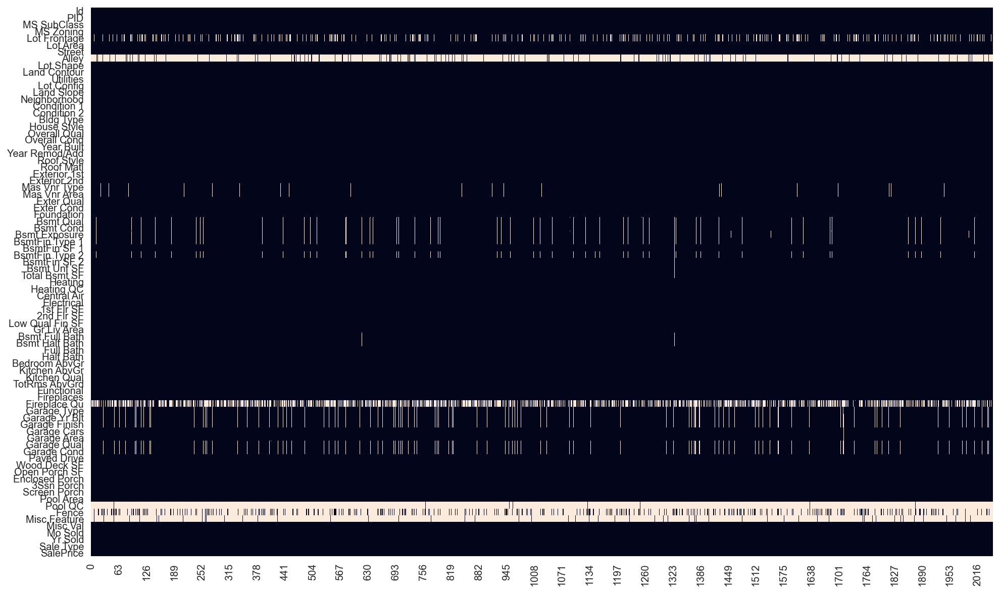

In [17]:
g = sns.heatmap(train.T.isna(), yticklabels=True, cbar=None)
g.figure.set_size_inches(16, 10);

In [18]:
# Saving sum of null values in each column into variable 'nullvalues'
nullval = train.isnull().sum()
nullval[nullval!=0].index # Printing columns with more than 1 null value.

Index(['Lot Frontage', 'Alley', 'Mas Vnr Type', 'Mas Vnr Area', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Fireplace Qu', 'Garage Type',
       'Garage Yr Blt', 'Garage Finish', 'Garage Cars', 'Garage Area', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Fence', 'Misc Feature'],
      dtype='object')

In [19]:
# As there are two different methods of dealing with null values for categorical and numerical values, we will split them.
# Display columns containing null values that are of type 'float64'
train[nullval[nullval!=0].index].dtypes[train.dtypes == 'float64']

Lot Frontage      float64
Mas Vnr Area      float64
BsmtFin SF 1      float64
BsmtFin SF 2      float64
Bsmt Unf SF       float64
Total Bsmt SF     float64
Bsmt Full Bath    float64
Bsmt Half Bath    float64
Garage Yr Blt     float64
Garage Cars       float64
Garage Area       float64
dtype: object

In [20]:
# Display columns containing null values that are strings.
train[nullval[nullval!=0].index].dtypes[train.dtypes != 'float64']

Alley             object
Mas Vnr Type      object
Bsmt Qual         object
Bsmt Cond         object
Bsmt Exposure     object
BsmtFin Type 1    object
BsmtFin Type 2    object
Fireplace Qu      object
Garage Type       object
Garage Finish     object
Garage Qual       object
Garage Cond       object
Pool QC           object
Fence             object
Misc Feature      object
dtype: object

In [21]:
# Saving categorical column names as new variable
categorical_nullval = train[nullval[nullval!=0].index].dtypes[train.dtypes == 'object'].index

In [22]:
# Display columns containing null values
train.isnull().sum()[train.isnull().sum() != 0]

Lot Frontage       330
Alley             1911
Mas Vnr Type        22
Mas Vnr Area        22
Bsmt Qual           55
Bsmt Cond           55
Bsmt Exposure       58
BsmtFin Type 1      55
BsmtFin SF 1         1
BsmtFin Type 2      56
BsmtFin SF 2         1
Bsmt Unf SF          1
Total Bsmt SF        1
Bsmt Full Bath       2
Bsmt Half Bath       2
Fireplace Qu      1000
Garage Type        113
Garage Yr Blt      114
Garage Finish      114
Garage Cars          1
Garage Area          1
Garage Qual        114
Garage Cond        114
Pool QC           2042
Fence             1651
Misc Feature      1986
dtype: int64

#### 1.4.1 Cleaning of Catergoical Null Data
[*Jump to table of contents*](#Table-of-Contents)

In [23]:
# Print categorical columns with null data.
train[categorical_nullval].head()

,Alley,Mas Vnr Type,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Pool QC,Fence,Misc Feature
0,NaN,BrkFace,TA,TA,No,GLQ,Unf,NaN,Attchd,RFn,TA,TA,NaN,NaN,NaN
1,NaN,BrkFace,Gd,TA,No,GLQ,Unf,TA,Attchd,RFn,TA,TA,NaN,NaN,NaN
2,NaN,None,TA,TA,No,GLQ,Unf,NaN,Detchd,Unf,TA,TA,NaN,NaN,NaN
3,NaN,None,Gd,TA,No,Unf,Unf,NaN,BuiltIn,Fin,TA,TA,NaN,NaN,NaN
4,NaN,None,Fa,Gd,No,Unf,Unf,NaN,Detchd,Unf,TA,TA,NaN,NaN,NaN


In [24]:
train['Alley'].value_counts()

Grvl    85
Pave    55
Name: Alley, dtype: int64

In [25]:
train['Fence'].value_counts()

MnPrv    227
GdPrv     83
GdWo      80
MnWw      10
Name: Fence, dtype: int64

In [26]:
train['Misc Feature'].value_counts()

Shed    56
Gar2     4
Othr     3
Elev     1
TenC     1
Name: Misc Feature, dtype: int64

When checked against the data dictionary, it's likely that the missing values for columns; `"Alley"`, `"Fence"` and `"Misc Feature"` correspond to records which do not have such features (e.g. NA - No Alley etc.). Hence we will replace null figures with 'None'.

In [27]:
# Replace NaN values with 'None'
for value in ['Alley', 'Fence', 'Misc Feature']:
    train[value] = train[value].replace(np.nan, 'None')

In [28]:
train[(train['Mas Vnr Type'].isnull()) & train['Mas Vnr Area'] !=0].shape

(0, 81)

In [29]:
train[(train['Fireplace Qu'].isnull()) & train['Fireplaces'] !=0].shape

(0, 81)

In [30]:
train[(train['Pool QC'].isnull()) & train['Pool Area'] !=0].shape

(0, 81)

For `"Mas Vnr Type"`, `"Fireplace Qu"` and `"Pool QC"`, missing values correspond to houses' zero Masonry veneer area Pool Areas and Fireplaces. Hence we will also replace the null figures with 'None'

In [31]:
# Replace NaN values with 'None'
for value in ['Mas Vnr Type', 'Fireplace Qu', 'Pool QC']:
    train[value] = train[value].replace(np.nan, 'None')

In [32]:
train[(train['BsmtFin Type 1'].isnull()) & train['Total Bsmt SF'] !=0].shape

(0, 81)

In [33]:
# train[(train['BsmtFin Type 2'].isnull()) & train['Total Bsmt SF'] !=0].shape
train[(train['BsmtFin Type 2'].isnull()) & train['Total Bsmt SF'] !=0]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
1147,445,528142130,20,RL,85.0,10655,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,296.0,Gd,TA,PConc,Gd,TA,No,GLQ,1124.0,NaN,479.0,1603.0,3206.0,GasA,Ex,Y,SBrkr,1629,0,0,1629,1.0,0.0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2003.0,RFn,3.0,880.0,TA,TA,Y,0,0,0,0,0,0,None,None,None,0,10,2009,WD,284000


In [34]:
# train[(train['Bsmt Exposure'].isnull()) & train['Total Bsmt SF'] !=0].shape
train[(train['Bsmt Exposure'].isnull()) & train['Total Bsmt SF'] !=0]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
1456,1797,528458090,60,FV,81.0,10411,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,Somerst,Norm,Norm,1Fam,2Story,5,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,CBlock,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,GasA,Ex,Y,SBrkr,725,863,0,1588,0.0,0.0,3,0,3,1,Gd,8,Typ,0,None,Attchd,2007.0,Unf,2.0,561.0,TA,TA,Y,0,0,0,0,0,0,None,None,None,0,7,2007,New,212109
1547,67,528445060,20,RL,73.0,8987,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2005,2006,Gable,CompShg,VinylSd,VinylSd,BrkFace,226.0,Gd,TA,PConc,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,GasA,Ex,Y,SBrkr,1595,0,0,1595,0.0,0.0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2005.0,RFn,3.0,880.0,TA,TA,Y,144,0,0,0,0,0,None,None,None,0,5,2010,WD,221500
1997,2780,907194130,60,RL,65.0,14006,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,144.0,Gd,TA,PConc,Gd,TA,NaN,Unf,0.0,Unf,0.0,936.0,936.0,GasA,Ex,Y,SBrkr,936,840,0,1776,0.0,0.0,2,1,3,1,Gd,7,Typ,1,TA,Attchd,2002.0,RFn,2.0,474.0,TA,TA,Y,144,96,0,0,0,0,None,None,None,0,2,2006,WD,192500


From the **train.info()**, we can see that there is a total of 55 listings without a Basement, hence `"Total Bsmt SF"` == 0. However, there are 1 listing with a basement but the Basement Finish Type 2 missing & 3 listings with Basement Exposure Missing. Hence we will replace the missing values with the mode of the respective columns. For the other 55 listings, we will change the null values to 'None'.

In [35]:
# obtain the mode of these 2 columns
train[['Bsmt Exposure', 'BsmtFin Type 2']].mode()

,Bsmt Exposure,BsmtFin Type 2
0,No,Unf


In [36]:
# impute the missing values for Bsmt Exposure column
index_to_clean = [1456, 1547, 1997]
for idx in index_to_clean:
    train.loc[idx, 'Bsmt Exposure'] = 'No'

In [37]:
train.loc[1147, 'BsmtFin Type 2'] = 'Unf'

In [38]:
# Replace NaN values with 'None'
for value in ['Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2']:
    train[value] = train[value].replace(np.nan, 'None')

In [39]:
# Check if null values for Garage Finish, Garage Yr Blt, Garage Qual, Garage Cond are from same rows
train[(train['Garage Finish'].isnull()) & (train['Garage Yr Blt'].isnull()) & (train['Garage Qual'].isnull()) & (train['Garage Cond'].isnull())].shape

(114, 81)

In [40]:
# Check irregular row with Garage Type filled, but not the rest of the Garage column data
train[(train['Garage Type'].notnull()) & (train['Garage Finish'].isnull())][['Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Cars', 'Garage Area', 'Garage Qual', 'Garage Cond']]


,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
1712,Detchd,NaN,NaN,NaN,NaN,NaN,NaN


From **train.info()**, we can see that there is a total of 114 listings without a Garage, hence `"Garage Area"` == 0. However, there is 1 listing with a Garage Type but no other details. 

With the assumption that they have a garage but did not fill in the other details, we will replace the missing values with the mode of the respective columns. For the other 113 listings, we will change the null values to 'None'.

In [41]:
# Obtain the mode of these 3 columns
train[['Garage Finish', 'Garage Qual', 'Garage Cond']].mode()

,Garage Finish,Garage Qual,Garage Cond
0,Unf,TA,TA


In [42]:
# Impute null values of Garage Finish, Garage Qual and Garage Cond with the mode obtained
train.loc[1712, 'Garage Finish'] = 'Unf'
train.loc[1712, ['Garage Qual', 'Garage Cond']] = 'TA'

In [43]:
# Replace NaN values with 'None'
for value in ['Garage Finish', 'Garage Qual', 'Garage Cond', 'Garage Type']:
    train[value] = train[value].replace(np.nan, 'None')

In [44]:
# Check for null categorical data.
train.isnull().sum()[train.isnull().sum() != 0]

Lot Frontage      330
Mas Vnr Area       22
BsmtFin SF 1        1
BsmtFin SF 2        1
Bsmt Unf SF         1
Total Bsmt SF       1
Bsmt Full Bath      2
Bsmt Half Bath      2
Garage Yr Blt     114
Garage Cars         1
Garage Area         1
dtype: int64

#### 1.4.2 Cleaning of Numerical Null Data
[*Jump to table of contents*](#Table-of-Contents)

In [45]:
# View rows that have a null value in columns related to the basement
train[train['Bsmt Full Bath'].isnull()]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
616,1498,908154080,20,RL,123.0,47007,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,7,1959,1996,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,Slab,None,None,None,None,0.0,None,0.0,0.0,0.0,GasA,TA,Y,SBrkr,3820,0,0,3820,NaN,NaN,3,1,5,1,Ex,11,Typ,2,Gd,Attchd,1959.0,Unf,2.0,624.0,TA,TA,Y,0,372,0,0,0,0,None,None,None,0,7,2008,WD,284700
1327,1342,903230120,20,RM,99.0,5940,Pave,None,IR1,Lvl,AllPub,FR3,Gtl,BrkSide,Feedr,Norm,1Fam,1Story,4,7,1946,1950,Gable,CompShg,MetalSd,CBlock,None,0.0,TA,TA,PConc,None,None,None,None,NaN,None,NaN,NaN,NaN,GasA,TA,Y,FuseA,896,0,0,896,NaN,NaN,1,0,2,1,TA,4,Typ,0,None,Detchd,1946.0,Unf,1.0,280.0,TA,TA,Y,0,0,0,0,0,0,None,MnPrv,None,0,4,2008,ConLD,79000


In [46]:
train[train['Total Bsmt SF'] == 0].head()

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
12,807,906226060,70,RL,120.0,26400,Pave,None,Reg,Bnk,AllPub,FR2,Gtl,SawyerW,Feedr,Norm,1Fam,2Story,5,7,1880,2007,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,None,None,None,None,0.0,None,0.0,0.0,0.0,GasA,Ex,Y,SBrkr,1288,728,0,2016,0.0,0.0,1,0,4,1,TA,7,Mod,1,TA,Attchd,1900.0,Unf,2.0,576.0,TA,TA,P,0,0,0,0,0,0,None,None,None,0,6,2009,WD,131000
93,811,906226100,90,RL,64.0,7018,Pave,None,Reg,Bnk,AllPub,Inside,Gtl,SawyerW,Norm,Norm,Duplex,1Story,5,5,1979,1979,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,Slab,None,None,None,None,0.0,None,0.0,0.0,0.0,GasA,TA,Y,SBrkr,1535,0,0,1535,0.0,0.0,2,0,4,2,TA,8,Typ,0,None,Attchd,1979.0,Unf,2.0,400.0,TA,TA,Y,0,0,0,0,0,0,None,GdPrv,None,0,6,2009,WD,118858
114,781,905228050,20,RL,NaN,9000,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,2,2,1947,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,Slab,None,None,None,None,0.0,None,0.0,0.0,0.0,GasA,Fa,N,SBrkr,660,0,0,660,0.0,0.0,1,0,2,1,Fa,5,Min2,0,None,None,NaN,None,0.0,0.0,None,None,N,0,0,100,0,0,0,None,None,None,0,6,2009,WD,63900
146,888,908128060,85,RL,64.0,7301,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Norm,Norm,1Fam,SFoyer,7,5,2003,2003,Gable,CompShg,HdBoard,HdBoard,BrkFace,500.0,Gd,TA,Slab,None,None,None,None,0.0,None,0.0,0.0,0.0,GasA,Ex,Y,SBrkr,495,1427,0,1922,0.0,0.0,3,0,4,1,Gd,7,Typ,1,Ex,BuiltIn,2003.0,RFn,2.0,672.0,TA,TA,Y,0,0,177,0,0,0,None,None,None,0,7,2009,ConLD,198500
183,1554,910251050,20,A (agr),80.0,14584,Pave,None,Reg,Low,AllPub,Inside,Mod,IDOTRR,Norm,Norm,1Fam,1Story,1,5,1952,1952,Gable,CompShg,AsbShng,VinylSd,None,0.0,Fa,Po,Slab,None,None,None,None,0.0,None,0.0,0.0,0.0,Wall,Po,N,FuseA,733,0,0,733,0.0,0.0,1,0,2,1,Fa,4,Sal,0,None,Attchd,1952.0,Unf,2.0,487.0,Fa,Po,N,0,0,0,0,0,0,None,None,None,0,2,2008,WD,13100


Assuming that the listing with `"Total Bsmt SF"` == null do not have a Basement, we will replace basement related numerical value with 0, which is the same for all other listings without a basement.

In [47]:
# Fill null values of these basement related columns with 0
for value in ['Bsmt Full Bath', 'Bsmt Half Bath', 'Bsmt Unf SF', 'Total Bsmt SF', 'BsmtFin SF 1', 'BsmtFin SF 2']:
    train[value] = train[value].replace(np.nan, 0.0)

In [48]:
train.isnull().sum()[train.isnull().sum() != 0]

Lot Frontage     330
Mas Vnr Area      22
Garage Yr Blt    114
Garage Cars        1
Garage Area        1
dtype: int64

In [49]:
# View rows that have a null value in columns related to the basement
train[train['Garage Cars'].isnull()][['Garage Type','Garage Yr Blt','Garage Finish','Garage Area','Garage Qual','Garage Cond']]

,Garage Type,Garage Yr Blt,Garage Finish,Garage Area,Garage Qual,Garage Cond
1712,Detchd,NaN,Unf,NaN,TA,TA


We will drop this row as it will remove numerical null values from most of the numerical features that contain null values pertaining to Garage information. Removing three rows will only remove less than 1% of our observation and is unlikely to affect our data in a significant way.

In [50]:
# Drop row 1712
train.drop(1712, axis = 0, inplace = True)
train[train.columns[train.isnull().sum() != 0]].isnull().sum()

Lot Frontage     330
Mas Vnr Area      22
Garage Yr Blt    113
dtype: int64

#### 1.4.2a Garage Yr Blt 
[*Jump to table of contents*](#Table-of-Contents)

In [51]:
train[(train['Garage Yr Blt'].isnull()) & (train['Garage Area'].isnull())]

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice


As the `Garage Yr Built` corresponds with the lackthereof a Garage, we will replace all Null data with "0"

In [52]:
for value in ['Garage Yr Blt']:
    train[value] = train[value].replace(np.nan, 0)

#### 1.4.2b Mas Vnr Area
[*Jump to table of contents*](#Table-of-Contents)

In [53]:
train[(train['Mas Vnr Area'].isnull()) & train['Mas Vnr Type'] == 'None']

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice


As the `Mas Vnr Area` corresponds with the lackthereof a Garage, we will replace all Null data with "0"

In [54]:
for value in ['Mas Vnr Area']:
    train[value] = train[value].replace(np.nan, 0)

In [55]:
train[train.columns[train.isnull().sum() != 0]].isnull().sum()

Lot Frontage    330
dtype: int64

#### 1.4.2c Lot Frontage
[*Jump to table of contents*](#Table-of-Contents)

In [56]:
round(train['Lot Frontage'].median(),2)

68.0

In [57]:
for value in ['Lot Frontage']:
    train[value] = train[value].replace(np.nan, round(train['Lot Frontage'].median(),2))

In [58]:
train.drop('Id', axis = 1, inplace = True)
train.drop('PID', axis = 1, inplace = True)
train.head()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,60,RL,68.0,13517,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,None,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,None,None,None,0,3,2010,WD,130500
1,60,RL,43.0,11492,Pave,None,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,None,None,None,0,4,2009,WD,220000
2,20,RL,68.0,7922,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,None,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,None,None,None,0,1,2010,WD,109000
3,60,RL,73.0,9802,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,None,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,None,None,None,0,4,2010,WD,174000
4,50,RL,82.0,14235,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,None,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,None,None,None,0,3,2010,WD,138500


In [59]:
test.drop('Id', axis = 1, inplace = True)
test.drop('PID', axis = 1, inplace = True)
test.head()

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
0,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
1,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
3,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
4,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


### 1.5 Cleaning Test data
[*Jump to table of contents*](#Table-of-Contents)

In [60]:
# Converting 'Id', 'PID', 'MS SubClass' and 'Mo Sold' column to string
test['MS SubClass'] = pd.Series(np.array([str(i) for i in test['MS SubClass']]))
test['Mo Sold'] = pd.Series(np.array([str(i) for i in test['Mo Sold']]))

In [61]:
test.describe()

,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,BsmtFin SF 1,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,TotRms AbvGrd,Fireplaces,Garage Yr Blt,Garage Cars,Garage Area,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Yr Sold
count,718.000000,878.000000,878.000000,878.000000,878.000000,878.000000,877.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,833.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,69.545961,10307.033030,6.050114,5.566059,1970.492027,1984.417995,106.236032,441.328018,53.896355,539.133257,1034.357631,1145.787016,348.398633,2.728929,1496.914579,0.439636,0.055809,1.539863,0.398633,2.879271,1.047836,6.454442,0.618451,1976.759904,1.742597,470.362187,93.430524,47.070615,24.064920,2.597950,14.830296,1.884966,48.498861,2007.825740
std,23.533945,10002.674602,1.369065,1.128903,30.395895,20.450725,187.158908,438.457329,178.632355,426.172161,413.446291,375.264111,432.985566,32.572548,506.468967,0.529948,0.229683,0.559060,0.505927,0.830712,0.223966,1.596632,0.669571,25.689763,0.750391,212.734075,121.181702,68.180939,73.249463,24.962482,53.003794,29.916672,550.169317,1.327861
min,21.000000,1477.000000,2.000000,1.000000,1880.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,407.000000,0.000000,0.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000
25%,59.000000,7297.250000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,216.000000,789.000000,864.000000,0.000000,0.000000,1114.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,322.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000
50%,68.000000,9446.000000,6.000000,5.000000,1972.000000,1992.000000,0.000000,373.000000,0.000000,452.000000,975.000000,1063.000000,0.000000,0.000000,1436.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,473.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000
75%,80.000000,11589.000000,7.000000,6.000000,1999.750000,2003.000000,172.000000,734.750000,0.000000,780.000000,1247.000000,1358.000000,720.000000,0.000000,1779.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,170.750000,69.750000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000
max,182.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1378.000000,2288.000000,1526.000000,2046.000000,2630.000000,2674.000000,2065.000000,481.000000,4476.000000,2.000000,1.000000,4.000000,2.000000,6.000000,3.000000,12.000000,3.000000,2010.000000,4.000000,1488.000000,690.000000,742.000000,1012.000000,360.000000,576.000000,555.000000,15500.000000,2010.000000


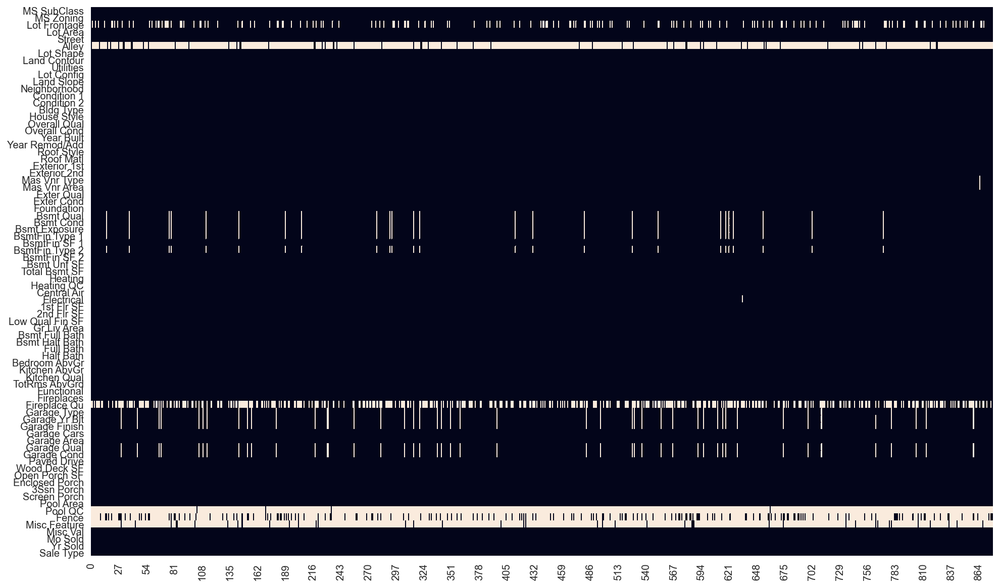

In [62]:
g = sns.heatmap(test.T.isna(), yticklabels=True, cbar=None)
g.figure.set_size_inches(16, 10);

In [63]:
# Saving sum of null values in each column into variable 'nullvalues'
nullval = test.isnull().sum()
nullval[nullval!=0].index # Printing columns with more than 1 null value.

Index(['Lot Frontage', 'Alley', 'Mas Vnr Type', 'Mas Vnr Area', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2',
       'Electrical', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Fence',
       'Misc Feature'],
      dtype='object')

In [64]:
# As there are two different methods of dealing with null values for categorical and numerical values, we will split them.
# Display columns containing null values that are of type 'float64'
test[nullval[nullval!=0].index].dtypes[test.dtypes == 'float64']

Lot Frontage     float64
Mas Vnr Area     float64
Garage Yr Blt    float64
dtype: object

In [65]:
# Display columns containing null values that are strings.
test[nullval[nullval!=0].index].dtypes[train.dtypes != 'float64']

Alley             object
Mas Vnr Type      object
Bsmt Qual         object
Bsmt Cond         object
Bsmt Exposure     object
BsmtFin Type 1    object
BsmtFin Type 2    object
Electrical        object
Fireplace Qu      object
Garage Type       object
Garage Finish     object
Garage Qual       object
Garage Cond       object
Pool QC           object
Fence             object
Misc Feature      object
dtype: object

#### 1.5.1 Test Dataset - Cleaning Categorical Data
[*Jump to table of contents*](#Table-of-Contents)

In [66]:
# Print categorical columns with null data.
test[categorical_nullval].head()

,Alley,Mas Vnr Type,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Pool QC,Fence,Misc Feature
0,Grvl,None,Fa,TA,No,Unf,Unf,NaN,Detchd,Unf,Po,Po,NaN,NaN,NaN
1,NaN,None,Gd,TA,No,Unf,Unf,NaN,Attchd,Fin,TA,TA,NaN,NaN,NaN
2,NaN,None,Gd,Gd,Av,GLQ,Unf,Gd,Attchd,RFn,TA,TA,NaN,NaN,NaN
3,NaN,None,TA,TA,No,Unf,Unf,NaN,Detchd,Unf,Fa,TA,NaN,NaN,NaN
4,NaN,BrkFace,Gd,TA,No,BLQ,Unf,Gd,Attchd,RFn,TA,TA,NaN,NaN,NaN


In [67]:
test['Alley'].value_counts()

Grvl    35
Pave    23
Name: Alley, dtype: int64

In [68]:
test['Fence'].value_counts()

MnPrv    103
GdPrv     35
GdWo      32
MnWw       2
Name: Fence, dtype: int64

In [69]:
test['Misc Feature'].value_counts()

Shed    39
Gar2     1
Othr     1
Name: Misc Feature, dtype: int64

In [70]:
# Replace NaN values with 'None'
for value in ['Alley', 'Fence', 'Misc Feature']:
    test[value] = test[value].replace(np.nan, 'None')

In [71]:
print(test[(test['Mas Vnr Type'].isnull()) & test['Mas Vnr Area'] !=0].shape)
print(test[(test['Fireplace Qu'].isnull()) & test['Fireplaces'] !=0].shape)
print(test[(test['Pool QC'].isnull()) & test['Pool Area'] !=0].shape)

(0, 78)
(0, 78)
(0, 78)


In [72]:
# Replace NaN values with 'None'
for value in ['Mas Vnr Type', 'Fireplace Qu', 'Pool QC']:
    test[value] = test[value].replace(np.nan, 'None')

In [73]:
print(test[(test['BsmtFin Type 1'].isnull()) & test['Total Bsmt SF'] !=0].shape)
print(test[(test['BsmtFin Type 2'].isnull()) & test['Total Bsmt SF'] !=0].shape)
print(test[(test['Bsmt Exposure'].isnull()) & test['Total Bsmt SF'] !=0].shape)

(0, 78)
(0, 78)
(0, 78)


In [74]:
for value in ['Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2']:
    test[value] = test[value].replace(np.nan, 'None')

In [75]:
# Check if null values for Garage Finish, Garage Yr Blt, Garage Qual, Garage Cond are from same rows
test[(test['Garage Finish'].isnull()) & (test['Garage Yr Blt'].isnull()) & (test['Garage Qual'].isnull()) & (test['Garage Cond'].isnull())].shape


(45, 78)

In [76]:
# Check irregular row with Garage Type filled, but not the rest of the Garage column data
test[(test['Garage Type'].notnull()) & (test['Garage Finish'].isnull())][['Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Cars', 'Garage Area', 'Garage Qual', 'Garage Cond']]


,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
764,Detchd,NaN,NaN,1,360,NaN,NaN


In [77]:
# obtain the mode of these 4 columns
test[['Garage Finish','Garage Qual','Garage Cond']].mode()

,Garage Finish,Garage Qual,Garage Cond
0,Unf,TA,TA


In [78]:
# Impute null values of Garage Finish, Garage Qual and Garage Cond with the mode obtained
test.loc[764, 'Garage Finish'] = 'Unf'
test.loc[764, ['Garage Qual', 'Garage Cond']] = 'TA'

In [79]:
# Replace NaN values with 'None'
for value in ['Garage Finish', 'Garage Qual', 'Garage Cond', 'Garage Type']:
    test[value] = test[value].replace(np.nan, 'None')

In [80]:
test[test.columns[test.isnull().sum() != 0]].isnull().sum()

Lot Frontage     160
Mas Vnr Area       1
Electrical         1
Garage Yr Blt     45
dtype: int64

#### 1.5.2 Test Dataset - Cleaning Numerical Datas
[*Jump to table of contents*](#Table-of-Contents)

In [81]:
test[(test['Garage Yr Blt'].isnull()) & (test['Garage Area'].isnull())]

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type


In [82]:
test.loc[764:764]

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
764,60,RM,57.0,8094,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2.5Unf,6,8,1910,1983,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,PConc,TA,TA,Mn,Rec,196,Unf,0,1046,1242,GasA,Gd,Y,SBrkr,1242,742,0,1984,0,0,2,0,5,1,TA,8,Typ,0,None,Detchd,NaN,Unf,1,360,TA,TA,Y,64,0,180,0,0,0,None,MnPrv,Shed,1000,9,2008,WD


In [83]:
test.loc[764,'Garage Yr Blt'] =1910

In [84]:
test.loc[764:764]

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
764,60,RM,57.0,8094,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2.5Unf,6,8,1910,1983,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,PConc,TA,TA,Mn,Rec,196,Unf,0,1046,1242,GasA,Gd,Y,SBrkr,1242,742,0,1984,0,0,2,0,5,1,TA,8,Typ,0,None,Detchd,1910.0,Unf,1,360,TA,TA,Y,64,0,180,0,0,0,None,MnPrv,Shed,1000,9,2008,WD


In [85]:
for value in ['Garage Yr Blt']:
    test[value] = test[value].replace(np.nan, 0)

In [86]:
test[test['Mas Vnr Area'].isnull()]

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
865,60,RL,70.0,8749,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2002,2002,Gable,CompShg,VinylSd,VinylSd,None,NaN,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,840,840,GasA,Ex,Y,SBrkr,840,885,0,1725,0,0,2,1,3,1,Gd,6,Typ,0,None,Attchd,2002.0,RFn,2,550,TA,TA,Y,0,48,0,0,0,0,None,None,None,0,11,2009,WD


In [87]:
for value in ['Mas Vnr Area']:
    test[value] = test[value].replace(np.nan, 0)

In [88]:
test[test['Electrical'].isnull()]

,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
634,80,RL,73.0,9735,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,None,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,None,None,None,0,5,2008,WD


In [89]:
# Drop row 634
test.drop(634, axis = 0, inplace = True)
test[test.columns[test.isnull().sum() != 0]].isnull().sum()

Lot Frontage    160
dtype: int64

In [90]:
for value in ['Lot Frontage']:
    test[value] = test[value].replace(np.nan, round(test['Lot Frontage'].median(),2))

## 2. Mapping of Ordinal Data
[*Jump to table of contents*](#Table-of-Contents)

In [91]:
# Creating list of ordinal variables
ordinal_var = ['Lot Shape', 'Utilities', 'Land Slope', 'Exter Qual',
       'Exter Cond', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure',
       'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating QC', 'Kitchen Qual',
       'Functional', 'Fireplace Qu', 'Garage Finish', 'Garage Qual',
       'Garage Cond', 'Paved Drive', 'Pool QC']
train[ordinal_var].head()

,Lot Shape,Utilities,Land Slope,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Kitchen Qual,Functional,Fireplace Qu,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC
0,IR1,AllPub,Gtl,Gd,TA,TA,TA,No,GLQ,Unf,Ex,Gd,Typ,None,RFn,TA,TA,Y,None
1,IR1,AllPub,Gtl,Gd,TA,Gd,TA,No,GLQ,Unf,Ex,Gd,Typ,TA,RFn,TA,TA,Y,None
2,Reg,AllPub,Gtl,TA,Gd,TA,TA,No,GLQ,Unf,TA,Gd,Typ,None,Unf,TA,TA,Y,None
3,Reg,AllPub,Gtl,TA,TA,Gd,TA,No,Unf,Unf,Gd,TA,Typ,None,Fin,TA,TA,Y,None
4,IR1,AllPub,Gtl,TA,TA,Fa,Gd,No,Unf,Unf,TA,TA,Typ,None,Unf,TA,TA,N,None


In [92]:
# Creating 'ordinal_dictionary' consisting of key value pairs mapping the column name to a dictionary.
# The inside dictionary maps each ordinal category in the column to an integer that represents its value.
ordinal_dict = {
    
    # General shape of property.
    'Lot Shape':{ 
        'IR3':3, # Irregular
        'IR2':2, # Moderately Irregular
        'IR1':1, # Slightly irregular
        'Reg':0  # Regular
    },
    
    # Type of utilities available.
    'Utilities':{ 
        'AllPub':4, # AllPub All public Utilities (E,G,W,& S)
        'NoSewr':3, # Electricity, Gas, and Water (Septic Tank)
        'NoSeWa':2, # Electricity and Gas Only
        'ELO':1     # Electricity only
    },
    
    # Slope of property.
    'Land Slope':{
        'Sev':3, # Severe Slope
        'Mod':2, # Moderate Slope
        'Gtl':1  # Gentle slope
    },
    
    # Exterior material quality.
    'Exter Qual':{
        'Ex':4, # Excellent
        'Gd':3, # Good
        'TA':2, # Average/Typical
        'Fa':1, # Fair
        'Po':0 # Poor
    },
    
    # Present condition of the material on the exterior.
    'Exter Cond':{
        'Ex':4, # Excellent
        'Gd':3, # Good
        'TA':2, # Average/Typical
        'Fa':1, # Fair
        'Po':0  # Poor
    },
        
    # Height of the basement.
    'Bsmt Qual':{
        'Ex':5,   # Excellent (100+ inches)
        'Gd':4,   # Good (90-99 inches)
        'TA':3,   # Average/Typical (80-89 inches)
        'Fa':2,   # Fair (70-79 inches)
        'Po':1,   # Poor (<70 inches)
        'None':0  # No basement
    },
    
    # General condition of the basement.
    'Bsmt Cond':{
        'Ex':5,  # Excellent
        'Gd':4,  # Good
        'TA':3,  # Typical - slight dampness allowed
        'Fa':2,  # Fair - dampness or some cracking or settling
        'Po':1,  # Poor - severe cracking, settling, or wetness
        'None':0 # No basement
    },
    
    # Walkout or garden level basement walls.
    'Bsmt Exposure':{
        'Gd':4,   # Good exposure
        'Av':3,   # Average exposure
        'Mn':2,   # Minimum exposure
        'No':1,   # No exposure
        'None':0  # No basement
    },
    
    # Quality of basement finished area.
    'BsmtFin Type 1':{
        'GLQ':6,   # Good Living Quarters
        'ALQ':5,   # Average Living Quarters
        'BLQ':4,   # Below average Living Quarters
        'Rec':3,   # Average Rec Room
        'LwQ':2,   # Low Quality
        'Unf':1,   # Unfinished
        'None':0   # No basement
    },
    # Quality of second finished area (if present)
    'BsmtFin Type 2':{
        'GLQ':6,   # Good Living Quarters
        'ALQ':5,   # Average Living Quarters
        'BLQ':4,   # Below average Living Quarters
        'Rec':3,   # Average Rec Room
        'LwQ':2,   # Low Quality
        'Unf':1,   # Unfinished
        'None':0   # No basement
    },
    
    # Heating quality and condition.
    'Heating QC':{
        'Ex':5, # Excellent
        'Gd':4, # Good
        'TA':3, # Average/Typical
        'Fa':2, # Fair
        'Po':1  # Poor
    },
    
    # Kitchen quality.
    'Kitchen Qual':{
        'Ex':5, # Excellent
        'Gd':4, # Good
        'TA':3, # Average/Typical
        'Fa':2, # Fair
        'Po':1  # Poor        
    },
    
    # Home functionality rating.
    'Functional':{
        'Typ':7,  # Typical Functionality
        'Min1':6, # Minor Deductions 1
        'Min2':5, # Minor Deductions 2
        'Mod':4,  # Moderate Deductions
        'Maj1':3, # Major Deductions 1
        'Maj2':2, # Major Deductions 2
        'Sev':1,  # Severely Damaged
        'Sal':0   # Salvage only
    },
       # Fireplace quality.
    'Fireplace Qu':{
        'Ex':5, # Excellent - Exceptional Masonry Fireplace
        'Gd':4, # Good - Masonry Fireplace in main level
        'TA':3, # Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
        'Fa':2, # Fair - Prefabricated Fireplace in basement
        'Po':1, # Poor - Ben Franklin Stove
        'None':0 # NA - No Fireplace
    },
    
    # Interior finish of the garage.
    'Garage Finish':{
        'Fin':3,  # Finished
        'RFn':2,  # Rough Finished
        'Unf':1,  # Unfinished
        'None':0  # No Garage
    },
    
    # Garage Quality.
    'Garage Qual':{
        'Ex':5,  # Excellent
        'Gd':4,  # Good
        'TA':3,  # Average/Typical
        'Fa':2,  # Fair
        'Po':1,   # Poor   
        'None':0 # No Garage
    },
    
    # Garage condition.
    'Garage Cond':{
        'Ex':5,  # Excellent
        'Gd':4,  # Good
        'TA':3,  # Average/Typical
        'Fa':2,  # Fair
        'Po':1,  # Poor  
        'None':0 # No Garage
    },
    
    # Paved driveway.
    'Paved Drive':{
        'Y':2, # Paved
        'P':1, # Partial Pavement
        'N':0  # Dirt/Gravel
    },
       # Pool quality.
    'Pool QC':{
        'Ex':5,  # Excellent
        'Gd':4,  # Good
        'TA':3,  # Average/Typical
        'Fa':2,  # Fair
        'Po':1,  # Poor
        'None':0 # No Pool
    }
    
} 

In [93]:
# Print out any values that exist in train but do not exist in the dictionary
for column in ordinal_dict:
    for cat in train[column].unique():
        if (cat in ordinal_dict[column].keys()):
            pass
        else:
            print(column, cat)

In [94]:
# Iterate over the train dataset to map the values.
for column in ordinal_dict:
    for cat in ordinal_dict[column]:
        train[column] = train[column].replace(cat,ordinal_dict[column][cat])

In [95]:
# View first five rows of columns in ordinal_var
train[ordinal_var].head()

,Lot Shape,Utilities,Land Slope,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Kitchen Qual,Functional,Fireplace Qu,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC
0,1,4,1,3,2,3,3,1,6,1,5,4,7,0,2,3,3,2,0
1,1,4,1,3,2,4,3,1,6,1,5,4,7,3,2,3,3,2,0
2,0,4,1,2,3,3,3,1,6,1,3,4,7,0,1,3,3,2,0
3,0,4,1,2,2,4,3,1,1,1,4,3,7,0,3,3,3,2,0
4,1,4,1,2,2,2,4,1,1,1,3,3,7,0,1,3,3,0,0


In [96]:
# Iterate over the train dataset to map the values.
for column in ordinal_dict:
    for cat in ordinal_dict[column]:
        test[column] = test[column].replace(cat,ordinal_dict[column][cat])

In [97]:
# View first five rows of columns in ordinal_var
test[ordinal_var].head()

,Lot Shape,Utilities,Land Slope,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Kitchen Qual,Functional,Fireplace Qu,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC
0,0,4,1,2,1,2,3,1,1,1,4,2,7,0,1,1,1,2,0
1,1,4,1,2,2,4,3,1,1,1,3,3,7,0,3,3,3,2,0
2,1,4,1,3,2,4,4,3,6,1,5,4,7,4,2,3,3,2,0
3,0,4,1,3,2,3,3,1,1,1,3,3,7,0,1,2,3,0,0
4,1,4,1,2,2,4,3,1,4,1,4,3,7,4,2,3,3,2,0


In [98]:
# View dtypes of ordinal_var
train[ordinal_var].dtypes

Lot Shape         int64
Utilities         int64
Land Slope        int64
Exter Qual        int64
Exter Cond        int64
Bsmt Qual         int64
Bsmt Cond         int64
Bsmt Exposure     int64
BsmtFin Type 1    int64
BsmtFin Type 2    int64
Heating QC        int64
Kitchen Qual      int64
Functional        int64
Fireplace Qu      int64
Garage Finish     int64
Garage Qual       int64
Garage Cond       int64
Paved Drive       int64
Pool QC           int64
dtype: object

In [99]:
# View dtypes of ordinal_var
test[ordinal_var].dtypes

Lot Shape         int64
Utilities         int64
Land Slope        int64
Exter Qual        int64
Exter Cond        int64
Bsmt Qual         int64
Bsmt Cond         int64
Bsmt Exposure     int64
BsmtFin Type 1    int64
BsmtFin Type 2    int64
Heating QC        int64
Kitchen Qual      int64
Functional        int64
Fireplace Qu      int64
Garage Finish     int64
Garage Qual       int64
Garage Cond       int64
Paved Drive       int64
Pool QC           int64
dtype: object

In [100]:
# Removing case and spaces from column names
train.columns = train.columns.str.lower().str.replace(' ','_')

In [101]:
# Removing case and spaces from column names
test.columns = test.columns.str.lower().str.replace(' ','_')

In [102]:
# Display column names
train.columns

Index(['ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street', 'alley', 'lot_shape', 'land_contour', 'utilities', 'lot_config',
       'land_slope', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type', 'house_style', 'overall_qual', 'overall_cond', 'year_built',
       'year_remod/add', 'roof_style', 'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type', 'mas_vnr_area', 'exter_qual', 'exter_cond',
       'foundation', 'bsmt_qual', 'bsmt_cond', 'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2', 'bsmt_unf_sf',
       'total_bsmt_sf', 'heating', 'heating_qc', 'central_air', 'electrical', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area',
       'bsmt_full_bath', 'bsmt_half_bath', 'full_bath', 'half_bath', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual', 'totrms_abvgrd', 'functional',
       'fireplaces', 'fireplace_qu', 'garage_type', 'garage_yr_blt', 'garage_finish', 'garage_cars', 'garage_area', 'garage_qual', 'garage_c

In [103]:
# Display column names
test.columns

Index(['ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street', 'alley', 'lot_shape', 'land_contour', 'utilities', 'lot_config',
       'land_slope', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type', 'house_style', 'overall_qual', 'overall_cond', 'year_built',
       'year_remod/add', 'roof_style', 'roof_matl', 'exterior_1st', 'exterior_2nd', 'mas_vnr_type', 'mas_vnr_area', 'exter_qual', 'exter_cond',
       'foundation', 'bsmt_qual', 'bsmt_cond', 'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2', 'bsmt_unf_sf',
       'total_bsmt_sf', 'heating', 'heating_qc', 'central_air', 'electrical', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area',
       'bsmt_full_bath', 'bsmt_half_bath', 'full_bath', 'half_bath', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual', 'totrms_abvgrd', 'functional',
       'fireplaces', 'fireplace_qu', 'garage_type', 'garage_yr_blt', 'garage_finish', 'garage_cars', 'garage_area', 'garage_qual', 'garage_c

In [104]:
# Creating new list of nominal variables based on dtype
nominal = []
for column in train.dtypes[train.dtypes == 'object'].index:
    nominal.append(column)
nominal

['ms_subclass',
 'ms_zoning',
 'street',
 'alley',
 'land_contour',
 'lot_config',
 'neighborhood',
 'condition_1',
 'condition_2',
 'bldg_type',
 'house_style',
 'roof_style',
 'roof_matl',
 'exterior_1st',
 'exterior_2nd',
 'mas_vnr_type',
 'foundation',
 'heating',
 'central_air',
 'electrical',
 'garage_type',
 'fence',
 'misc_feature',
 'mo_sold',
 'sale_type']

In [105]:
cont_numeric =['lot_frontage', 'lot_area', 'mas_vnr_area', 'bsmtfin_sf_1', 'bsmtfin_sf_2', 'bsmt_unf_sf', 
               'total_bsmt_sf', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf', 'gr_liv_area', 'garage_area', 
               'wood_deck_sf', 'open_porch_sf', 'enclosed_porch', '3ssn_porch', 'screen_porch', 'saleprice']

In [106]:
dis_numeric = []
for column in train.dtypes[train.dtypes != 'object'].index:
    if column in cont_numeric:
        pass
    else:
        dis_numeric.append(column)
dis_numeric

['lot_shape',
 'utilities',
 'land_slope',
 'overall_qual',
 'overall_cond',
 'year_built',
 'year_remod/add',
 'exter_qual',
 'exter_cond',
 'bsmt_qual',
 'bsmt_cond',
 'bsmt_exposure',
 'bsmtfin_type_1',
 'bsmtfin_type_2',
 'heating_qc',
 'bsmt_full_bath',
 'bsmt_half_bath',
 'full_bath',
 'half_bath',
 'bedroom_abvgr',
 'kitchen_abvgr',
 'kitchen_qual',
 'totrms_abvgrd',
 'functional',
 'fireplaces',
 'fireplace_qu',
 'garage_yr_blt',
 'garage_finish',
 'garage_cars',
 'garage_qual',
 'garage_cond',
 'paved_drive',
 'pool_area',
 'pool_qc',
 'misc_val',
 'yr_sold']

In [107]:
# Check if length of all newly created lists match the length of 'train' columns
(len(cont_numeric) + len(dis_numeric) + len(nominal)) == (len(train.columns))

True

## 3. EDA

### 3.1 Sales Price Analysis
[*Jump to table of contents*](#Table-of-Contents)

In [108]:
# generate descriptive statistics for numerical columns
train.describe()

,lot_frontage,lot_area,lot_shape,utilities,land_slope,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating_qc,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,misc_val,yr_sold,saleprice
count,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000
mean,68.894634,10065.698537,0.404390,3.998537,1.052683,6.112683,5.561951,1971.732683,1984.182927,98.674634,2.406341,2.085854,3.489756,2.929268,1.630732,3.563902,442.033171,1.275122,47.959024,567.576585,1057.568780,4.158049,1164.596585,329.057561,5.515610,1499.169756,0.427317,0.063415,1.577073,0.371220,2.843415,1.042927,3.517073,6.436098,6.842927,0.591220,1.764390,1869.540000,1.723902,1.776585,473.671707,2.804390,2.811707,1.833659,93.794634,47.580000,22.479512,2.592683,16.519512,2.399024,0.015122,51.599512,2007.776098,181484.609268
std,21.311000,6744.097442,0.566582,0.049377,0.244321,1.426407,1.104724,30.166057,21.038838,174.353604,0.588037,0.372879,0.901786,0.572147,1.078080,2.125874,461.301632,0.949386,165.000901,445.095355,449.996406,0.964168,396.513176,425.597182,51.081185,500.517246,0.522631,0.251648,0.549334,0.501098,0.826813,0.209839,0.665654,1.560576,0.683567,0.638539,1.807095,452.312433,0.898382,0.764537,215.934561,0.718765,0.713572,0.534910,128.568578,66.755256,59.713182,25.235706,57.387043,37.791752,0.236424,573.532756,1.312222,79275.121591
min,21.000000,1300.000000,0.000000,2.000000,1.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,12789.000000
25%,60.000000,7500.000000,0.000000,4.000000,1.000000,5.000000,5.000000,1954.000000,1964.250000,0.000000,2.000000,2.000000,3.000000,3.000000,1.000000,1.000000,0.000000,1.000000,0.000000,220.000000,793.000000,3.000000,879.250000,0.000000,0.000000,1128.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,3.000000,5.000000,7.000000,0.000000,0.000000,1957.250000,1.000000,1.000000,319.000000,3.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129812.500000
50%,68.000000,9432.000000,0.000000,4.000000,1.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,2.000000,2.000000,4.000000,3.000000,1.000000,4.000000,368.000000,1.000000,0.000000,474.500000,994.500000,5.000000,1093.000000,0.000000,0.000000,1444.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,3.000000,6.000000,7.000000,1.000000,1.000000,1978.000000,2.000000,2.000000,480.000000,3.000000,3.000000,2.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,162500.000000
75%,78.000000,11514.250000,1.000000,4.000000,1.000000,7.000000,

In [109]:
train[train['gr_liv_area'] <= 500]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice
432,30,RL,60.0,8400,Pave,None,0,Bnk,4,Inside,1,SWISU,Norm,Norm,1Fam,1Story,2,5,1920,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,2,2,CBlock,3,2,1,3,290.0,1,0.0,0.0,290.0,GasA,3,N,FuseF,438,0,0,438,0.0,0.0,1,0,1,1,2,3,7,0,0,Detchd,1930.0,1,1.0,246.0,3,3,0,0,0,0,0,0,0,0,None,None,0,1,2009,WD,60000
1292,30,RL,60.0,8088,Pave,Grvl,0,Lvl,4,Inside,1,Edwards,Feedr,Norm,1Fam,1Story,2,3,1922,1955,Gable,CompShg,MetalSd,MetalSd,None,0.0,2,2,BrkTil,3,3,1,1,0.0,1,0.0,498.0,498.0,GasA,3,N,FuseF,498,0,0,498,0.0,0.0,1,0,1,1,3,3,7,0,0,Detchd,1922.0,1,1.0,216.0,2,2,0,0,0,100,0,0,0,0,None,None,0,2,2006,ConLD,35000
1428,20,RL,50.0,5000,Pave,None,0,Low,4,Inside,2,BrkSide,Norm,Norm,1Fam,1Story,1,3,1946,1950,Gable,CompShg,VinylSd,VinylSd,None,0.0,1,1,Slab,0,0,0,0,0.0,0,0.0,0.0,0.0,GasA,2,N,FuseF,334,0,0,334,0.0,0.0,1,0,1,1,2,2,7,0,0,None,0.0,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,None,None,0,1,2007,WD,39300
1518,20,C (all),50.0,9000,Pave,None,0,Lvl,4,Inside,1,IDOTRR,Norm,Norm,1Fam,1Story,2,3,1949,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,2,2,CBlock,3,3,3,4,50.0,1,0.0,430.0,480.0,GasA,3,N,FuseA,480,0,0,480,1.0,0.0,0,0,1,1,3,4,7,0,0,Detchd,1958.0,1,1.0,308.0,3,3,2,0,0,0,0,0,0,0,None,None,0,10,2006,WD,35311
1643,30,RM,52.0,7830,Pave,None,0,Lvl,4,Inside,1,OldTown,Norm,Norm,1Fam,1Story,3,5,1921,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,2,2,BrkTil,2,3,1,2,416.0,1,0.0,76.0,492.0,GasA,3,Y,SBrkr,492,0,0,492,1.0,0.0,1,0,1,1,3,3,7,0,0,Detchd,1921.0,1,1.0,200.0,2,3,0,0,0,78,0,0,0,0,None,None,0,6,2006,WD,61500


In [110]:
# generate descriptive statistics for categorical columns
train.describe(include=['O'])

,ms_subclass,ms_zoning,street,alley,land_contour,lot_config,neighborhood,condition_1,condition_2,bldg_type,house_style,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,foundation,heating,central_air,electrical,garage_type,fence,misc_feature,mo_sold,sale_type
count,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050,2050
unique,16,7,2,3,4,5,28,9,8,5,8,6,6,15,15,4,6,5,2,5,7,5,6,12,9
top,20,RL,Pave,None,Lvl,Inside,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,GasA,Y,SBrkr,Attchd,None,None,6,WD
freq,770,1598,2043,1910,1842,1502,310,1766,2024,1699,1059,1618,2024,724,721,1239,926,2017,1909,1867,1213,1651,1985,352,1780


In [111]:
train[['saleprice']].describe().round(2)

,saleprice
count,2050.00
mean,181484.61
std,79275.12
min,12789.00
25%,129812.50
50%,162500.00
75%,214000.00
max,611657.00


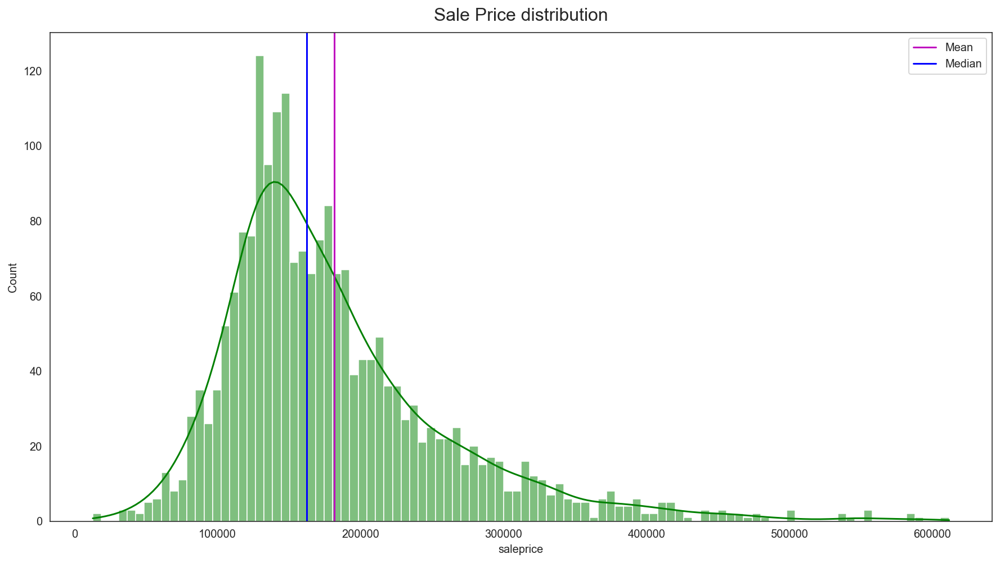

In [112]:
# Plot histogram and distribution curve for SalePrice

plt.figure(figsize=(15, 8))
g = sns.histplot(train['saleprice'], color='g', bins=100, kde=True);
g.set_title('Sale Price distribution', y=1.01, fontsize=16);
plt.axvline(x=train["saleprice"].mean(),color="m",label="Mean")
plt.axvline(x=train["saleprice"].median(),color="b",label="Median")
plt.legend(loc='upper right');

The mean `'saleprice'` is **181,484**, with a standard deviation of **79,275**. The distribution of `'saleprice'` is skewed to the right. The tail ends of the distribution curve indicates low frequency of the value and is indicative of outliers. Hence we will have to remove them in order to get a more accurate prediction in later stages.

### 3.2 Feature Engineering of `'saleprice'` against `'totalarea'` to double check for outliers
[*Jump to table of contents*](#Table-of-Contents)

In [113]:
# Checking out all area related variables to see if there's any relation between them.
train[['lot_area','mas_vnr_area','bsmtfin_sf_1','bsmtfin_sf_2','bsmt_unf_sf','total_bsmt_sf',
      '1st_flr_sf','2nd_flr_sf','low_qual_fin_sf','gr_liv_area','garage_area',
      'open_porch_sf','wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','pool_area']]

,lot_area,mas_vnr_area,bsmtfin_sf_1,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,garage_area,open_porch_sf,wood_deck_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area
0,13517,289.0,533.0,0.0,192.0,725.0,725,754,0,1479,475.0,44,0,0,0,0,0
1,11492,132.0,637.0,0.0,276.0,913.0,913,1209,0,2122,559.0,74,0,0,0,0,0
2,7922,0.0,731.0,0.0,326.0,1057.0,1057,0,0,1057,246.0,52,0,0,0,0,0
3,9802,0.0,0.0,0.0,384.0,384.0,744,700,0,1444,400.0,0,100,0,0,0,0
4,14235,0.0,0.0,0.0,676.0,676.0,831,614,0,1445,484.0,59,0,0,0,0,0
5,16492,0.0,247.0,713.0,557.0,1517.0,1888,0,0,1888,578.0,0,0,0,0,0,0
6,3675,82.0,547.0,0.0,0.0,547.0,1072,0,0,1072,525.0,44,0,0,0,0,0
7,12160,180.0,1000.0,0.0,188.0,1188.0,1188,0,0,1188,531.0,0,0,0,0,0,0
8,15783,0.0,292.0,0.0,632.0,924.0,924,0,0,924,420.0,324,0,0,0,0,0
9,11606,192.0,650.0,0.0,390.0,1040.0,1040,1040,0,2080,504.0,0,335,0,0,0,0


In [114]:
## Double check on relation between columns.
# train[train['bsmtfin_sf_1'] + train['bsmtfin_sf_2'] + train['bsmt_unf_sf'] > train['total_bsmt_sf']]
# train[train['1st_flr_sf'] + train['2nd_flr_sf'] > train['gr_liv_area']]
# test[test['bsmtfin_sf_1'] + test['bsmtfin_sf_2'] + test['bsmt_unf_sf'] > test['total_bsmt_sf']]
# test[test['1st_flr_sf'] + test['2nd_flr_sf'] > test['gr_liv_area']]
# train.shape - (2050,79)
# test.shape  - (877, 80) because i did not drop id and pid yet.

Generally looking at this table: 
* `'bsmtfin_sf_1'`, `'bsmtfin_sf_2'` and `'bsmt_unf_sf'` added up together will not be more than `'total_bsmt_sf'`. 
* `'1st_flr_sf'` and `'2nd_flr_sf'` added up together will not be more than `'gr_liv_area'`.

For simplicity sake, we will **feature engineer** a `'porch_area'` column, which is the sum of `'open_porch_sf'`, `'enclosed_porch'`, `'3ssn_porch'` and `'screen_porch'`.

We will do a **feature engineer** column `'total_area'` for both datasets (test and train) for standardisation purposes. `'total_area'` will be the sum of the following:  `'total_bsmt_sf'`, `'gr_liv_area'`, `'garage_area'`, `'porch_area'`, `'wood_deck_sf'` and `'pool_area'`.
Total area in this case will be the total livable area + basement + pool + porch + garage + wood deck.

We can also remove the following columns after the analysis of all numeric data: 
`'bsmtfin_sf_1'`, `'bsmtfin_sf_2'`, `'bsmt_unf_sf'`, `'1st_flr_sf'`, `'2nd_flr_sf'`, `'open_porch_sf'`, `'enclosed_porch'`, `'3ssn_porch'` and `'screen_porch'`.

*This will be applied to both datasets.*

In [115]:
#  Sum of porch area
train['porch_area'] = train['open_porch_sf'] + train['enclosed_porch'] + train['3ssn_porch'] + train['screen_porch']
test['porch_area'] = test['open_porch_sf'] + test['enclosed_porch'] + test['3ssn_porch'] + test['screen_porch']

In [116]:
# Sum of total area
test['total_area'] = test['total_bsmt_sf'] + test['gr_liv_area'] + test['garage_area'] + test['wood_deck_sf'] + test['porch_area'] + test['pool_area']
train['total_area'] = train['total_bsmt_sf'] + train['gr_liv_area'] + train['garage_area'] + train['wood_deck_sf'] + train['porch_area'] + train['pool_area']

In [117]:
# Drop respective columns - prevent clutter on both data sets. 
train.drop('bsmtfin_sf_1', axis = 1, inplace = True)
train.drop('bsmtfin_sf_2', axis = 1, inplace = True)
train.drop('bsmt_unf_sf', axis = 1, inplace = True)
train.drop('1st_flr_sf', axis = 1, inplace = True)
train.drop('2nd_flr_sf', axis = 1, inplace = True)
train.drop('open_porch_sf', axis = 1, inplace = True)
train.drop('enclosed_porch', axis = 1, inplace = True)
train.drop('3ssn_porch', axis = 1, inplace = True)
train.drop('screen_porch', axis = 1, inplace = True)

test.drop('bsmtfin_sf_1', axis = 1, inplace = True)
test.drop('bsmtfin_sf_2', axis = 1, inplace = True)
test.drop('bsmt_unf_sf', axis = 1, inplace = True)
test.drop('1st_flr_sf', axis = 1, inplace = True)
test.drop('2nd_flr_sf', axis = 1, inplace = True)
test.drop('open_porch_sf', axis = 1, inplace = True)
test.drop('enclosed_porch', axis = 1, inplace = True)
test.drop('3ssn_porch', axis = 1, inplace = True)
test.drop('screen_porch', axis = 1, inplace = True)
print(train.shape) # check that columns are dropped
print(test.shape)  # check that columns are dropped
train.head()       # check that columns are dropped

(2050, 72)
(877, 71)


,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
0,60,RL,68.0,13517,Pave,None,1,Lvl,4,CulDSac,1,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,3,2,CBlock,3,3,1,6,1,725.0,GasA,5,Y,SBrkr,0,1479,0.0,0.0,2,1,3,1,4,6,7,0,0,Attchd,1976.0,2,2.0,475.0,3,3,2,0,0,0,None,None,0,3,2010,WD,130500,44,2723.0
1,60,RL,43.0,11492,Pave,None,1,Lvl,4,CulDSac,1,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,3,2,PConc,4,3,1,6,1,913.0,GasA,5,Y,SBrkr,0,2122,1.0,0.0,2,1,4,1,4,8,7,1,3,Attchd,1997.0,2,2.0,559.0,3,3,2,0,0,0,None,None,0,4,2009,WD,220000,74,3668.0
2,20,RL,68.0,7922,Pave,None,0,Lvl,4,Inside,1,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,2,3,CBlock,3,3,1,6,1,1057.0,GasA,3,Y,SBrkr,0,1057,1.0,0.0,1,0,3,1,4,5,7,0,0,Detchd,1953.0,1,1.0,246.0,3,3,2,0,0,0,None,None,0,1,2010,WD,109000,52,2412.0
3,60,RL,73.0,9802,Pave,None,0,Lvl,4,Inside,1,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,2,2,PConc,4,3,1,1,1,384.0,GasA,4,Y,SBrkr,0,1444,0.0,0.0,2,1,3,1,3,7,7,0,0,BuiltIn,2007.0,3,2.0,400.0,3,3,2,100,0,0,None,None,0,4,2010,WD,174000,0,2328.0
4,50,RL,82.0,14235,Pave,None,1,Lvl,4,Inside,1,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,2,2,PConc,2,4,1,1,1,676.0,GasA,3,Y,SBrkr,0,1445,0.0,0.0,2,0,3,1,3,6,7,0,0,Detchd,1957.0,1,2.0,484.0,3,3,0,0,0,0,None,None,0,3,2010,WD,138500,59,2664.0


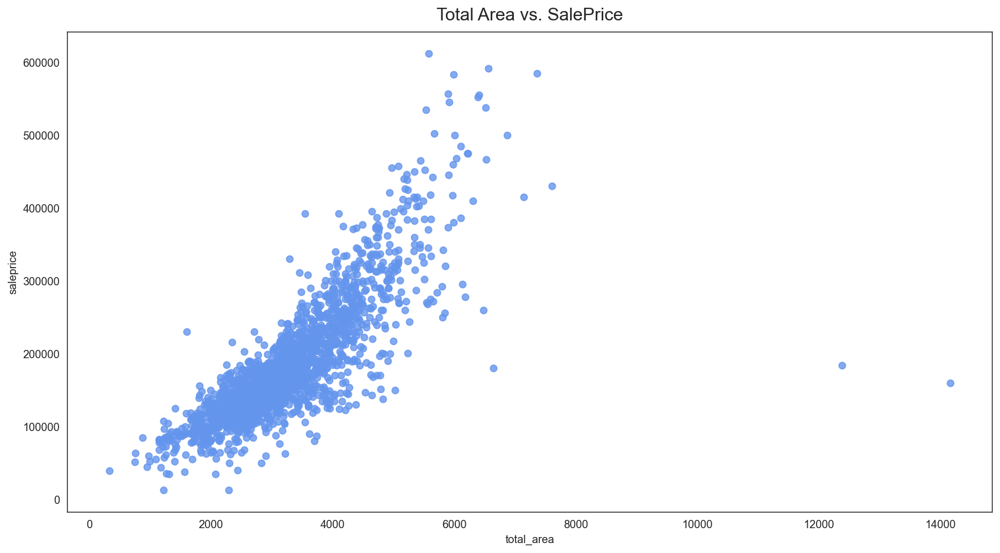

In [118]:
# Plotting total_area vs sale_price

plt.figure(figsize=(15, 8))
g = sns.regplot(data = train , x='total_area', y='saleprice', fit_reg=False, color='cornflowerblue');
g.set_title('Total Area vs. SalePrice', fontsize=16, y=1.01);

In [119]:
train['total_area'].describe()

count     2050.000000
mean      3215.775610
std       1033.176232
min        334.000000
25%       2516.250000
50%       3096.000000
75%       3772.250000
max      14156.000000
Name: total_area, dtype: float64

From the graph above we can see that there is two outliers with `'total_area'` > 12,000sqft, with a very low psf price compared the other other larger houses. This can affect the predictions of price of houses, we will hence have to remove them. To improve the precision of the model, we will also remove the outliers using 3x standard deviation.

In [120]:
# Find upper limit with 3x standard deviation/ z score of more than 3 for sales price
upper_limit = train.saleprice.mean() + 3*train.saleprice.std()

# Find upper limit with 3x standard deviation/ z score of less than -3 for sales price
lower_limit = train.saleprice.mean() - 3*train.saleprice.std()

# Check number of rows with saleprice outside of 3x standard deviation 
train[(train.saleprice > upper_limit) | (train.saleprice < lower_limit)].shape

(33, 72)

In [121]:
# Remove houses that are outisde of 3x standard deviation
new_train = train[(train.saleprice < upper_limit) & (train.saleprice > lower_limit)]
new_train.shape # Check if 33 rows are removed. 

(2017, 72)

As the lower limit is negative, we will plot a scatter plot against total house area (which will have to be feature engineered) in order to have a fair comparison of the house based on per square foot.

In [122]:
train = new_train

In [123]:
# Find upper limit with 3x standard deviation/ z score of more than 3 for total_area
upper_limit = train.total_area.mean() + 3*train.total_area.std()

# Find upper limit with 3x standard deviation/ z score of less than -3 for total_area
lower_limit = train.total_area.mean() - 3*train.total_area.std()

# Check number of rows with total_area outside of 3x standard deviation 
train[(train.total_area > upper_limit) | (train.total_area < lower_limit)].shape

(8, 72)

In [124]:
# Remove houses that are outisde of 3x standard deviation
new_train = train[(train.total_area < upper_limit) & (train.total_area > lower_limit)]
new_train.shape # Check if 8 rows are removed. 
train = new_train

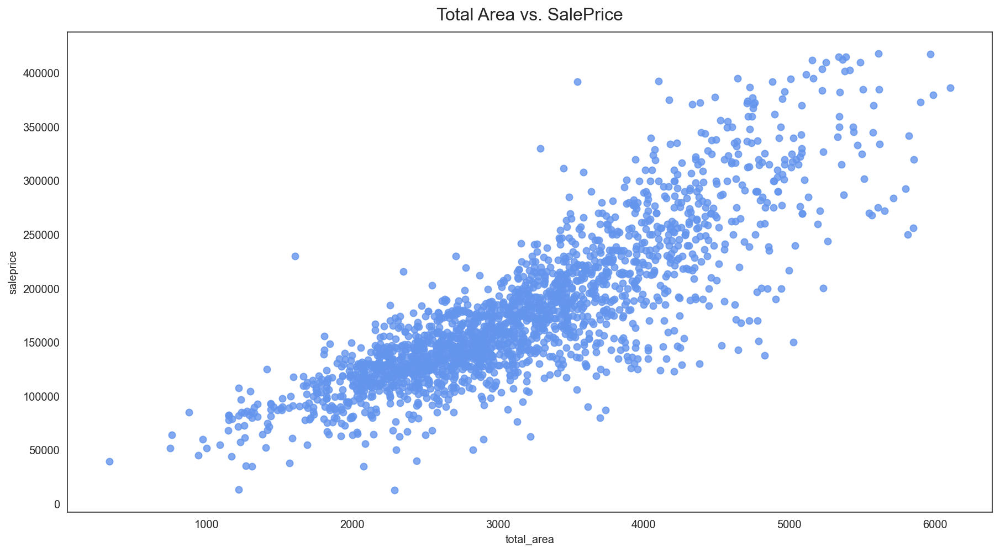

In [125]:
# Plotting total_area vs sale_price
plt.figure(figsize=(15, 8))
g = sns.regplot(data = new_train , x='total_area', y='saleprice', fit_reg=False, color='cornflowerblue');
g.set_title('Total Area vs. SalePrice', fontsize=16, y=1.01);

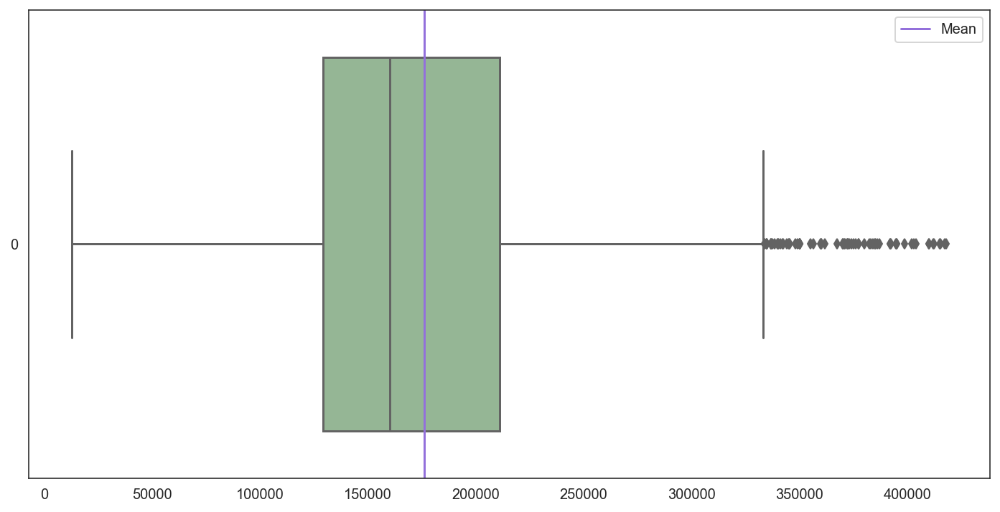

In [126]:
fig, ax = plt.subplots(figsize=(12,6))
ax = sns.boxplot(data = train["saleprice"], color = 'darkseagreen', orient = 'h');
plt.axvline(x=train["saleprice"].mean(),color="mediumpurple",label="Mean")
plt.legend(loc='upper right');

Looking at the visualisations, we can see that there are more as many stray outliers between `'saleprice'` and `'total_area'`. 

### 3.3 Continuous Numeric Variable Analysis
[*Jump to table of contents*](#Table-of-Contents)

In [127]:
# reassign new set of column names since we dropped 7 of them earlier
new_cont_numeric= ['lot_frontage', 'lot_area', 'mas_vnr_area', 'total_bsmt_sf', 'low_qual_fin_sf', 'gr_liv_area', 
                   'garage_area', 'wood_deck_sf', 'porch_area', 'total_area', 'saleprice']
cont_numeric = new_cont_numeric

In [128]:
train[cont_numeric].describe().T.round()

,count,mean,std,min,25%,50%,75%,max
lot_frontage,2009.0,68.0,20.0,21.0,60.0,68.0,78.0,313.0
lot_area,2009.0,9890.0,6489.0,1300.0,7450.0,9337.0,11344.0,159000.0
mas_vnr_area,2009.0,90.0,158.0,0.0,0.0,0.0,145.0,1600.0
total_bsmt_sf,2009.0,1034.0,403.0,0.0,784.0,988.0,1291.0,3206.0
low_qual_fin_sf,2009.0,5.0,50.0,0.0,0.0,0.0,0.0,1064.0
gr_liv_area,2009.0,1473.0,457.0,334.0,1124.0,1433.0,1716.0,3820.0
garage_area,2009.0,466.0,209.0,0.0,312.0,478.0,576.0,1356.0
wood_deck_sf,2009.0,91.0,125.0,0.0,0.0,0.0,164.0,1424.0
porch_area,2009.0,87.0,104.0,0.0,0.0,50.0,136.0,1027.0
total_area,2009.0,3152.0,910.0,334.0,2503.0,3068.0,3728.0,6105.0


In [129]:
train[cont_numeric].corr()[['saleprice']].sort_values('saleprice', ascending=False)

,saleprice
saleprice,1.000000
total_area,0.842651
gr_liv_area,0.693766
garage_area,0.643273
total_bsmt_sf,0.631284
mas_vnr_area,0.434887
lot_frontage,0.333417
wood_deck_sf,0.322211
lot_area,0.270810
porch_area,0.191028


Notably, the following numeric continuous variables have the strongest correlation with `'saleprice'` (correlation coefficient >= +/-0.5).

1. `total_area`
2. `gr_liv_area` 
3. `garage_area`
4. `total_bsmt_sf`


However, `gr_liv_area` is a bulk of the `total_area` and will lead to multicollinearity, hence it will be removed. We can double check in the correlation matrix below.

Let's take a look at the correlation matrix.

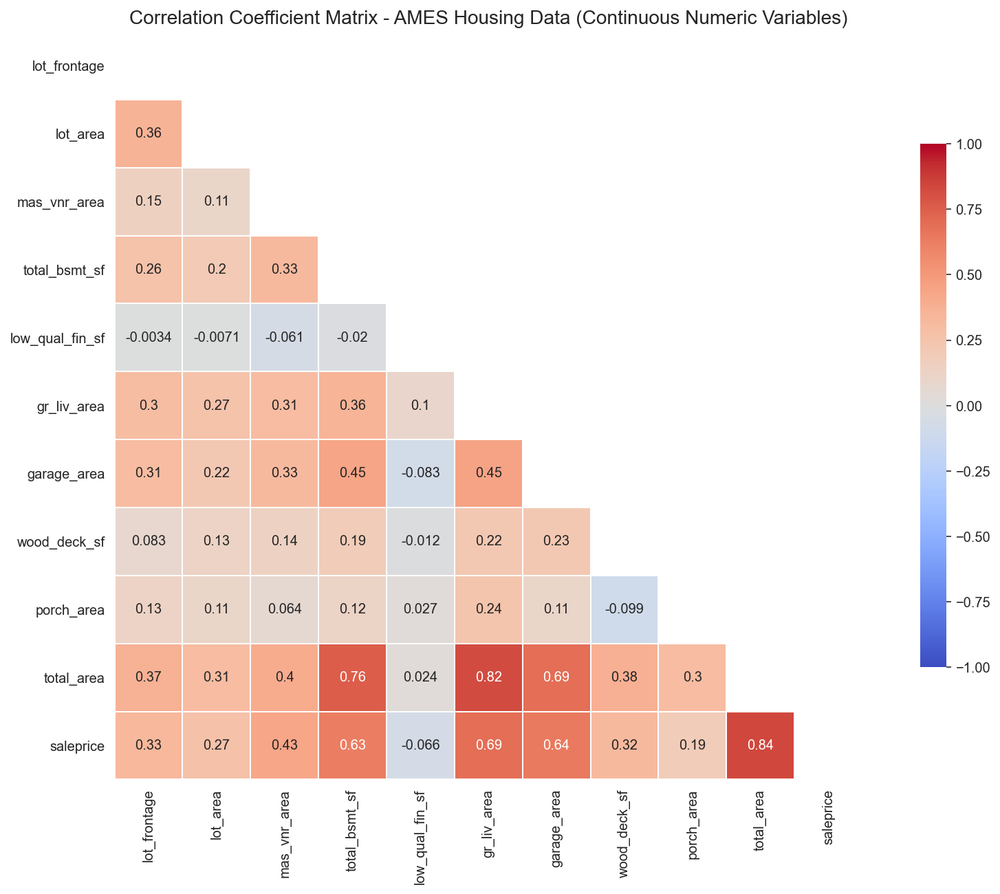

In [130]:
# plotting correlation matrix of numeric continuous variables and SalePrice
fig, ax = plt.subplots(figsize=(15,10))

corr = train[cont_numeric].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

g = sns.heatmap(corr, mask=mask, cmap='coolwarm', vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
                cbar_kws={"shrink": .7}, annot=True)
g.set_title('Correlation Coefficient Matrix - AMES Housing Data (Continuous Numeric Variables)', fontsize=14);

Referring to the correlation heatmap above we can observe several variables with **multicollinearity** (correlation coefficient > +/-0.5), hence the model should not include:

* `'total_area'` with `total_bsmt_sf'`, `'gr_liv_area'` and `'garage_area'`

In [131]:
# Defining functions for displots and box plots for convenience.
def sns_histplots(df,col_list):
    """plots mutliple distribution subplots """
    data = pd.melt(df, value_vars=col_list)
    g = sns.FacetGrid(data, col='variable', col_wrap=4, sharex=False, sharey=False)
    plt.xticks(rotation='vertical')
    g = g.map(sns.histplot, 'value', kde=False)
    [plt.setp(ax.get_xticklabels(), rotation=60) for ax in g.axes.flat]
    g.fig.tight_layout()

In [132]:
# splitting continuous features via freqency of variable within features at the threshold of 80%
cont_numeric_lowsig=[i for i in cont_numeric if train[i].value_counts(normalize=True).max()>0.80]
cont_numeric_sig=[i for i in cont_numeric if i not in cont_numeric_lowsig]

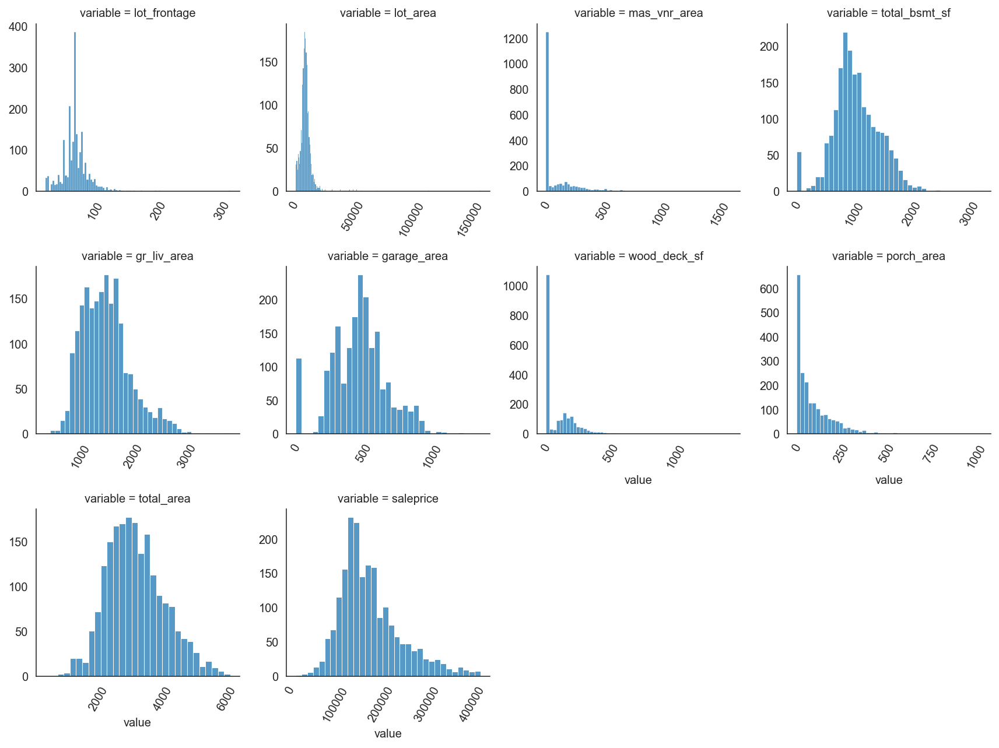

In [133]:
# plotting histplots of numeric continuous variables of significance above threshold
sns_histplots(train,cont_numeric_sig)

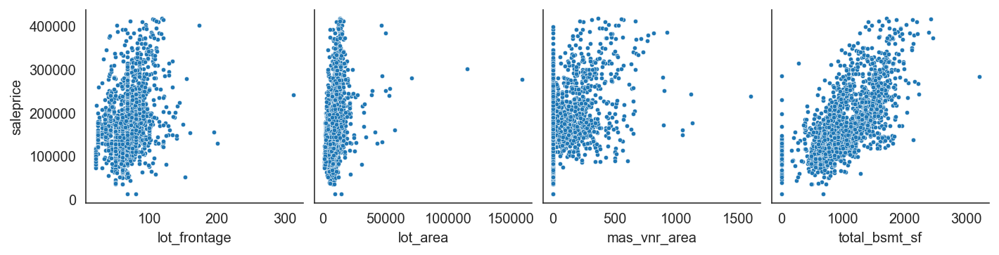

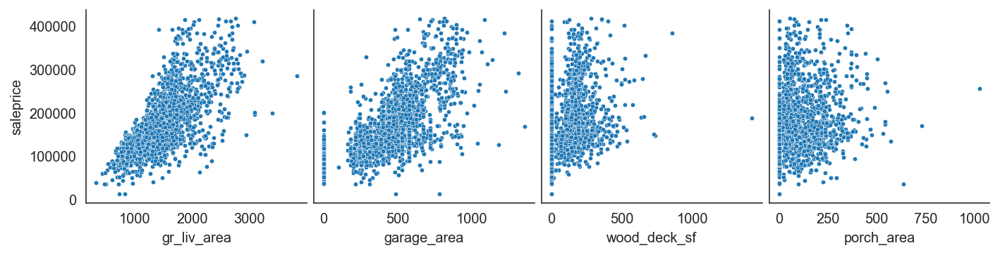

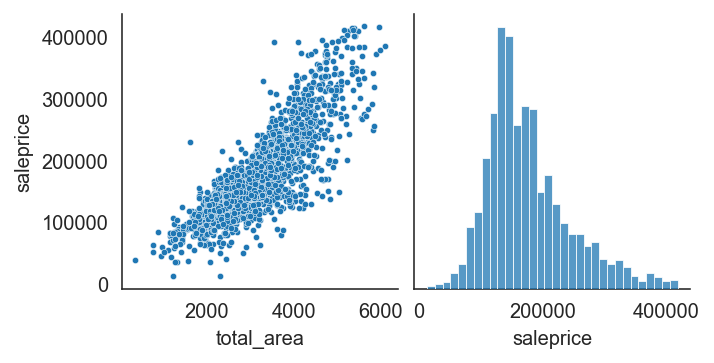

In [134]:
# plotting scatterplots of numeric continuous variables vs. SalePrice 
for i in range(0, len(cont_numeric_sig), 4):
    sns.pairplot(data=train, x_vars=cont_numeric_sig[i:i+4], y_vars=['saleprice'], plot_kws={"s":10})

Several numeric continuous variables as mentioned earlier show correlation with `'saleprice'`. Others such as `'mas_vnr_area'`, `'wood_deck_sf'`,`'porch_area'` have high number of zeros corresponding to lack of these house features.

Furthermore, it indicate outliers in almost all variables.


#### 3.4.1 Removing outliers in continuous numerical data
[*Jump to table of contents*](#Table-of-Contents)

In [135]:
# Identify outliers in lot_frontage
train.loc[train["lot_frontage"]>300,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
1335,20,RL,313.0,27650,Pave,None,2,HLS,4,Inside,2,NAmes,PosA,Norm,1Fam,1Story,7,7,1960,2007,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,2,2,CBlock,4,3,4,6,1,585.0,GasA,5,Y,SBrkr,0,2069,1.0,0.0,2,0,4,1,4,9,7,1,4,Attchd,1960.0,2,2.0,505.0,3,3,2,0,0,0,None,None,0,11,2008,WD,242000,0,3159.0


In [136]:
# Removing outliers in lot_frontage
train.drop(train.loc[train["lot_frontage"]>300,:].index,axis=0,inplace=True)

In [137]:
# Identify outliers in lot_area
train.loc[train["lot_area"]>100000,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
471,50,RL,68.0,159000,Pave,None,2,Low,4,CulDSac,3,ClearCr,Norm,Norm,1Fam,1.5Fin,6,7,1958,2006,Gable,CompShg,Wd Sdng,HdBoard,BrkCmn,472.0,3,2,CBlock,4,3,4,3,1,1444.0,GasA,4,Y,SBrkr,0,2144,0.0,1.0,2,0,4,1,4,7,7,2,3,Attchd,1958.0,3,2.0,389.0,3,3,2,0,0,0,None,Shed,500,6,2007,WD,277000,98,4075.0
694,20,RL,68.0,115149,Pave,None,2,Low,4,CulDSac,3,ClearCr,Norm,Norm,1Fam,1Story,7,5,1971,2002,Gable,CompShg,Plywood,Plywood,Stone,351.0,2,2,CBlock,4,3,4,6,1,1643.0,GasA,3,Y,SBrkr,0,1824,1.0,0.0,2,0,2,1,4,5,7,2,3,Attchd,1971.0,1,2.0,739.0,3,3,2,380,0,0,None,None,0,6,2007,WD,302000,48,4634.0


In [138]:
# Removing outliers in lot_area
train.drop(train.loc[train["lot_area"]>100000,:].index,axis=0,inplace=True)

In [139]:
# Identify outliers in mas_vnr_area
train.loc[train["mas_vnr_area"]>1500,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
1409,60,FV,66.0,7399,Pave,Pave,1,Lvl,4,Inside,1,Somerst,Norm,Norm,1Fam,2Story,7,5,1997,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,1600.0,3,2,PConc,4,3,1,4,1,975.0,GasA,5,Y,SBrkr,0,1950,0.0,0.0,2,1,3,1,4,7,7,1,3,Detchd,1997.0,2,2.0,576.0,3,3,2,0,0,0,None,None,0,6,2007,WD,239000,208,3709.0


In [140]:
# Removing outliers in mas_vnr_area
train.drop(train.loc[train["mas_vnr_area"]>1500,:].index,axis=0,inplace=True)

In [141]:
# Identify outliers in total_bsmt_sf
train.loc[train["total_bsmt_sf"]>3000,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
1147,20,RL,85.0,10655,Pave,None,1,Lvl,4,Inside,1,NridgHt,Norm,Norm,1Fam,1Story,8,5,2003,2004,Gable,CompShg,VinylSd,VinylSd,BrkFace,296.0,3,2,PConc,4,3,1,6,1,3206.0,GasA,5,Y,SBrkr,0,1629,1.0,0.0,2,0,3,1,4,7,7,1,4,Attchd,2003.0,2,3.0,880.0,3,3,2,0,0,0,None,None,0,10,2009,WD,284000,0,5715.0


In [142]:
# Removing outliers in total_bsmt_sf
train.drop(train.loc[train["total_bsmt_sf"]>3000,:].index,axis=0,inplace=True)

In [143]:
# Identify outliers in wood_deck_sf
train.loc[train["wood_deck_sf"]>1000,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
966,80,RL,68.0,15957,Pave,None,1,Low,4,Corner,2,Mitchel,Norm,Norm,1Fam,SLvl,6,6,1977,1977,Gable,CompShg,HdBoard,Plywood,None,0.0,2,2,PConc,4,3,4,6,1,1244.0,GasA,3,Y,SBrkr,0,1356,2.0,0.0,2,0,3,1,3,6,7,1,3,Attchd,1977.0,3,2.0,528.0,3,3,2,1424,0,0,MnPrv,None,0,9,2007,WD,188000,0,4552.0


In [144]:
# Removing outliers in wood_deck_sf
train.drop(train.loc[train["wood_deck_sf"]>1000,:].index,axis=0,inplace=True)

In [145]:
# Identify outliers in porch_area
train.loc[train["porch_area"]>1000,:]

,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area
974,50,RM,60.0,10440,Pave,Grvl,0,Lvl,4,Corner,1,OldTown,Norm,Norm,1Fam,1.5Fin,6,7,1920,1950,Gable,CompShg,BrkFace,Wd Sdng,None,0.0,3,3,BrkTil,4,3,1,2,1,1510.0,GasW,5,Y,SBrkr,0,2792,0.0,0.0,2,0,5,1,3,8,4,2,3,Detchd,1920.0,1,2.0,520.0,2,3,2,0,0,0,MnPrv,Shed,1150,6,2008,WD,256000,1027,5849.0


In [146]:
# Removing outliers in porch_area
train.drop(train.loc[train["porch_area"]>1000,:].index,axis=0,inplace=True)

### 3.5 Discrete Numeric Variable Analysis
[*Jump to table of contents*](#Table-of-Contents)

In [147]:
train[dis_numeric] 

,lot_shape,utilities,land_slope,overall_qual,overall_cond,year_built,year_remod/add,exter_qual,exter_cond,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,heating_qc,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_yr_blt,garage_finish,garage_cars,garage_qual,garage_cond,paved_drive,pool_area,pool_qc,misc_val,yr_sold
0,1,4,1,6,8,1976,2005,3,2,3,3,1,6,1,5,0.0,0.0,2,1,3,1,4,6,7,0,0,1976.0,2,2.0,3,3,2,0,0,0,2010
1,1,4,1,7,5,1996,1997,3,2,4,3,1,6,1,5,1.0,0.0,2,1,4,1,4,8,7,1,3,1997.0,2,2.0,3,3,2,0,0,0,2009
2,0,4,1,5,7,1953,2007,2,3,3,3,1,6,1,3,1.0,0.0,1,0,3,1,4,5,7,0,0,1953.0,1,1.0,3,3,2,0,0,0,2010
3,0,4,1,5,5,2006,2007,2,2,4,3,1,1,1,4,0.0,0.0,2,1,3,1,3,7,7,0,0,2007.0,3,2.0,3,3,2,0,0,0,2010
4,1,4,1,6,8,1900,1993,2,2,2,4,1,1,1,3,0.0,0.0,2,0,3,1,3,6,7,0,0,1957.0,1,2.0,3,3,0,0,0,0,2010
5,1,4,1,6,6,1966,2002,3,2,3,3,1,5,3,5,0.0,0.0,2,1,2,1,4,6,4,1,4,1966.0,3,2.0,3,3,2,0,0,0,2010
6,0,4,1,6,5,2005,2006,2,2,4,3,4,6,1,4,1.0,0.0,2,0,2,1,3,5,7,0,0,2005.0,3,2.0,3,3,2,0,0,0,2006
7,1,4,1,5,5,1959,1959,2,2,3,3,1,3,1,2,1.0,0.0,1,0,3,1,3,6,7,0,0,1959.0,2,2.0,3,3,2,0,0,0,2010
8,0,4,1,5,5,1952,1952,2,2,3,3,1,3,1,3,0.0,0.0,1,0,2,1,3,6,7,0,0,1952.0,1,1.0,3,3,2,0,0,400,2007
9,1,4,3,5,5,1969,1969,2,2,4,3,3,3,1,3,0.0,1.0,1,2,5,1,2,9,7,2,3,1969.0,1,2.0,3,3,2,0,0,0,2007


In [148]:
train[dis_numeric + ['saleprice']].describe().T.round()

,count,mean,std,min,25%,50%,75%,max
lot_shape,2002.0,0.0,1.0,0.0,0.0,0.0,1.0,3.0
utilities,2002.0,4.0,0.0,2.0,4.0,4.0,4.0,4.0
land_slope,2002.0,1.0,0.0,1.0,1.0,1.0,1.0,3.0
overall_qual,2002.0,6.0,1.0,1.0,5.0,6.0,7.0,10.0
overall_cond,2002.0,6.0,1.0,1.0,5.0,5.0,6.0,9.0
year_built,2002.0,1971.0,30.0,1872.0,1953.0,1973.0,2000.0,2010.0
year_remod/add,2002.0,1984.0,21.0,1950.0,1964.0,1992.0,2003.0,2010.0
exter_qual,2002.0,2.0,1.0,1.0,2.0,2.0,3.0,4.0
exter_cond,2002.0,2.0,0.0,0.0,2.0,2.0,2.0,4.0
bsmt_qual,2002.0,3.0,1.0,0.0,3.0,4.0,4.0,5.0


In [149]:
train[dis_numeric + ['saleprice']].corr()[['saleprice']].sort_values('saleprice', ascending=False)
# Apply heatmap to view top features to use for regression
# fig, ax = plt.subplots(figsize=(18,8)) # Using subplots to control figure size
# plt.title('Heatmap of Sales Price vs Top 30 Variables')
# sns.heatmap(train[dis_numeric].corr().abs()[['saleprice']].sort_values('saleprice').tail(30),
#             vmax=1, vmin=-1, cmap='Spectral', annot=True, ax=ax);

,saleprice
saleprice,1.000000
overall_qual,0.804752
exter_qual,0.701515
kitchen_qual,0.683954
garage_cars,0.650769
bsmt_qual,0.615904
year_built,0.609364
garage_finish,0.582009
year_remod/add,0.572739
full_bath,0.537344


Notably, the following numeric continuous variables have the strongest correlation with `'saleprice'` (correlation coefficient >= +/-0.5).

1. `overall_qual`
2. `exter_qual` 
3. `kitchen_qual`
4. `garage_cars`
5. `bsmt_qual`
6. `year_built`
7. `garage_finish`
8. `year_remod/add`
9. `full_bath`
10. `fireplace_qu`


There are many features that can be overlapping and causing multicollinearity, we will have to combine colunns using feature engineering to simplify the number of columns. 

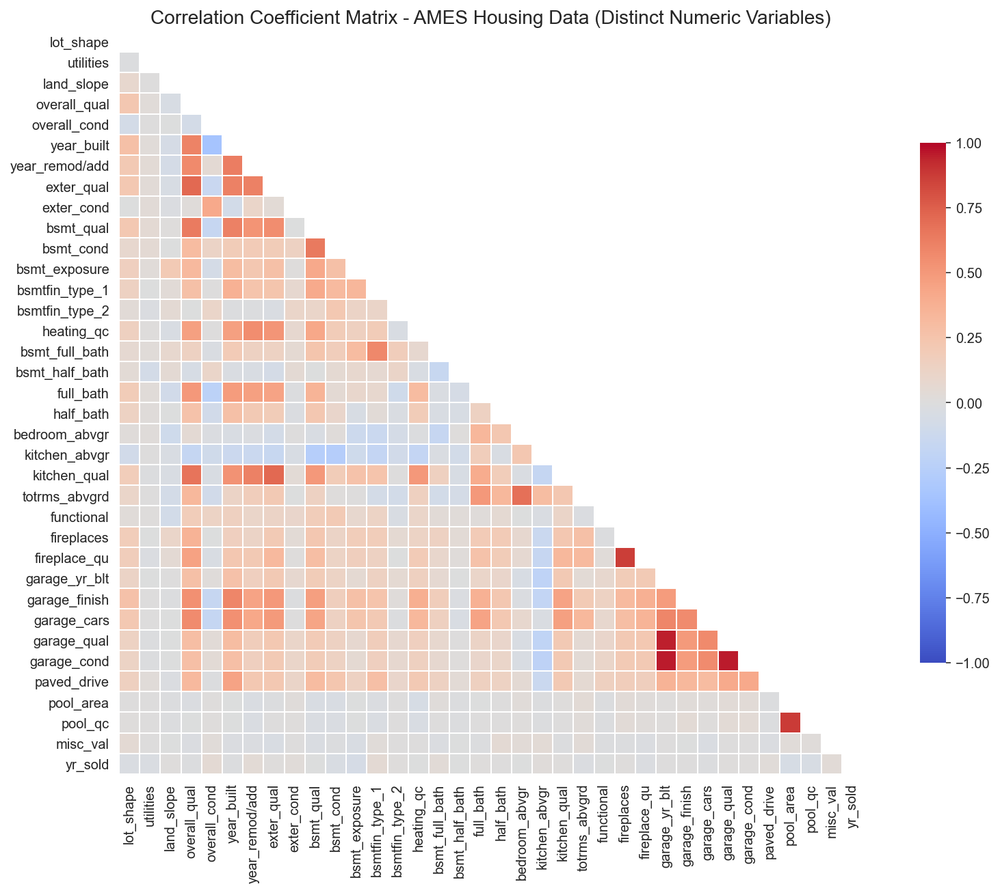

In [150]:
# plotting correlation matrix of numeric distinct variables and SalePrice
fig, ax = plt.subplots(figsize=(15,10))

corr = train[dis_numeric].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

g = sns.heatmap(corr, mask=mask, cmap='coolwarm', vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
                cbar_kws={"shrink": .7})
g.set_title('Correlation Coefficient Matrix - AMES Housing Data (Distinct Numeric Variables)', fontsize=14);

In [151]:
train[train['year_remod/add'] == 0].value_counts()

Series([], dtype: int64)

In [152]:
# add feature-engineered columns
# + 1 to all age columns so if they're sold in the same year it was built it will be 1. if feature is unavailable = 0
train['house_age'] = train['yr_sold'] - train['year_built'] + 1
train['remod_age'] = train['yr_sold'] - train['year_remod/add'] + 1
train['garage_age'] = train['yr_sold'] - train['garage_yr_blt'] + 1
train['total_bath'] = train['bsmt_full_bath'] + train['bsmt_half_bath'] + train['full_bath'] + train['half_bath']

# create a column combining overall quality and overall condition
train['overall_qc'] = train['overall_qual'] * train['overall_cond']

# create a column combining exterior quality and exterior condition
train['exter_qc'] = train['exter_qual'] * train['exter_cond']

# create a column combining basement quality and basement condition
train['bsmt_qc'] = train['bsmt_qual'] * train['bsmt_cond']

# create a column combining garage quality and garage condition
train['garage_qc'] = train['garage_qual'] * train['garage_cond']

In [153]:
# checking which garage ages are more then 200 
train.loc[train["garage_age"]>200,:][["garage_age","garage_yr_blt","yr_sold","house_age","garage_area"]]

,garage_age,garage_yr_blt,yr_sold,house_age,garage_area
28,2008.0,0.0,2007,113,0.0
53,2011.0,0.0,2010,41,0.0
65,2008.0,0.0,2007,1,0.0
79,2008.0,0.0,2007,83,0.0
101,2008.0,0.0,2007,88,0.0
103,2010.0,0.0,2009,110,0.0
114,2010.0,0.0,2009,63,0.0
120,2009.0,0.0,2008,69,0.0
134,2009.0,0.0,2008,84,0.0
136,2011.0,0.0,2010,136,0.0


In [154]:
# replace any negative age in age and gargage age with 0 as both looks like they are just keyed wrongly
train.loc[train["garage_yr_blt"]==0,["garage_age"]]=0 
# test.loc[test["garage_yr_blt"]=0,["garage_age"]]=0 

In [155]:
train.loc[train["garage_age"]==0,:][["garage_age","garage_yr_blt","yr_sold","house_age"]]

,garage_age,garage_yr_blt,yr_sold,house_age
28,0.0,0.0,2007,113
53,0.0,0.0,2010,41
65,0.0,0.0,2007,1
79,0.0,0.0,2007,83
101,0.0,0.0,2007,88
103,0.0,0.0,2009,110
114,0.0,0.0,2009,63
120,0.0,0.0,2008,69
134,0.0,0.0,2008,84
136,0.0,0.0,2010,136


In [156]:
# add feature-engineered columns
# + 1 to all age columns so if they're sold in the same year it was built it will be 1. if feature is unavailable = 0
test['house_age'] = test['yr_sold'] - test['year_built'] + 1
test['remod_age'] = test['yr_sold'] - test['year_remod/add'] + 1
test['garage_age'] = test['yr_sold'] - test['garage_yr_blt'] + 1
test['total_bath'] = test['bsmt_full_bath'] + test['bsmt_half_bath'] + test['full_bath'] + test['half_bath']

# create a column combining overall quality and overall condition
test['overall_qc'] = test['overall_qual'] * test['overall_cond']

# create a column combining exterior quality and exterior condition
test['exter_qc'] = test['exter_qual'] * test['exter_cond']

# create a column combining basement quality and basement condition
test['bsmt_qc'] = test['bsmt_qual'] * test['bsmt_cond']

# create a column combining garage quality and garage condition
test['garage_qc'] = test['garage_qual'] * test['garage_cond']


In [157]:
# checking which garage ages are more then 200 
test.loc[test["garage_age"]>200,:][["garage_age","garage_yr_blt","yr_sold","house_age","garage_area"]]

,garage_age,garage_yr_blt,yr_sold,house_age,garage_area
29,2008.0,0.0,2007,63,0
45,2010.0,0.0,2009,40,0
66,2007.0,0.0,2006,36,0
68,2008.0,0.0,2007,77,0
105,2008.0,0.0,2007,63,0
109,2011.0,0.0,2010,44,0
113,2007.0,0.0,2006,1,0
144,2009.0,0.0,2008,62,0
152,2009.0,0.0,2008,89,0
156,2011.0,0.0,2010,41,0


In [158]:
# replace any negative age in age and gargage age with 0 as both looks like they are just keyed wrongly
test.loc[test["garage_yr_blt"]==0,["garage_age"]]=0 
# test.loc[test["garage_yr_blt"]=0,["garage_age"]]=0 

In [159]:
test.loc[test["garage_age"]==0,:][["garage_age","garage_yr_blt","yr_sold","house_age"]]

,garage_age,garage_yr_blt,yr_sold,house_age
29,0.0,0.0,2007,63
45,0.0,0.0,2009,40
66,0.0,0.0,2006,36
68,0.0,0.0,2007,77
105,0.0,0.0,2007,63
109,0.0,0.0,2010,44
113,0.0,0.0,2006,1
144,0.0,0.0,2008,62
152,0.0,0.0,2008,89
156,0.0,0.0,2010,41


In [160]:
# Drop respective columns - prevent clutter on both data sets. 
train.drop('year_built', axis = 1, inplace = True)
train.drop('year_remod/add', axis = 1, inplace = True)
train.drop('garage_yr_blt', axis = 1, inplace = True)
train.drop('bsmt_full_bath', axis = 1, inplace = True)
train.drop('bsmt_half_bath', axis = 1, inplace = True)
train.drop('full_bath', axis = 1, inplace = True)
train.drop('half_bath', axis = 1, inplace = True)
train.drop('overall_qual', axis = 1, inplace = True)
train.drop('overall_cond', axis = 1, inplace = True)
train.drop('exter_qual', axis = 1, inplace = True)
train.drop('exter_cond', axis = 1, inplace = True)
train.drop('bsmt_qual', axis = 1, inplace = True)
train.drop('bsmt_cond', axis = 1, inplace = True)
train.drop('garage_qual', axis = 1, inplace = True)
train.drop('garage_cond', axis = 1, inplace = True)

test.drop('year_built', axis = 1, inplace = True)
test.drop('year_remod/add', axis = 1, inplace = True)
test.drop('garage_yr_blt', axis = 1, inplace = True)
test.drop('bsmt_full_bath', axis = 1, inplace = True)
test.drop('bsmt_half_bath', axis = 1, inplace = True)
test.drop('full_bath', axis = 1, inplace = True)
test.drop('half_bath', axis = 1, inplace = True)
test.drop('overall_qual', axis = 1, inplace = True)
test.drop('overall_cond', axis = 1, inplace = True)
test.drop('exter_qual', axis = 1, inplace = True)
test.drop('exter_cond', axis = 1, inplace = True)
test.drop('bsmt_qual', axis = 1, inplace = True)
test.drop('bsmt_cond', axis = 1, inplace = True)
test.drop('garage_qual', axis = 1, inplace = True)
test.drop('garage_cond', axis = 1, inplace = True)
print(train.shape) # check that columns are dropped
print(test.shape)  # check that columns are dropped
train.head()       # check that columns are dropped

(2002, 65)
(877, 64)


,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,foundation,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,total_bsmt_sf,heating,heating_qc,central_air,electrical,low_qual_fin_sf,gr_liv_area,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_finish,garage_cars,garage_area,paved_drive,wood_deck_sf,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,porch_area,total_area,house_age,remod_age,garage_age,total_bath,overall_qc,exter_qc,bsmt_qc,garage_qc
0,60,RL,68.0,13517,Pave,None,1,Lvl,4,CulDSac,1,Sawyer,RRAe,Norm,1Fam,2Story,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,CBlock,1,6,1,725.0,GasA,5,Y,SBrkr,0,1479,3,1,4,6,7,0,0,Attchd,2,2.0,475.0,2,0,0,0,None,None,0,3,2010,WD,130500,44,2723.0,35,6,35.0,3.0,48,6,9,9
1,60,RL,43.0,11492,Pave,None,1,Lvl,4,CulDSac,1,SawyerW,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,PConc,1,6,1,913.0,GasA,5,Y,SBrkr,0,2122,4,1,4,8,7,1,3,Attchd,2,2.0,559.0,2,0,0,0,None,None,0,4,2009,WD,220000,74,3668.0,14,13,13.0,4.0,35,6,12,9
2,20,RL,68.0,7922,Pave,None,0,Lvl,4,Inside,1,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,CBlock,1,6,1,1057.0,GasA,3,Y,SBrkr,0,1057,3,1,4,5,7,0,0,Detchd,1,1.0,246.0,2,0,0,0,None,None,0,1,2010,WD,109000,52,2412.0,58,4,58.0,2.0,35,6,9,9
3,60,RL,73.0,9802,Pave,None,0,Lvl,4,Inside,1,Timber,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,0.0,PConc,1,1,1,384.0,GasA,4,Y,SBrkr,0,1444,3,1,3,7,7,0,0,BuiltIn,3,2.0,400.0,2,100,0,0,None,None,0,4,2010,WD,174000,0,2328.0,5,4,4.0,3.0,25,4,12,9
4,50,RL,82.0,14235,Pave,None,1,Lvl,4,Inside,1,SawyerW,Norm,Norm,1Fam,1.5Fin,Gable,CompShg,Wd Sdng,Plywood,None,0.0,PConc,1,1,1,676.0,GasA,3,Y,SBrkr,0,1445,3,1,3,6,7,0,0,Detchd,1,2.0,484.0,0,0,0,0,None,None,0,3,2010,WD,138500,59,2664.0,111,18,54.0,2.0,48,4,8,9


In [161]:
train[['bedroom_abvgr','kitchen_abvgr','totrms_abvgrd','total_bath']]

,bedroom_abvgr,kitchen_abvgr,totrms_abvgrd,total_bath
0,3,1,6,3.0
1,4,1,8,4.0
2,3,1,5,2.0
3,3,1,7,3.0
4,3,1,6,2.0
5,2,1,6,3.0
6,2,1,5,3.0
7,3,1,6,2.0
8,2,1,6,1.0
9,5,1,9,4.0


In [162]:
train['bedroom_abvgr'] + train['total_bath'] != train['totrms_abvgrd']

0       False
1       False
2       False
3        True
4        True
5        True
6       False
7        True
8        True
9       False
10      False
11       True
12       True
13      False
14       True
15       True
16       True
17      False
18       True
19       True
20       True
21      False
22       True
23      False
24      False
25      False
26      False
27       True
28       True
29       True
31       True
32       True
33       True
34       True
35       True
36      False
37       True
38       True
39      False
40      False
42       True
43       True
44      False
45       True
46       True
47       True
48       True
49       True
50       True
51      False
52       True
53      False
54       True
55       True
56       True
57       True
58       True
59       True
60       True
61       True
62      False
63       True
64       True
65       True
66       True
67       True
68       True
69       True
70       True
71      False
72       True
73    

In [163]:
# reassign new set of column names since we dropped 15 of them and added 8 earlier
new_dis_numeric= ['lot_shape', 'utilities', 'land_slope', 'bsmt_exposure', 'bsmtfin_type_1', 'bsmtfin_type_2',
                  'heating_qc', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual', 'totrms_abvgrd', 'functional',
                  'fireplaces', 'fireplace_qu', 'garage_finish', 'garage_cars', 'paved_drive', 'pool_area',
                  'pool_qc', 'misc_val', 'yr_sold', 'house_age', 'remod_age', 'garage_age', 'total_bath', 
                  'overall_qc', 'exter_qc', 'bsmt_qc', 'garage_qc'] 
dis_numeric = new_dis_numeric

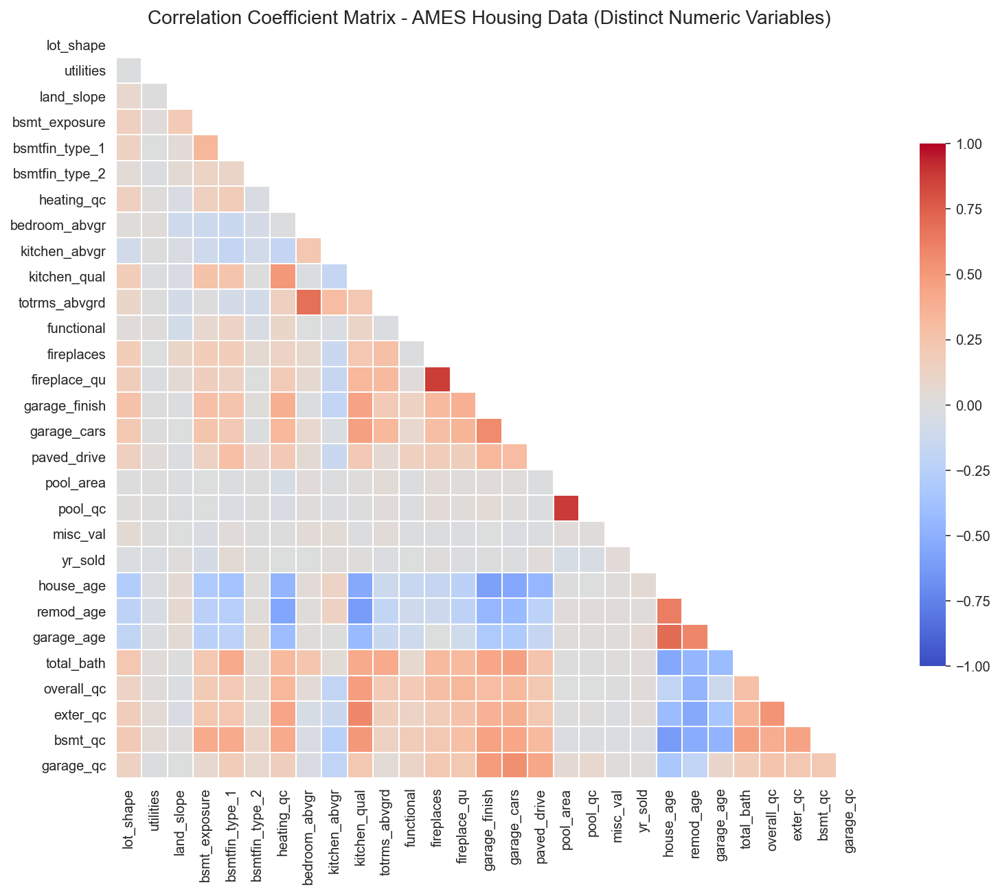

In [164]:
# plotting correlation matrix of numeric distinct variables and SalePrice
fig, ax = plt.subplots(figsize=(15,10))

corr = train[dis_numeric].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

g = sns.heatmap(corr, mask=mask, cmap='coolwarm', vmin=-1, vmax=1, center=0, square=True, linewidths=.5,
                cbar_kws={"shrink": .7})
g.set_title('Correlation Coefficient Matrix - AMES Housing Data (Distinct Numeric Variables)', fontsize=14);

In [165]:
# splitting discrete features via freqency of variable within features at the threshold of 80%
dis_numeric_lowsig=[i for i in dis_numeric if train[i].value_counts(normalize=True).max()>0.80]
dis_numeric_sig=[i for i in dis_numeric if i not in dis_numeric_lowsig]

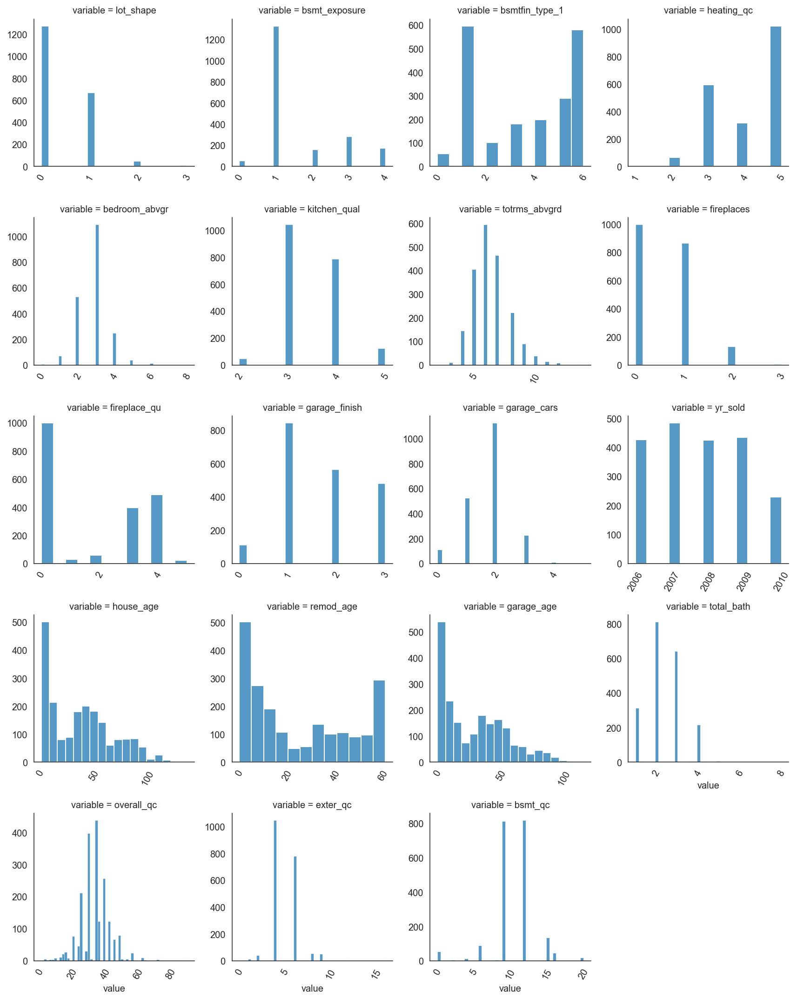

In [166]:
# plotting histplots of numeric distinct variables of significance above threshold
sns_histplots(train,dis_numeric_sig)

Based on the histograms above, here are their respective modes for categorical variables

|**Variable**|**Mode Value**|
|---|---|
| lot_shape | 0 = Regular |
| bsmt_exposure | 1 = No Exposure |
| bsmt_fin_type1 | 1 = Unfinished OR 6 = Good Living Quarters |
| heating_qc | 5 = Excellent |
| fireplace_qu | 0 = No fireplace OR 4 = Good - Masonry Fireplace in main level |
| garage_finish | 1 = Unfinished |

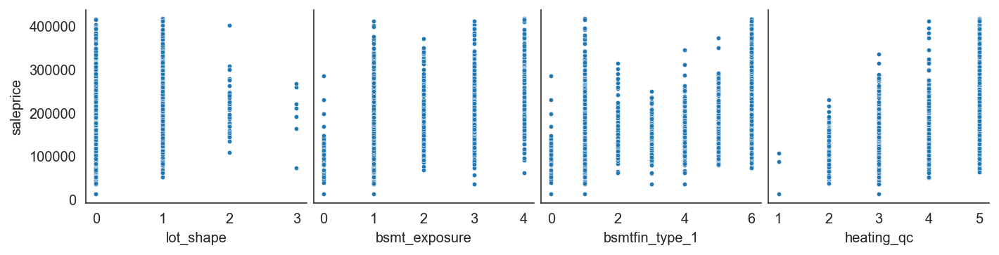

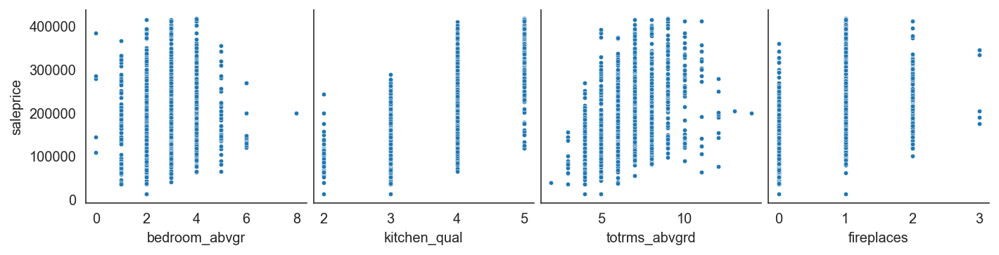

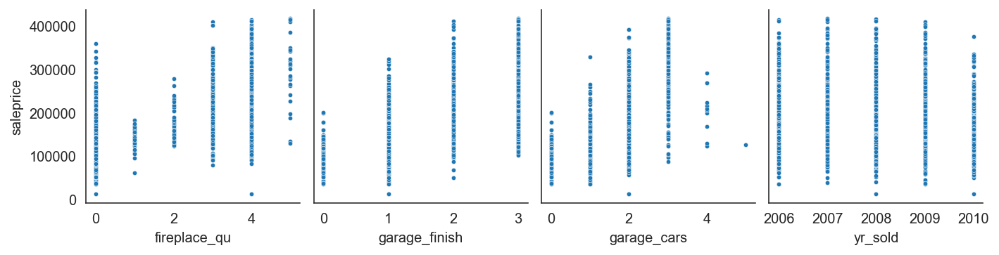

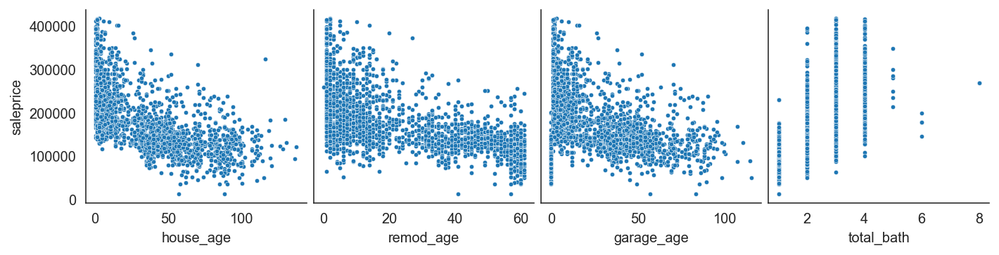

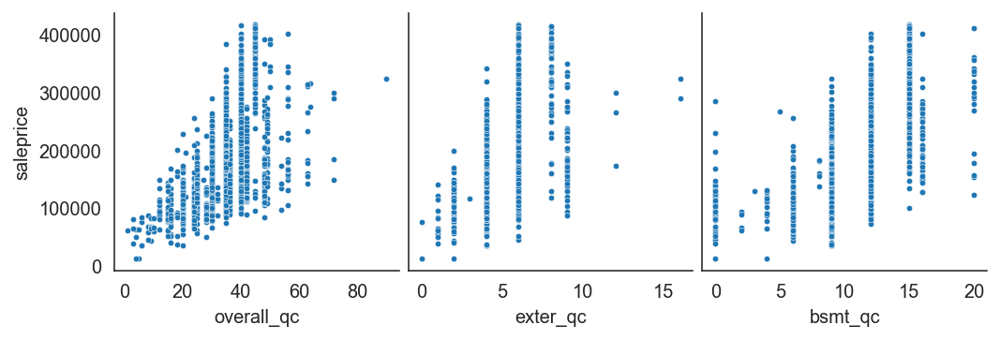

In [167]:
# plotting scatterplots of numeric distinct variables vs. SalePrice 
for i in range(0, len(dis_numeric_sig), 4):
    sns.pairplot(data=train, x_vars=dis_numeric_sig[i:i+4], y_vars=['saleprice'], plot_kws={"s":10})

For non distinct variables that were feature engineered earlier on, we can achieve an inverse relationship between `'saleprice'` and age variables (`'house_age'`, `'remod_age'` and `'garage_age'`). Meaning, the younger the house the high sale price it can fetch. 

In terms of `'total_baths'` the usual range is between 1 to 4, and houses with more than 5 baths will not affect or lead to an increase of `'saleprice'` substantially.

Lastly, in terms of all quality x condition variables, it is a constant trend where the higher the overall qc-rating, the higher the `'saleprice'`.

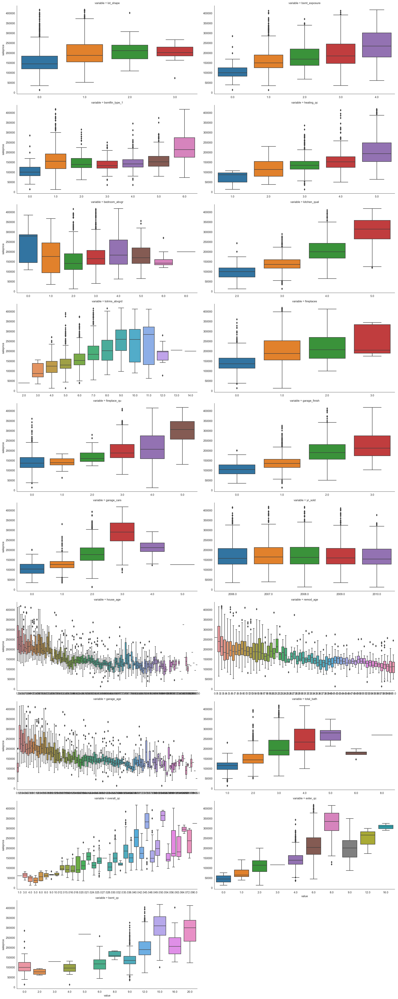

In [168]:
def boxplot(x, y, **kwargs):
    sns.boxplot(x=x, y=y)
    
f = pd.melt(train, id_vars=['saleprice'], value_vars=dis_numeric_sig)
g = sns.FacetGrid(f, col="variable",  col_wrap=2, sharex=False, sharey=False, aspect=2, height=5)
g = g.map(boxplot, "value", "saleprice")

For all variables which are qualitative measures (measurements of quality) it is normal that as the quality increases, the sale price increases as well. 

`'garage_cars'` however has a ceiling of 3 cars. If the garage were able to fit more than 3, it does not significantly increase the sale price of the house. 

In terms of `'yr_sold'` the median across the years (2006 to 2010) has been relatively constant of about $150,000 to $160,000.

`'total_bath'` being similar to `'garage_cars'` it has a ceiling of 5 in terms of median. If the house has any more than 5 houses it does not lead to a further increase of sale price. 

For qc (quality x condition) variables, they show a general upward trend against `'sale_price'`.

### 3.6 Analysis of Nominal Data
[*Jump to table of contents*](#Table-of-Contents)

In [169]:
# generate descriptive statistics for categorical columns
train.describe(include=['O'])

,ms_subclass,ms_zoning,street,alley,land_contour,lot_config,neighborhood,condition_1,condition_2,bldg_type,house_style,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,foundation,heating,central_air,electrical,garage_type,fence,misc_feature,mo_sold,sale_type
count,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002,2002
unique,16,7,2,3,4,5,28,9,8,5,8,6,5,15,15,4,6,5,2,5,7,5,5,12,9
top,20,RL,Pave,None,Lvl,Inside,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,PConc,GasA,Y,SBrkr,Attchd,None,None,6,WD
freq,747,1554,1995,1864,1810,1472,309,1727,1978,1652,1036,1603,1980,700,697,1229,887,1970,1861,1819,1179,1610,1940,341,1751


In [170]:
train[nominal].shape

(2002, 25)

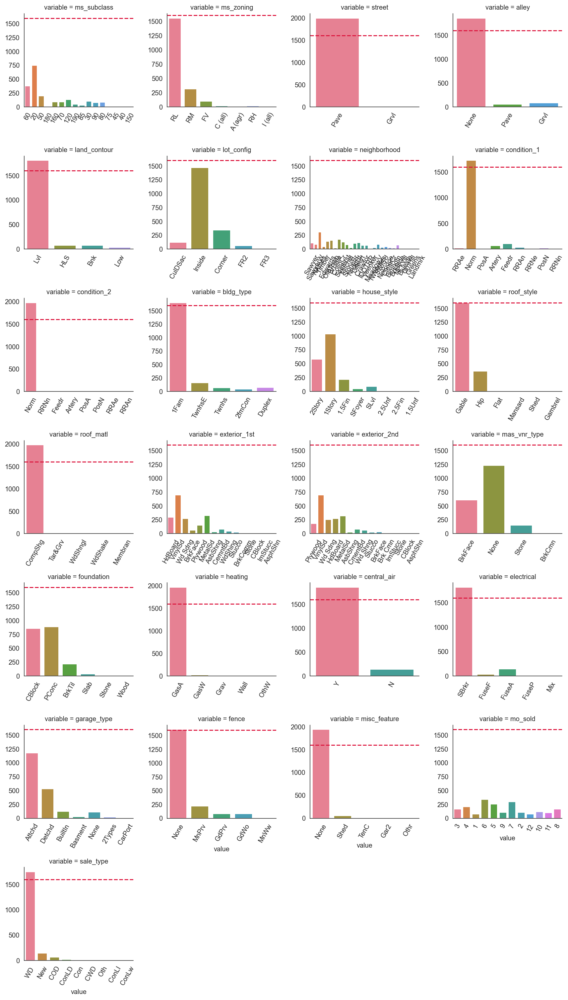

In [171]:
# plotting countplots of nominal categorical variables
data = pd.melt(train, value_vars=nominal)
g = sns.FacetGrid(data, col='variable', col_wrap=4, sharex=False, sharey=False)
plt.xticks(rotation='vertical')
g = g.map(sns.countplot, 'value', order=None, palette='husl')
[plt.setp(ax.get_xticklabels(), rotation=60) for ax in g.axes.flat]
[plt.setp(ax.axhline(0.8*train.shape[0]), ls='--', color = 'crimson') for ax in g.axes.flat] # Indicating 80% threshold
g.fig.tight_layout()
plt.show()

Nominal variables with low Nominal variables with low variability (mode takes up >=80% of records) should not be included in the model:

* `'street'`
* `'alley'`
* `'land_contour'`
* `'condition_1'`
* `'condition_2'`
* `'bldg _type'`
* `'roof_style'`
* `'roof_matl'`
* `'heating'`
* `'central_air'`
* `'electrical'`
* `'fence'`
* `'misc_features'`
* `'sale_type'`

Let's also visually take a closer look at Neighborhood and MS SubClass vs. SalePrice.

In [172]:
# splitting norminal features via freqency of variable within features at the threshold of 80%
nominal_lowsig=[i for i in nominal if train[i].value_counts(normalize=True).max()>0.8]
nominal_sig=[i for i in nominal if i not in nominal_lowsig]

nominal_sig

['ms_subclass',
 'ms_zoning',
 'lot_config',
 'neighborhood',
 'house_style',
 'exterior_1st',
 'exterior_2nd',
 'mas_vnr_type',
 'foundation',
 'garage_type',
 'mo_sold']

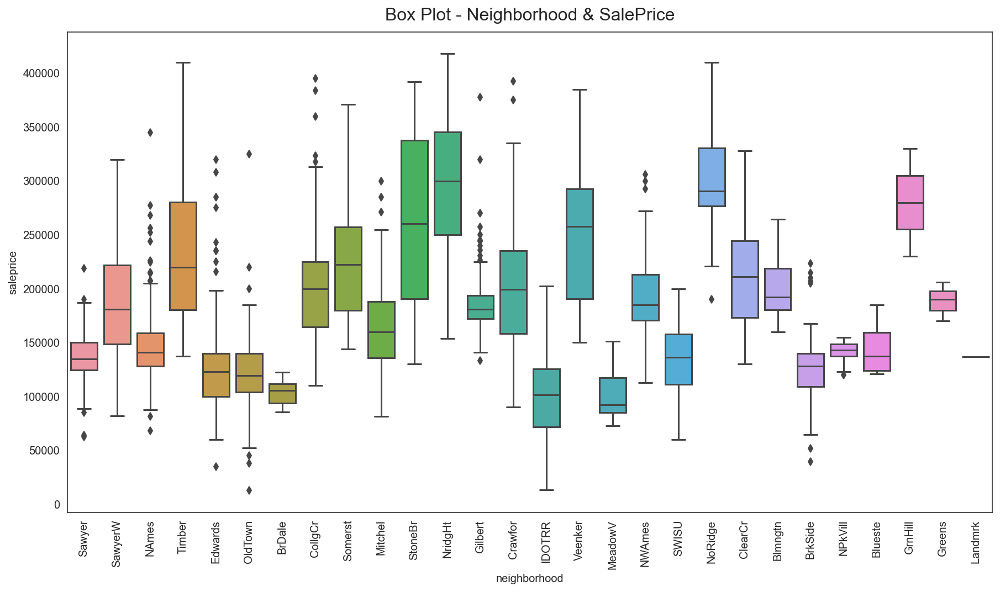

In [173]:
# plotting box plot of Neighbourhood vs SalePrice
plt.figure(figsize=(15, 8))
g = sns.boxplot(data=train, x='neighborhood', y='saleprice');
plt.xticks(rotation=90)
g.set_title('Box Plot - Neighborhood & SalePrice', fontsize=16, y=1.01);

Neighborhoods like **StoneBr**, **NridgeHt**, **NoRidge** have relatively higher `'saleprice'`. Given that Ames is a university town, it is no surprise that areas near the Iowa State University fetch higher `'saleprice'`.

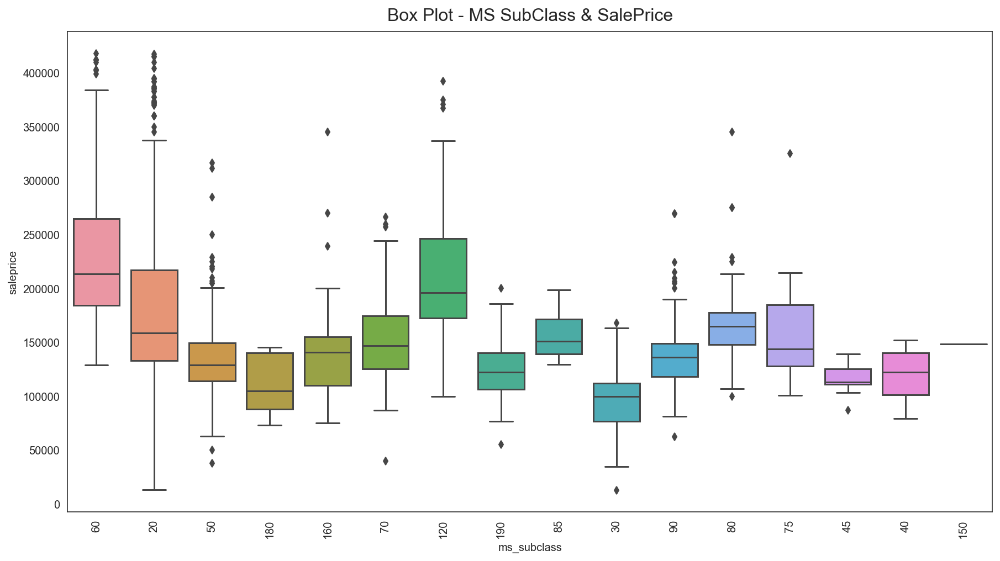

In [174]:
# plotting box plot of MS SubClass vs SalePrice
plt.figure(figsize=(15, 8))
g = sns.boxplot(data=train, x='ms_subclass', y='saleprice');
plt.xticks(rotation=90)
g.set_title('Box Plot - MS SubClass & SalePrice', fontsize=16, y=1.01);

`'saleprice'` also seem to be higher for certain `'ms_subclass'`, such as:

* 020: 1-STORY 1946 & NEWER ALL STYLES
* 060: 2-STORY 1946 & NEWER
* 080: SPLIT OR MULTI-LEVEL
* 120: 1-STORY PUD (Planned Unit Development) - 1946 & NEWER

These seem to be the newer dwelling types.

## 4. Pre-modelling Preparation
[*Jump to table of contents*](#Table-of-Contents)

In [175]:
# Combining features that are below 80% significance level. 
new_train = nominal_sig + dis_numeric + cont_numeric_sig

# removing the multiple saleprices 
new_train = [i for i in new_train if i != "saleprice"] 

# appending just 1 saleprice
new_train.append("saleprice")

In [176]:
print(train[new_train].shape)
train.shape
# Compare between new train and train to see how many column differences are there

(2002, 50)


(2002, 65)

### 4.1 Removing Multicollinearity
[*Jump to table of contents*](#Table-of-Contents)

In [177]:
# Generate a correlation matrix (absolute values)
train_corr = train[new_train].corr().abs()

# Drop rows and columns for 'saleprice' as we only want to study the features (X)
train_corr.drop(labels='saleprice', axis=0, inplace=True)
train_corr.drop(labels='saleprice', axis=1, inplace=True)

# Create a mask for the upper triange
upper_tri_mask = np.triu(np.ones_like(train_corr, dtype=bool))

# Get the masked correlation matrix
train_corr = train_corr.mask(upper_tri_mask)

# Reshape the correlation matrix into a stacked format
corr_list = train_corr.stack().sort_values(ascending=False)

# Convert the stacked data into a DataFrame
corr_list = pd.DataFrame(corr_list).reset_index()

# Name the columns of the created DataFrame
corr_list.columns = 'feature1', 'feature2', 'corr_bet_features'

# Get only the pairwise correlations that meet the specified condition
corr_list = corr_list[corr_list['corr_bet_features'] > 0.75]

In [178]:
# Generate the correlation of the features in the list to the target variable
for row in corr_list.index:
    corr_list.loc[row, '1_y_corr'] = train[new_train].corr().abs()['saleprice'][corr_list.loc[row, 'feature1']]
    corr_list.loc[row, '2_y_corr'] = train[new_train].corr().abs()['saleprice'][corr_list.loc[row, 'feature2']] 
    
corr_list

,feature1,feature2,corr_bet_features,1_y_corr,2_y_corr
0,garage_area,garage_cars,0.896709,0.643068,0.650769
1,pool_qc,pool_area,0.878726,0.036861,0.025023
2,fireplace_qu,fireplaces,0.868739,0.535063,0.466528
3,total_area,gr_liv_area,0.824188,0.843279,0.693312
4,gr_liv_area,totrms_abvgrd,0.802475,0.693312,0.459728
5,total_area,total_bsmt_sf,0.762885,0.843279,0.632117


In [179]:
# Choose the columns to drop based on logical selection. 
# Dropping either of the variables with a lower correlation with saleprice.

# Drop respective columns - on both data sets. 
train.drop(columns=['street', 'alley', 'land_contour', 'condition_1', 'condition_2', 'roof_style', 'bldg_type',
                    'roof_matl', 'heating', 'central_air', 'electrical', 'fence',  'sale_type', 'misc_feature',
                    'garage_area','pool_area','fireplaces','gr_liv_area','totrms_abvgrd','total_bsmt_sf'], inplace=True)
print(train.shape)
train.head()

(2002, 45)


,ms_subclass,ms_zoning,lot_frontage,lot_area,lot_shape,utilities,lot_config,land_slope,neighborhood,house_style,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,foundation,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,heating_qc,low_qual_fin_sf,bedroom_abvgr,kitchen_abvgr,kitchen_qual,functional,fireplace_qu,garage_type,garage_finish,garage_cars,paved_drive,wood_deck_sf,pool_qc,misc_val,mo_sold,yr_sold,saleprice,porch_area,total_area,house_age,remod_age,garage_age,total_bath,overall_qc,exter_qc,bsmt_qc,garage_qc
0,60,RL,68.0,13517,1,4,CulDSac,1,Sawyer,2Story,HdBoard,Plywood,BrkFace,289.0,CBlock,1,6,1,5,0,3,1,4,7,0,Attchd,2,2.0,2,0,0,0,3,2010,130500,44,2723.0,35,6,35.0,3.0,48,6,9,9
1,60,RL,43.0,11492,1,4,CulDSac,1,SawyerW,2Story,VinylSd,VinylSd,BrkFace,132.0,PConc,1,6,1,5,0,4,1,4,7,3,Attchd,2,2.0,2,0,0,0,4,2009,220000,74,3668.0,14,13,13.0,4.0,35,6,12,9
2,20,RL,68.0,7922,0,4,Inside,1,NAmes,1Story,VinylSd,VinylSd,None,0.0,CBlock,1,6,1,3,0,3,1,4,7,0,Detchd,1,1.0,2,0,0,0,1,2010,109000,52,2412.0,58,4,58.0,2.0,35,6,9,9
3,60,RL,73.0,9802,0,4,Inside,1,Timber,2Story,VinylSd,VinylSd,None,0.0,PConc,1,1,1,4,0,3,1,3,7,0,BuiltIn,3,2.0,2,100,0,0,4,2010,174000,0,2328.0,5,4,4.0,3.0,25,4,12,9
4,50,RL,82.0,14235,1,4,Inside,1,SawyerW,1.5Fin,Wd Sdng,Plywood,None,0.0,PConc,1,1,1,3,0,3,1,3,7,0,Detchd,1,2.0,0,0,0,0,3,2010,138500,59,2664.0,111,18,54.0,2.0,48,4,8,9


In [180]:
# Choose the columns to drop based on logical selection. 
# We only need to drop either of the variables, so the variable with a lower correlation with saleprice will be dropped.

# Drop respective columns - prevent clutter on both data sets. 
test.drop(columns=['street', 'alley', 'land_contour', 'condition_1', 'condition_2', 'roof_style', 'bldg_type',
                    'roof_matl', 'heating', 'central_air', 'electrical', 'fence',  'sale_type', 'misc_feature',
                    'garage_area','pool_area','fireplaces','gr_liv_area','totrms_abvgrd','total_bsmt_sf'], inplace=True)
print(test.shape)
test

(877, 44)


,ms_subclass,ms_zoning,lot_frontage,lot_area,lot_shape,utilities,lot_config,land_slope,neighborhood,house_style,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,foundation,bsmt_exposure,bsmtfin_type_1,bsmtfin_type_2,heating_qc,low_qual_fin_sf,bedroom_abvgr,kitchen_abvgr,kitchen_qual,functional,fireplace_qu,garage_type,garage_finish,garage_cars,paved_drive,wood_deck_sf,pool_qc,misc_val,mo_sold,yr_sold,porch_area,total_area,house_age,remod_age,garage_age,total_bath,overall_qc,exter_qc,bsmt_qc,garage_qc
0,190,RM,69.0,9142,0,4,Inside,1,OldTown,2Story,AsbShng,AsbShng,None,0.0,Stone,1,1,1,4,0,4,2,2,7,0,Detchd,1,1,2,0,0,0,4,2006,172,3560,97,57,97.0,2,48,2,6,1
1,90,RL,68.0,9662,1,4,Inside,1,Sawyer,1Story,Plywood,Plywood,None,0.0,CBlock,1,1,1,3,0,6,2,3,7,0,Attchd,3,2,2,170,0,0,8,2006,0,4684,30,30,30.0,2,20,4,12,9
2,60,RL,58.0,17104,1,4,Inside,1,Gilbert,2Story,VinylSd,VinylSd,None,0.0,PConc,3,6,1,5,0,3,1,4,7,4,Attchd,2,2,2,100,0,0,9,2006,24,2700,1,1,1.0,4,35,6,16,9
3,30,RM,60.0,8520,0,4,Inside,1,OldTown,1Story,Wd Sdng,Wd Sdng,None,0.0,CBlock,1,1,1,3,0,2,1,3,7,0,Detchd,1,2,0,0,0,0,7,2007,184,2600,85,2,73.0,1,30,6,9,6
4,20,RL,68.0,9500,1,4,Inside,1,NAmes,1Story,Plywood,Plywood,BrkFace,247.0,CBlock,1,4,1,4,0,3,1,3,7,4,Attchd,2,2,2,0,0,0,7,2009,261,3563,47,47,47.0,3,30,4,12,9
5,160,RM,21.0,1890,0,4,Inside,1,MeadowV,2Story,CemntBd,CmentBd,None,0.0,CBlock,1,3,1,3,0,3,1,3,7,0,Attchd,1,1,2,0,0,0,6,2010,64,1988,39,39,39.0,2,24,4,9,9
6,20,RM,52.0,8516,0,4,Inside,1,OldTown,1Story,MetalSd,MetalSd,None,0.0,CBlock,1,1,1,3,0,2,1,3,7,0,Detchd,1,1,2,0,0,0,5,2008,0,2270,51,3,50.0,1,24,4,9,9
7,20,RL,68.0,9286,1,4,CulDSac,2,CollgCr,1Story,HdBoard,Plywood,None,0.0,CBlock,3,5,1,3,0,3,1,4,7,0,Detchd,1,1,2,173,0,0,10,2009,0,2961,33,21,32.0,2,35,4,16,9
8,160,FV,39.0,3515,0,4,Inside,1,Somerst,2Story,VinylSd,VinylSd,None,0.0,PConc,1,1,1,5,0,2,1,4,7,0,Attchd,2,2,2,0,0,0,1,2010,111,3219,7,7,7.0,3,35,6,12,9
9,20,RL,75.0,10125,0,4,Inside,1,Mitchel,1Story,Plywood,Plywood,None,0.0,CBlock,1,5,2,3,0,3,1,3,7,2,Detchd,1,2,2,238,0,0,2,2008,83,3269,32,32,29.0,3,36,4,9,9


### 4.2 One Hot Encoding
[*Jump to table of contents*](#Table-of-Contents)

In [181]:
# Get the list of nominal features to apply one hot encoding
nominal = []
for column in train.dtypes[train.dtypes == 'object'].index:
    nominal.append(column)
nominal

['ms_subclass',
 'ms_zoning',
 'lot_config',
 'neighborhood',
 'house_style',
 'exterior_1st',
 'exterior_2nd',
 'mas_vnr_type',
 'foundation',
 'garage_type',
 'mo_sold']

In [182]:
# Apply one hot encoding to two datasets.
train1 = pd.get_dummies(train, columns=nominal, drop_first=True)
test1 = pd.get_dummies(test, columns=nominal, drop_first=True)

In [183]:
print(train1.shape)
print(test1.shape)

(2002, 146)
(877, 141)


In [184]:
# checking for difference in columns in train and test dataset after One Hot Encoding
features_not_in_test = train1.columns.difference(test1.columns)
print(features_not_in_test)
features_not_in_train = test1.columns.difference(train1.columns)
features_not_in_train

Index(['exterior_1st_CBlock', 'exterior_1st_ImStucc', 'exterior_1st_Stone', 'exterior_2nd_Stone', 'ms_subclass_150', 'ms_zoning_C (all)',
       'neighborhood_GrnHill', 'neighborhood_Landmrk', 'saleprice'],
      dtype='object')


Index(['exterior_1st_PreCast', 'exterior_2nd_Other', 'exterior_2nd_PreCast', 'mas_vnr_type_CBlock'], dtype='object')

In [185]:
train1.drop(columns=['exterior_1st_CBlock', 'exterior_1st_ImStucc', 'exterior_1st_Stone', 'exterior_2nd_Stone', 
                     'ms_subclass_150', 'ms_zoning_C (all)', 'neighborhood_GrnHill',
                    'neighborhood_Landmrk'], inplace=True)

In [186]:
test1.drop(columns=['exterior_1st_PreCast', 'exterior_2nd_Other', 'exterior_2nd_PreCast', 'mas_vnr_type_CBlock'], inplace=True)

In [187]:
# Save files to CSV
train1.to_csv('datasets/train_to_model.csv')
test1.to_csv('datasets/test_to_model.csv')

### 4.3 `train_test_split` splitting of groups
[*Jump to table of contents*](#Table-of-Contents)

In [188]:
# setting up X and y
X = train1.drop(columns = 'saleprice')
y = train1['saleprice']

print(X.shape)
print(y.shape)

(2002, 137)
(2002,)


In [189]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)

In [190]:
print(X_train.shape)
print(X_test.shape)

(1501, 137)
(501, 137)


### 4.4 Standard Scaler
[*Jump to table of contents*](#Table-of-Contents)

In [191]:
ss = StandardScaler()
X_train_ss = ss.fit_transform(X_train)
X_test_ss = ss.transform(X_test)

## 5. Modelling
[*Jump to table of contents*](#Table-of-Contents)

The main goal of this section is to try different types of linear regression techniques; mainly **LassoCV**, **RidgeCV**, **ElasticNet** and **Linear Regression**, to find out the best model based on their R2 and RSME scores. 

**Recursive Feature elimination** will also be used to reduce the total amount of features down to the top 30. Lastly a prediction would be done on the test dataset and submitted to Kaggle to get a final score.

The main workflow would be:

1. Linear Regression [All Features]
2. Linear Regression with Standard Scaler [All Features]
3. Lasso with Standard Scaler [All Features]
4. Ridge with Standard Scaler [All Features]
5. ElasticNet with Standard Scaler [All Features]
6. Recursive Feature Elimination
7. Ridge with Standard Scaler [Top 30 Features]
8. Prediction on test dataset

### 5.1 Linear Regression 
[*Jump to table of contents*](#Table-of-Contents)

In [192]:

def plot_pred(prediction, model_name):
    """function that plots y hat and y"""
    plt.figure(figsize=(12,9))
    plt.scatter(prediction, y_test, s=30, color='blue',alpha=0.5)
    plt.xlabel("Predicted Values: $\hat{y}$", fontsize = 20)
    plt.ylabel("Actual Values: $y$", fontsize = 20)
    plt.title("Predicting Housing Prices using "+model_name , fontsize = 24)
    plt.plot(y_test,y_test,color="r",alpha=0.5);
    
    
def get_comments(model_name,model,X_train,X_test,yhat_train,yhat_test):
    """function that returns train and test scores and RMSE from both"""
    print("|------------|"*3)
    print("   ",model_name,"Train R2:",model.score(X_train,y_train))
    print("   ",model_name,"Test R2:",model.score(X_test,y_test))
    print("|------------|"*3)
    print("   ",model_name,"Cross Validation:",cross_val_score(model, X_train, y_train, cv=5))
    print("   ",model_name,"Coss Validation Mean:",cross_val_score(model, X_train, y_train, cv=5).mean())
    print("|------------|"*3)
    print("   ",model_name, "Train Root Mean Square Error:", round(np.sqrt(mean_squared_error(y_train,yhat_train)),2))
    print("   ",model_name, "Test Root Mean Square Error:", round(np.sqrt(mean_squared_error(y_test,yhat_test)),2))
    print("|------------|"*3)


In [193]:
# Create an instance of linear regression
lr = LinearRegression()

# Fit model instance on train data
lr.fit(X_train, y_train);

In [194]:
cross_val_score(lr,X_train,y_train,cv=10).mean()

0.8818430613274169

In [195]:
y_hat_lr_train=lr.predict(X_train)
y_hat_lr_test = lr.predict(X_test)

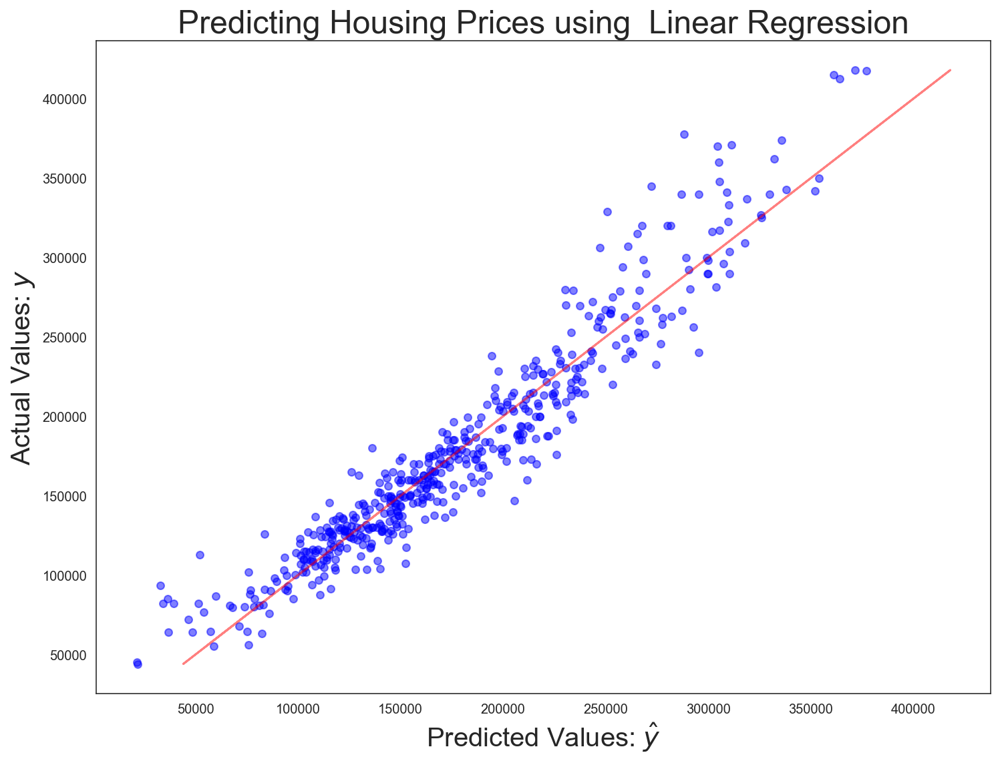

In [196]:
plot_pred(y_hat_lr_test," Linear Regression")

In [197]:
get_comments("Linear Regression",lr,X_train,X_test,y_hat_lr_train,y_hat_lr_test)

|------------||------------||------------|
    Linear Regression Train R2: 0.9103137450466802
    Linear Regression Test R2: 0.9151571448729146
|------------||------------||------------|
    Linear Regression Cross Validation: [0.88750838 0.92383298 0.88048907 0.88051536 0.84352806]
    Linear Regression Coss Validation Mean: 0.8831747717516081
|------------||------------||------------|
    Linear Regression Train Root Mean Square Error: 20334.27
    Linear Regression Test Root Mean Square Error: 20419.74
|------------||------------||------------|


### 5.2 Linear Regression with Standard Scaler
[*Jump to table of contents*](#Table-of-Contents)

In [198]:
# Fit model instance on scaled train data
lr.fit(X_train_ss, y_train);

In [199]:
cross_val_score(lr,X_train_ss,y_train,cv=10).mean()

-1.4999382306835593e+23

In [200]:
y_hat_lr_train_ss =lr.predict(X_train_ss)
y_hat_lr_test_ss = lr.predict(X_test_ss)

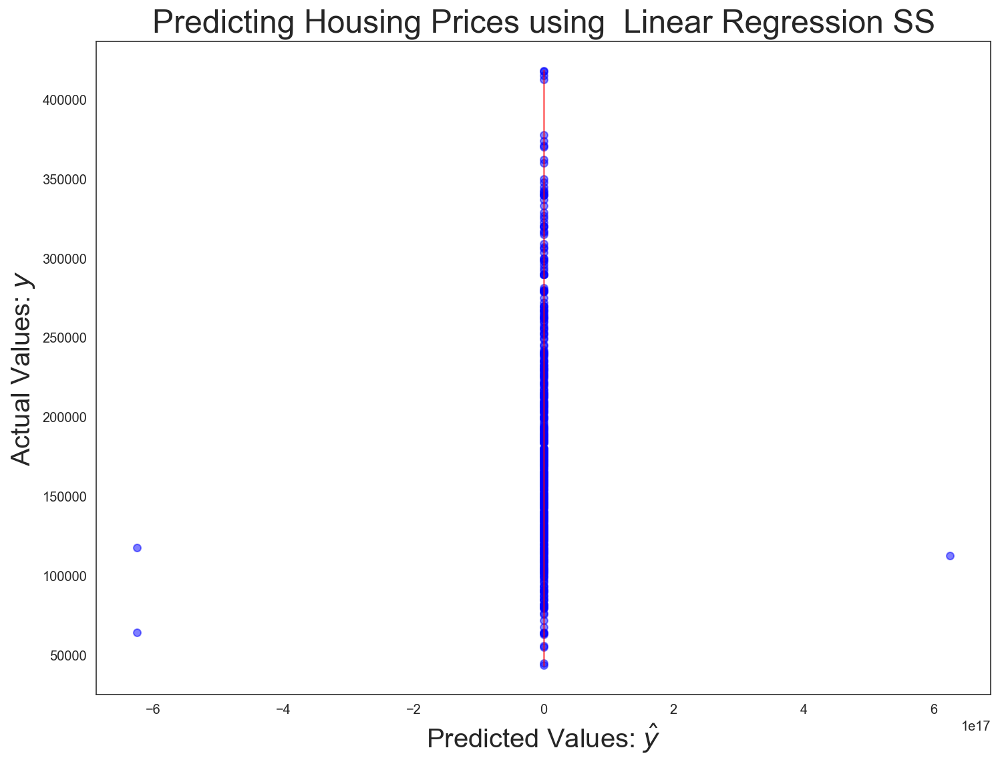

In [201]:
plot_pred(y_hat_lr_test_ss," Linear Regression SS")

In [202]:
get_comments("Linear Regression SS",lr,X_train_ss,X_test_ss,y_hat_lr_train_ss,y_hat_lr_test_ss)

|------------||------------||------------|
    Linear Regression SS Train R2: 0.9103100929683383
    Linear Regression SS Test R2: -4.763818340882017e+23
|------------||------------||------------|
    Linear Regression SS Cross Validation: [-3.17467313e+23  9.23817254e-01 -5.08407451e+23 -1.00795584e+12
 -4.22672496e+24]
    Linear Regression SS Coss Validation Mean: -1.0105199447553218e+24
|------------||------------||------------|
    Linear Regression SS Train Root Mean Square Error: 20334.68
    Linear Regression SS Test Root Mean Square Error: 4.838605399112363e+16
|------------||------------||------------|


### 5.3 LassoCV with Standard Scaler 
[*Jump to table of contents*](#Table-of-Contents)

Regularization favors simpler models to more complex models to prevent your model from overfitting to the data, hence we will use LassoCV, RidgeCV and Elastic Net to regularise the data.

Lasso stands for Least Absolute Shrinkage Selector Operator. Lasso assigns a penalty to the coefficients in the linear model using the formula below and eliminates variables with coefficients that zero. This is called shrinkage or the process where data values are shrunk to a central point such as a mean. ([*source*](https://medium.com/@vijay.swamy1/lasso-versus-ridge-versus-elastic-net-1d57cfc64b58))

In [203]:
lasso_alphas = np.logspace(0, 10, 2000)
lasso = LassoCV(alphas = lasso_alphas, cv=10)
lasso.fit(X_train_ss, y_train)

LassoCV(alphas=array([1.00000000e+00, 1.01158528e+00, 1.02330478e+00, ...,
       9.77225965e+09, 9.88547401e+09, 1.00000000e+10]),
        cv=10)

In [204]:
lasso.alpha_

162.59438840426304

In [205]:
lasso_coef_df = pd.DataFrame({'Features':X.columns,'coef': lasso.coef_,'abs_coef': np.abs(lasso.coef_)})
lasso_coef_df.sort_values("abs_coef",ascending=False)

,Features,coef,abs_coef
24,total_area,28818.725659,28818.725659
25,house_age,-10486.922494,10486.922494
29,overall_qc,10110.187614,10110.187614
72,neighborhood_NridgHt,6199.795093,6199.795093
13,kitchen_qual,5725.225681,5725.225681
28,total_bath,5225.250464,5225.250464
1,lot_area,5123.097909,5123.097909
117,foundation_Slab,4707.707997,4707.707997
6,bsmt_exposure,4055.694237,4055.694237
33,ms_subclass_160,-4030.878075,4030.878075


In [206]:
y_hat_lasso_train = lasso.predict(X_train_ss)
y_hat_lasso_test = lasso.predict(X_test_ss)

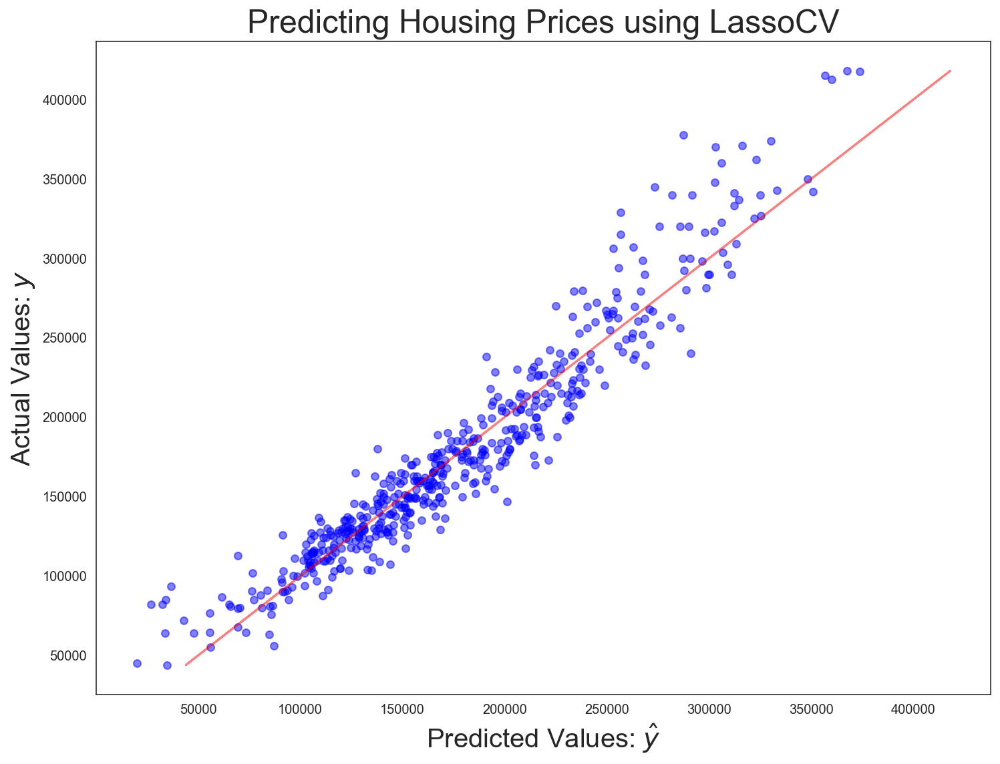

In [207]:
plot_pred(y_hat_lasso_test,"LassoCV")

In [208]:
get_comments("LassoCV", lasso, X_train_ss, X_test_ss, y_hat_lasso_train, y_hat_lasso_test)

|------------||------------||------------|
    LassoCV Train R2: 0.9065950577167717
    LassoCV Test R2: 0.9182680965497259
|------------||------------||------------|
    LassoCV Cross Validation: [0.88859067 0.92868317 0.88577459 0.88089999 0.84481054]
    LassoCV Coss Validation Mean: 0.8857517903430058
|------------||------------||------------|
    LassoCV Train Root Mean Square Error: 20751.55
    LassoCV Test Root Mean Square Error: 20041.88
|------------||------------||------------|


### 5.4 RidgeCV with Standard Scaler 
[*Jump to table of contents*](#Table-of-Contents)

Ridge assigns a penalty that is the squared magnitude of the coefficients to the loss function multiplied by lambda. As Lasso does, ridge also adds a penalty to coefficients the model overemphasizes.([*source*](https://medium.com/@vijay.swamy1/lasso-versus-ridge-versus-elastic-net-1d57cfc64b58))

In [209]:
ridge_alphas = np.logspace(0.1, 10, 1000)
ridge_cv = RidgeCV(alphas = ridge_alphas, cv=10, scoring="r2")
ridge_cv.fit(X_train_ss, y_train)

RidgeCV(alphas=array([1.25892541e+00, 1.28798234e+00, 1.31770993e+00, 1.34812366e+00,
       1.37923935e+00, 1.41107322e+00, 1.44364184e+00, 1.47696216e+00,
       1.51105155e+00, 1.54592774e+00, 1.58160890e+00, 1.61811360e+00,
       1.65546087e+00, 1.69367013e+00, 1.73276130e+00, 1.77275471e+00,
       1.81367121e+00, 1.85553209e+00, 1.89835914e+00, 1.94217468e+00,
       1.98700151e+00, 2.03286298e+0...
       5.91659813e+09, 6.05315761e+09, 6.19286898e+09, 6.33580499e+09,
       6.48204007e+09, 6.63165037e+09, 6.78471378e+09, 6.94131002e+09,
       7.10152060e+09, 7.26542897e+09, 7.43312046e+09, 7.60468240e+09,
       7.78020412e+09, 7.95977700e+09, 8.14349456e+09, 8.33145246e+09,
       8.52374857e+09, 8.72048301e+09, 8.92175824e+09, 9.12767904e+09,
       9.33835265e+09, 9.55388876e+09, 9.77439960e+09, 1.00000000e+10]),
        cv=10, scoring='r2')

In [210]:
ridge_cv.alpha_

31.426592724119057

In [211]:
y_hat_ridge_train = ridge_cv.predict(X_train_ss)
y_hat_ridge_test = ridge_cv.predict(X_test_ss)

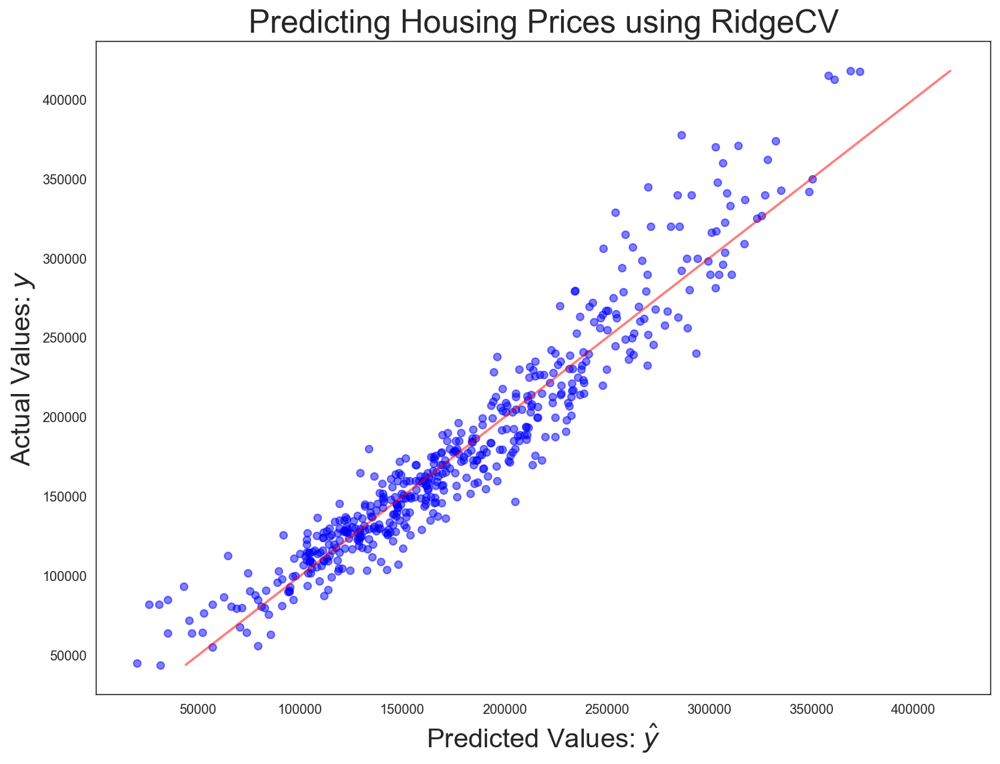

In [212]:
plot_pred(y_hat_ridge_test,"RidgeCV")

In [213]:
get_comments("RidgeCV",ridge_cv,X_train_ss,X_test_ss,y_hat_ridge_train,y_hat_ridge_test)

|------------||------------||------------|
    RidgeCV Train R2: 0.9086361380426715
    RidgeCV Test R2: 0.9165546376256963
|------------||------------||------------|
    RidgeCV Cross Validation: [0.89367439 0.92846846 0.88341082 0.88455708 0.84003213]
    RidgeCV Coss Validation Mean: 0.8860285763430324
|------------||------------||------------|
    RidgeCV Train Root Mean Square Error: 20523.57
    RidgeCV Test Root Mean Square Error: 20250.87
|------------||------------||------------|


### 5.5 ElasticNet with Standard Scaler 
[*Jump to table of contents*](#Table-of-Contents)

Elastic Net combines characteristics of both lasso and ridge. Elastic Net reduces the impact of different features while not eliminating all of the features.([*source*](https://medium.com/@vijay.swamy1/lasso-versus-ridge-versus-elastic-net-1d57cfc64b58))

In [214]:
enet=ElasticNetCV(l1_ratio = np.linspace(0.1, 1.0, 25), n_alphas=100, cv=10)
enet.fit(X_train_ss,y_train)

ElasticNetCV(cv=10,
             l1_ratio=array([0.1   , 0.1375, 0.175 , 0.2125, 0.25  , 0.2875, 0.325 , 0.3625,
       0.4   , 0.4375, 0.475 , 0.5125, 0.55  , 0.5875, 0.625 , 0.6625,
       0.7   , 0.7375, 0.775 , 0.8125, 0.85  , 0.8875, 0.925 , 0.9625,
       1.    ]))

In [215]:
enet.alpha_

161.53702466332564

In [216]:
y_hat_enet_train = enet.predict(X_train_ss)
y_hat_enet_test = enet.predict(X_test_ss)

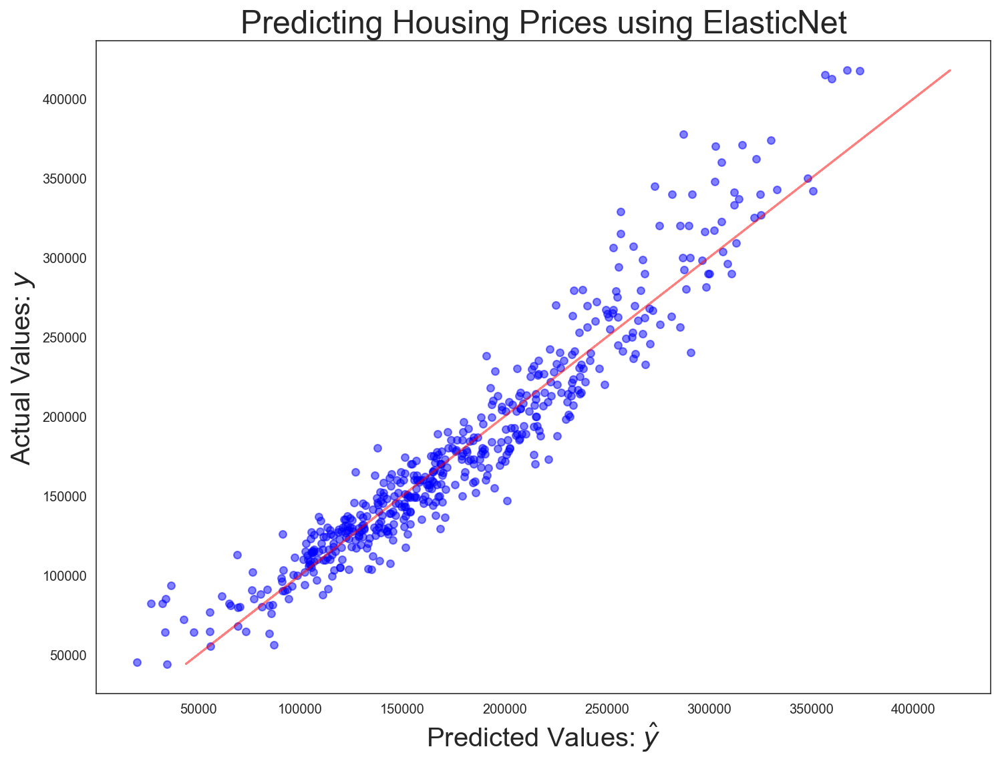

In [217]:
plot_pred(y_hat_enet_test,"ElasticNet")

In [218]:
get_comments("ElasticNet", enet, X_train_ss, X_test_ss, y_hat_enet_train, y_hat_enet_test)

|------------||------------||------------|
    ElasticNet Train R2: 0.9066117713584887
    ElasticNet Test R2: 0.9182700215605613
|------------||------------||------------|
    ElasticNet Cross Validation: [0.88845854 0.92866126 0.88576441 0.88086909 0.84473522]
    ElasticNet Coss Validation Mean: 0.8856977046669752
|------------||------------||------------|
    ElasticNet Train Root Mean Square Error: 20749.69
    ElasticNet Test Root Mean Square Error: 20041.64
|------------||------------||------------|


### 5.6 Recursive Feature Elimination
[*Jump to table of contents*](#Table-of-Contents)

The goal of recursive feature elimination (RFE) is to select features by recursively considering smaller and smaller sets of features. It is a wrapper type feature selection algorithm which is used to help select the best features to run a model. The model ranks features based on their importance and discards the least important features refits the model until the desired amount of features is left.

In [219]:
from sklearn.feature_selection import RFE

ridge_alphas = np.logspace(0.1, 10, 1000)
ridge_cv = RidgeCV(alphas=ridge_alphas, cv=10, scoring="r2")
rfe = RFE(lasso,n_features_to_select=30)
rfe.fit(X_train_ss,y_train)

RFE(estimator=LassoCV(alphas=array([1.00000000e+00, 1.01158528e+00, 1.02330478e+00, ...,
       9.77225965e+09, 9.88547401e+09, 1.00000000e+10]),
                      cv=10),
    n_features_to_select=30)

In [220]:
rfe.ranking_

array([  4,   1,  83,  21,  68,   9,   1,   1,  39,  41,  42,  17,  13,
         1,   1,   1,  15,  49,  32,  16,  77,  72,  92,  18,   1,   1,
        10, 100,   1,   1,  20,   5,  84,   1,  23, 103,   1,   1,  60,
        97,   3,  67,  46,  27, 107, 104,  33,  25,  22,  73,  89,  94,
        29,  63,  45,  30,  80,  26,  24,  70,   1,   7,   1,   1,  91,
        93,   1,   1,   1,  78,   1,   6,   1,   1,  51,   1,   1,  99,
         1, 101,  69,  85,   1,  57,  59,   2,  50,  82,  96,  37,   1,
        40,  31,   8, 102, 106, 108,  12,  61,  65,  38,  47,  75,   1,
       105,  58,  64,  52,  90,  88,  11,  74,  86,  35,  36,  87,   1,
         1,  55,  98,  71,  76,  66,  53,  95,  14,  62,  34,  79,  44,
        48,  56,  81,  43,  19,  54,  28])

In [221]:
rfe_rank=sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), X.columns))
rfe_rank

[(1, 'bsmt_exposure'),
 (1, 'bsmtfin_type_1'),
 (1, 'exterior_1st_BrkFace'),
 (1, 'exterior_2nd_CmentBd'),
 (1, 'fireplace_qu'),
 (1, 'foundation_PConc'),
 (1, 'foundation_Slab'),
 (1, 'functional'),
 (1, 'house_age'),
 (1, 'house_style_1Story'),
 (1, 'kitchen_qual'),
 (1, 'lot_area'),
 (1, 'ms_subclass_160'),
 (1, 'ms_subclass_20'),
 (1, 'ms_subclass_30'),
 (1, 'neighborhood_CollgCr'),
 (1, 'neighborhood_Edwards'),
 (1, 'neighborhood_Gilbert'),
 (1, 'neighborhood_MeadowV'),
 (1, 'neighborhood_Mitchel'),
 (1, 'neighborhood_NAmes'),
 (1, 'neighborhood_NWAmes'),
 (1, 'neighborhood_NridgHt'),
 (1, 'neighborhood_OldTown'),
 (1, 'neighborhood_Sawyer'),
 (1, 'neighborhood_SawyerW'),
 (1, 'neighborhood_StoneBr'),
 (1, 'overall_qc'),
 (1, 'total_area'),
 (1, 'total_bath'),
 (2, 'house_style_2Story'),
 (3, 'ms_subclass_50'),
 (4, 'lot_frontage'),
 (5, 'bsmt_qc'),
 (6, 'neighborhood_NoRidge'),
 (7, 'neighborhood_Crawfor'),
 (8, 'exterior_1st_MetalSd'),
 (9, 'mas_vnr_area'),
 (10, 'remod_age'),
 

In [222]:
rfe_rank=sorted(zip(map(lambda x: round(x, 4), rfe.ranking_), X.columns))

In [223]:
# selecting all ranking 1   
rfe_list=[i[1] for i in rfe_rank]
rfe30=rfe_list[:30]  # picked 30 as they are the variables which are ranked 1.

In [224]:
rfe_train=X[rfe30]

### 5.6 RidgeCV with Standard Scaler after RFE
[*Jump to table of contents*](#Table-of-Contents)

In [225]:
X_30=rfe_train
y = train['saleprice']
X_train30, X_test30, y_train30, y_test30 = train_test_split(X_30, y, random_state = 42)

X_train_ss=ss.fit_transform(X_train30)
X_test_ss=ss.transform(X_test30)

In [226]:
ridge_alphas = np.logspace(0.1, 10, 1000)
ridge_cv = RidgeCV(alphas = ridge_alphas, cv=10, scoring="r2")
ridge_cv.fit(X_train_ss, y_train30)

RidgeCV(alphas=array([1.25892541e+00, 1.28798234e+00, 1.31770993e+00, 1.34812366e+00,
       1.37923935e+00, 1.41107322e+00, 1.44364184e+00, 1.47696216e+00,
       1.51105155e+00, 1.54592774e+00, 1.58160890e+00, 1.61811360e+00,
       1.65546087e+00, 1.69367013e+00, 1.73276130e+00, 1.77275471e+00,
       1.81367121e+00, 1.85553209e+00, 1.89835914e+00, 1.94217468e+00,
       1.98700151e+00, 2.03286298e+0...
       5.91659813e+09, 6.05315761e+09, 6.19286898e+09, 6.33580499e+09,
       6.48204007e+09, 6.63165037e+09, 6.78471378e+09, 6.94131002e+09,
       7.10152060e+09, 7.26542897e+09, 7.43312046e+09, 7.60468240e+09,
       7.78020412e+09, 7.95977700e+09, 8.14349456e+09, 8.33145246e+09,
       8.52374857e+09, 8.72048301e+09, 8.92175824e+09, 9.12767904e+09,
       9.33835265e+09, 9.55388876e+09, 9.77439960e+09, 1.00000000e+10]),
        cv=10, scoring='r2')

In [227]:
ridge_cv.alpha_

7.99286913971357

In [228]:
y_hat_ridge_train = ridge_cv.predict(X_train_ss)
y_hat_ridge_test = ridge_cv.predict(X_test_ss)

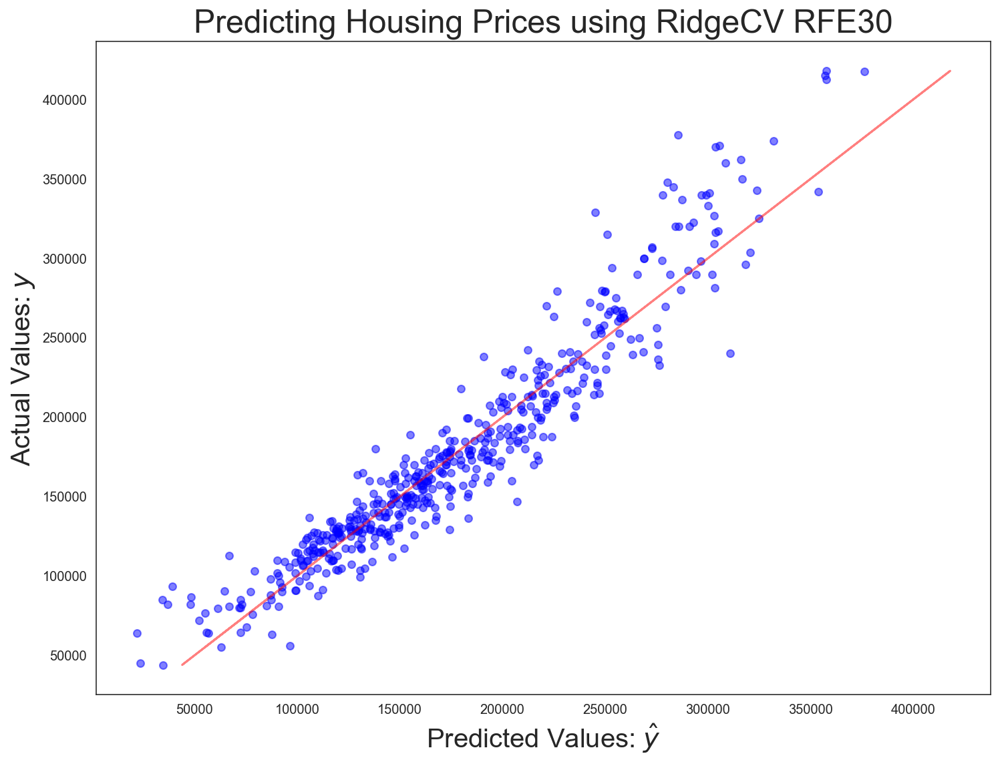

In [229]:
plot_pred(y_hat_ridge_test,"RidgeCV RFE30")

In [230]:
get_comments("RidgeCV RFE30",ridge_cv,X_train_ss,X_test_ss,y_hat_ridge_train,y_hat_ridge_test)

|------------||------------||------------|
    RidgeCV RFE30 Train R2: 0.8929786956340221
    RidgeCV RFE30 Test R2: 0.9078239638864738
|------------||------------||------------|
    RidgeCV RFE30 Cross Validation: [0.890552   0.92215587 0.88573602 0.8818063  0.85100085]
    RidgeCV RFE30 Coss Validation Mean: 0.886250208442706
|------------||------------||------------|
    RidgeCV RFE30 Train Root Mean Square Error: 22212.67
    RidgeCV RFE30 Test Root Mean Square Error: 21283.92
|------------||------------||------------|


### 5.7 LassoCV with Standard Scaler after RFE
[*Jump to table of contents*](#Table-of-Contents)

In [231]:
lasso_alphas = np.logspace(0, 10, 2000)
lasso = LassoCV(alphas = lasso_alphas, cv=10)
lasso.fit(X_train_ss, y_train30)

LassoCV(alphas=array([1.00000000e+00, 1.01158528e+00, 1.02330478e+00, ...,
       9.77225965e+09, 9.88547401e+09, 1.00000000e+10]),
        cv=10)

In [232]:
lasso.alpha_

1.0

In [233]:
y_hat_lasso_train = lasso.predict(X_train_ss)
y_hat_lasso_test = lasso.predict(X_test_ss)

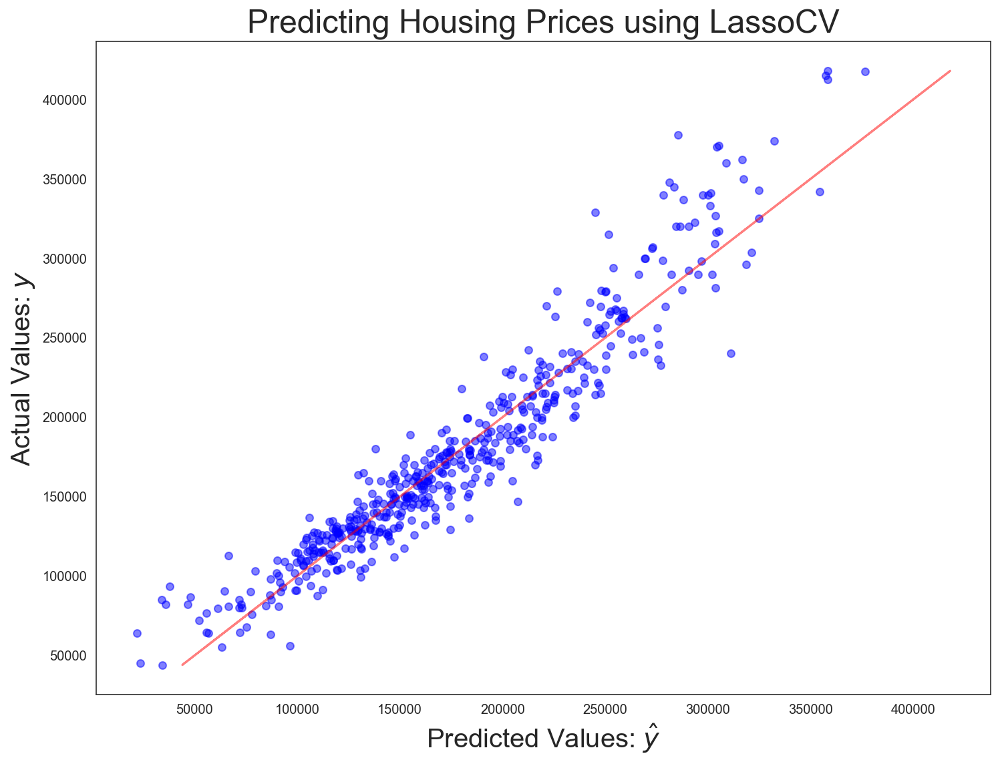

In [234]:
plot_pred(y_hat_lasso_test,"LassoCV")

In [235]:
get_comments("LassoCV", lasso, X_train_ss, X_test_ss, y_hat_lasso_train, y_hat_lasso_test)

|------------||------------||------------|
    LassoCV Train R2: 0.8930023985544657
    LassoCV Test R2: 0.9080407309356394
|------------||------------||------------|
    LassoCV Cross Validation: [0.89100526 0.92239448 0.88566167 0.88127178 0.8509704 ]
    LassoCV Coss Validation Mean: 0.88626071889359
|------------||------------||------------|
    LassoCV Train Root Mean Square Error: 22210.21
    LassoCV Test Root Mean Square Error: 21258.88
|------------||------------||------------|


After playing around with RFE (setting to 50 variables), I have reduced the number to 30 as the R2 scores dropped, and the R2 scores between the train and test set. However after reducing the number of features and inserting it into the **RidgeCV model** & **LassoCV model** (best performing model) for trial and error, the R2 fell as well. Most likely due to overfitting as train scores fell. 

We will hence proceed with model 5.3 Lasso CV with Standard Scaler, we the R2 scores & cross validations scores are decently close together & having a decently high score. Furthermore, the RMSE between train and test set is smaller as compared to other models. 

There is some slight overfitting as both R2 and RMSE performs slightly better on both tests as compared to trains. This may be improved by reducing the number features or better feature engineering. This would allow the model to better able to predict the outcome of `'saleprice'`.

## 6. `'test.csv'` prediction
[*Jump to table of contents*](#Table-of-Contents)

In [236]:
features_not_in_test

Index(['exterior_1st_CBlock', 'exterior_1st_ImStucc', 'exterior_1st_Stone', 'exterior_2nd_Stone', 'ms_subclass_150', 'ms_zoning_C (all)',
       'neighborhood_GrnHill', 'neighborhood_Landmrk', 'saleprice'],
      dtype='object')

In [237]:
new_col_to_add = [col for col in features_not_in_test if col != 'saleprice']
new_col_to_add
new_col_to_add1 = [col for col in features_not_in_train if col != 'saleprice']
new_col_to_add1

['exterior_1st_PreCast',
 'exterior_2nd_Other',
 'exterior_2nd_PreCast',
 'mas_vnr_type_CBlock']

In [238]:
X_test = test1
y = train1["saleprice"]

print(X_train.shape)
print(X_test.shape)

X_test.head()
ss = StandardScaler()
X_train_ss = ss.fit_transform(X_train)
X_test_ss = ss.transform(X_test)

(1501, 137)
(877, 137)


In [239]:
lasso_alphas = np.logspace(0, 10, 2000)
lasso = LassoCV(alphas = lasso_alphas, cv=10)
lasso.fit(X_train_ss, y_train)

test_predictions = lasso.predict(X_test_ss)
test_predictions = pd.Series(test_predictions)

In [240]:
type(test_predictions)

pandas.core.series.Series

In [241]:
#joining the id and prediction and saving into a csv file
submission["saleprice"]=test_predictions
submission_lasso=submission
submission_lasso.sort_values("Id",ascending=True,inplace=True)
submission_lasso.to_csv("/Users/juneteo/Desktop/dsi25-workspace/project_2/datasets/submission.csv",index=False)

<ipython-input-241-b0a7825da336>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  submission["saleprice"]=test_predictions
<ipython-input-241-b0a7825da336>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  submission_lasso.sort_values("Id",ascending=True,inplace=True)


In [242]:
submission_lasso

,Id,saleprice
703,2,278171.832141
705,4,153695.083984
119,6,201941.667061
311,7,245872.449601
400,17,204115.856029
315,18,303518.826454
790,22,231555.074462
607,27,112734.157983
390,31,89279.200051
752,36,177238.705423


## Recommendations

What features are most relevant for sellers to increase the price of a home?
> Some features such as garage area, which determines the number of cars being able to be parked, are able to boost sale price as well. The ideal range is 1-3 cars. 

> Number of baths being similar to garage area, has a ceiling of 5 in terms of median. If the house has any more than 5 baths it does not lead to a further increase of sale price.

>It is also not surprising that better overall quality and newer houses (as indicated by MS Subclass 020). If the house is old, home buyers can also remodel their homes and beautify it in order to increase sale price.

> The exterior is also important both in terms of masonry veneer area and quality of the exterior. Should home-sellers want to invest in remodelling, they can invest in these areas to increase the price of the house.

In what ways can a buyer purchase competitively prices homes according to neighbourhoods?
> Firstly, north Ames is the most popular out of 28 neighbourhood, but it fetches a median price of USD150,000. This might be due to its close proximity to schools and universities whereby it targets mainly college students who do not stay in Iowa or buyers who would like to rent out to them. Hence the less luxurious nature of the house. Hence home-sellers can aim for quantity sells rather than selling the house at a high price. 

>Home owners who are looking for property investments can look to purchase in this area as it is a stone throw away from the Iowa State University, and can gain long term income by renting rooms out to students.  

>Neighborhood is also key. As the old saying goes, when it comes to housing, it's all 'location, location, 'location'. Neighborhoods such as Northridge Heights and Stone Brook positively impact Sale Price. Houses in stone brook generally fetch a higher price as it is located further north of north Ames,  being a stone throw away from a heritage park.

What feature quality is the most relevant to the price of a home?
> General ones to expect are sizes of house, and quality of house, age of home, if not age from remodelling. 

> House flippers can consider increasing total area by building another storey, if the corresponding increase in Sale Price can offset the cost.

> Other actionable areas include renovation to improve overall quality, kitchen quality and increase the number of bathroom. Unfortunately, it is impossible to change the neighborhood, so the flippers should first ensure that the house they purchase to flip is in a good location like Northridge Heights and Stone Brook.

What locations should prospective home-owners avoid if they are on a tight budget?
> Home-owners on a tight budget should avoid neighborhoods like Stone Brooke, Northridge Heights and North Ridge have relatively higher sale price. 

What features should home-owners exclude to reduce cost?
> Home-owners can avoid investing on miscelleous features or doing up the pool to increase pool size, as such features cost alot but do not fetch a high return on investment.


